In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
import warnings
from utils import ModelComparator, ModelEnsemble
from mlp import MLPClassifier
from xgboost import XGBClassifier
warnings.filterwarnings(action="ignore")

In [137]:
X = pd.read_table('x_train.txt', sep=" ", header=None)
X.columns = [str(i) for i in range(X.shape[1])]
y = pd.read_table('y_train.txt', header=None).to_numpy(dtype=np.int8).squeeze()

# Feature selection

Will be performed independently from original column names, for example: <br>
`Selected features = [0, 5, 440]` may in fact be `[1, 7, 468]` from original dataset

## VIF

Performed iteratively according to methodology:
1. calculate VIF of every variable and choose those with `VIF > 5`
2. Among those found in point 1, remove this variable with **lowest** Mutual Information Score (with relation to target `y`)

In [10]:
# Only results of this method provided (it is computationally expensive)
from utils import VIF_SELECTED_VARIABES

print(VIF_SELECTED_VARIABES)

[13, 178, 194, 298, 305, 117, 228, 462, 414, 425, 0, 1, 3, 4, 5, 6, 7, 8, 9]


In [94]:
# Note: This deletion will change columns order! (col 2 becomes 0, for example)
#       Perform it only ONCE!
X = np.delete(X, VIF_SELECTED_VARIABES, axis=1)

print(X.shape)

(5000, 481)


## ANOVA F-test

In [12]:
from sklearn.feature_selection import f_classif

In [ ]:
F_statistic_values, p_values = f_classif(X, y)

top_f_test_features = np.argsort(p_values)
bottom_f_test_features = np.argsort(p_values)[::-1]
plt.figure(dpi=120, figsize=(5,5))
plt.hist(p_values, edgecolor='black', linewidth=1.2, color="orange", bins=40)
plt.title("ANOVA F-test p values distribution")
plt.show()

## ReliefF

In [15]:
from skrebate import ReliefF

In [ ]:
relief = ReliefF(n_neighbors=10, n_features_to_select=10)
relief.fit(np.array(X), y)

top_relief_features = relief.top_features_
bottom_relief_features = top_relief_features[::-1]

plt.hist(relief.feature_importances_, edgecolor='black', bins=50, linewidth=1.2)
plt.title("ReliefF feature importances distribution")
plt.show()

## Mutual Information

In [18]:
from sklearn.feature_selection import mutual_info_classif

In [19]:
mi = mutual_info_classif(X,y)
top_mi_features = np.argsort(mi)[::-1]
bottom_mi_features = top_mi_features[::-1]

In [132]:
common_bottom_n = 400

common_worst = list(
    set.intersection(
        set(bottom_f_test_features[:common_bottom_n]),
        set(bottom_mi_features[:common_bottom_n]),
        set(bottom_relief_features[:common_bottom_n])
    ))

common_worst.sort()

print(f'Common worst {common_bottom_n} variables: {len(common_worst)}')

Common worst 400 variables: 279


In [133]:
# Przed usunięciem kolumn:
original_indices = np.arange(X.shape[1])


print(X.shape)
# Usuwasz kolumny:
X = np.delete(X, VIF_SELECTED_VARIABES, axis=1)
X = np.delete(X, common_worst, axis=1)
original_indices = np.delete(original_indices, VIF_SELECTED_VARIABES)
original_indices = np.delete(original_indices, common_worst)

print("Aktualne kolumny odpowiadają oryginalnym indeksom:", original_indices)
# X = np.delete(X, VIF_SELECTED_VARIABES, axis=1)
# X= np.delete(X, common_worst, axis=1)
# print(X.shape)


(5000, 500)
Aktualne kolumny odpowiadają oryginalnym indeksom: [  2  11  12  14  16  23  24  26  28  31  33  34  36  37  39  40  41  45
  47  48  50  53  55  60  61  66  71  73  75  76  77  82  86  88  90  91
  92  94  96  97 100 109 113 119 121 122 125 126 133 135 136 137 140 142
 146 147 150 152 154 157 158 163 165 169 170 171 176 180 181 183 185 186
 192 201 203 206 208 209 211 213 214 215 218 223 225 226 231 234 236 237
 238 241 242 244 245 246 251 253 263 274 278 281 285 286 287 290 293 294
 296 297 300 301 307 310 311 313 314 316 318 322 323 325 329 330 331 332
 333 335 336 337 339 342 343 344 351 352 354 355 356 358 359 360 366 367
 368 371 376 379 384 386 387 388 389 395 397 398 399 400 401 405 409 413
 415 416 422 424 426 430 431 434 435 436 438 440 442 443 444 446 447 448
 451 454 457 458 459 460 463 465 466 468 471 476 477 479 482 484 486 488
 493 494 495 497]


In [134]:
X = pd.DataFrame(X)

# Próba genetycznego

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from deap import base, creator, tools, algorithms

MAX_FEATURES = 5            
N_POP = 100                 
N_GEN = 30                  
CX_PB = 0.7                 
INIT_MUT_PB = 0.15         
RANDOM_STATE = 42432           
IMMIGRANT_RATE = 0.35       
ELITE_SIZE = 0.1            

creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)

toolbox = base.Toolbox()
toolbox.register("attr_bool", np.random.randint, 0, 2)
toolbox.register("individual", tools.initRepeat, creator.Individual,
                 toolbox.attr_bool, n=X.shape[1])
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

def evaluate_individual(individual, X, y):
    """Ocena osobnika z inteligentną naprawą i ważnością cech"""
    bits = [i for i, b in enumerate(individual) if b == 1]
    
    if len(bits) > MAX_FEATURES:
        clf = RandomForestClassifier(n_estimators=50, random_state=RANDOM_STATE)
        clf.fit(X.iloc[:, bits], y)
        importances = clf.feature_importances_
        best_indices = np.argsort(importances)[-MAX_FEATURES:]
        bits = [bits[i] for i in best_indices]
        
    elif len(bits) < MAX_FEATURES:
        all_idx = set(range(X.shape[1]))
        missing = list(all_idx - set(bits))
        if missing:
            clf = RandomForestClassifier(n_estimators=50, random_state=RANDOM_STATE)
            clf.fit(X.iloc[:, missing], y)
            importances = clf.feature_importances_
            best_indices = np.argsort(importances)[-(MAX_FEATURES - len(bits)):]
            bits.extend([missing[i] for i in best_indices])
    
    for i in range(X.shape[1]):
        individual[i] = 1 if i in bits else 0
        
    X_sub = X.iloc[:, bits]
    clf = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE)
    scores = cross_val_score(clf, X_sub, y, cv=5, scoring='roc_auc', n_jobs=-1)
    return (np.mean(scores),)

toolbox.register("evaluate", evaluate_individual, X=X, y=y)
toolbox.register("mate", tools.cxTwoPoint) 
toolbox.register("mutate", tools.mutFlipBit, indpb=INIT_MUT_PB)
toolbox.register("select", tools.selTournament, tournsize=5)  

stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("max", np.max)
stats.register("std", np.std)
hof = tools.HallOfFame(5)

population = toolbox.population(n=N_POP)

for ind in population:
    ind.fitness.values = toolbox.evaluate(ind)

def inject_immigrants(pop):
    """Wstrzykiwanie imigrantów z zachowaniem elity"""
    n_imm = int(IMMIGRANT_RATE * len(pop))
    pop_sorted = sorted(pop, key=lambda ind: ind.fitness.values[0])
    
    n_elite = int(ELITE_SIZE * len(pop))
    elite = pop_sorted[-n_elite:]
    
    survivors = elite + pop_sorted[n_imm:-n_elite] if n_elite > 0 else pop_sorted[n_imm:]
    
    immigrants = toolbox.population(n=n_imm)
    for ind in immigrants:
        ind.fitness.values = toolbox.evaluate(ind)
        
    return survivors + immigrants

mut_pb = INIT_MUT_PB
prev_best = 0

for gen in range(N_GEN):
    # Stworzenie potomstwa
    offspring = algorithms.varAnd(population, toolbox, cxpb=CX_PB, mutpb=mut_pb)
    
    # Ocena potomstwa
    for ind in offspring:
        ind.fitness.values = toolbox.evaluate(ind)
    
    # Aktualizacja Hall of Fame
    hof.update(offspring)
    
    # Selekcja nowej populacji
    population = toolbox.select(population + offspring, k=N_POP)
    
    # Wstrzykiwanie imigrantów
    population = inject_immigrants(population)
    
    # Adaptacyjne dostosowanie prawdopodobieństwa mutacji
    current_best = hof[0].fitness.values[0]
    if current_best <= prev_best:
        mut_pb = min(0.5, mut_pb * 1.2)  # Zwiększ mutację jeśli brak postępu
    else:
        mut_pb = max(0.05, mut_pb * 0.95)  # Zmniejsz mutację jeśli jest postęp
        prev_best = current_best
    
    # Zbierz statystyki
    record = stats.compile(population)
    print(f"Gen {gen:2d}: Best AUC={current_best:.4f}, Avg={record['avg']:.4f}, MutPB={mut_pb:.3f}")

# Wyniki końcowe
best_individual = hof[0]
selected_features = [X.columns[i] for i, b in enumerate(best_individual) if b == 1]
print("\nNajlepsze cechy:", selected_features)
print("Ocena AUC:", best_individual.fitness.values[0])

# Trening finalnego modelu
final_clf = RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE)
final_clf.fit(X[selected_features], y)

Gen  0: Best AUC=0.7331, Avg=0.6919, MutPB=0.142
Gen  1: Best AUC=0.7341, Avg=0.6906, MutPB=0.135
Gen  2: Best AUC=0.7379, Avg=0.6908, MutPB=0.129
Gen  3: Best AUC=0.7379, Avg=0.6951, MutPB=0.154
Gen  4: Best AUC=0.7379, Avg=0.7048, MutPB=0.185
Gen  5: Best AUC=0.7385, Avg=0.7017, MutPB=0.176
Gen  6: Best AUC=0.7385, Avg=0.6885, MutPB=0.211
Gen  7: Best AUC=0.7385, Avg=0.6882, MutPB=0.253
Gen  8: Best AUC=0.7385, Avg=0.6989, MutPB=0.304
Gen  9: Best AUC=0.7385, Avg=0.7043, MutPB=0.365
Gen 10: Best AUC=0.7385, Avg=0.6953, MutPB=0.438
Gen 11: Best AUC=0.7385, Avg=0.6975, MutPB=0.500
Gen 12: Best AUC=0.7385, Avg=0.6964, MutPB=0.500
Gen 13: Best AUC=0.7385, Avg=0.6936, MutPB=0.500
Gen 14: Best AUC=0.7385, Avg=0.6988, MutPB=0.500
Gen 15: Best AUC=0.7385, Avg=0.6981, MutPB=0.500
Gen 16: Best AUC=0.7385, Avg=0.6973, MutPB=0.500
Gen 17: Best AUC=0.7385, Avg=0.6885, MutPB=0.500
Gen 18: Best AUC=0.7385, Avg=0.7039, MutPB=0.500
Gen 19: Best AUC=0.7410, Avg=0.7016, MutPB=0.475
Gen 20: Best AUC=0.7

RandomForestClassifier(n_estimators=200, random_state=422)

In [ ]:
# wyniki z kilku iteracji
# [1, 3, 35, 91, 116]
# [0, 42, 54, 115, 136]
# [2,7,298,414,460] winner
# [2, 113, 300]
# [0, 42, 141]]
#[2, 41, 215, 238, 286, 351, 424]

In [136]:
# selected - indeksy cech w zredukowanej macierzy X
# original_indices - tablica oryginalnych indeksów po usunięciach

original_selected = original_indices[selected_features]
print("Oryginalne indeksy wybranych cech:", original_selected)
# [  2 113 360]

Oryginalne indeksy wybranych cech: [  2  41 215 238 286 351 424]


Sprawdzanie podzbioru: (2,)


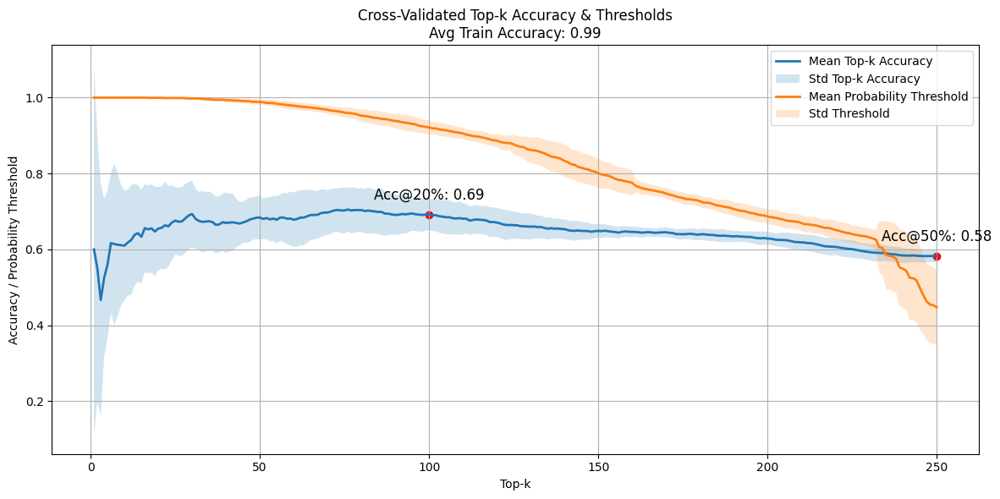

Test Accuracies (Overall): 0.59 ± 0.01
Sprawdzanie podzbioru: (215,)


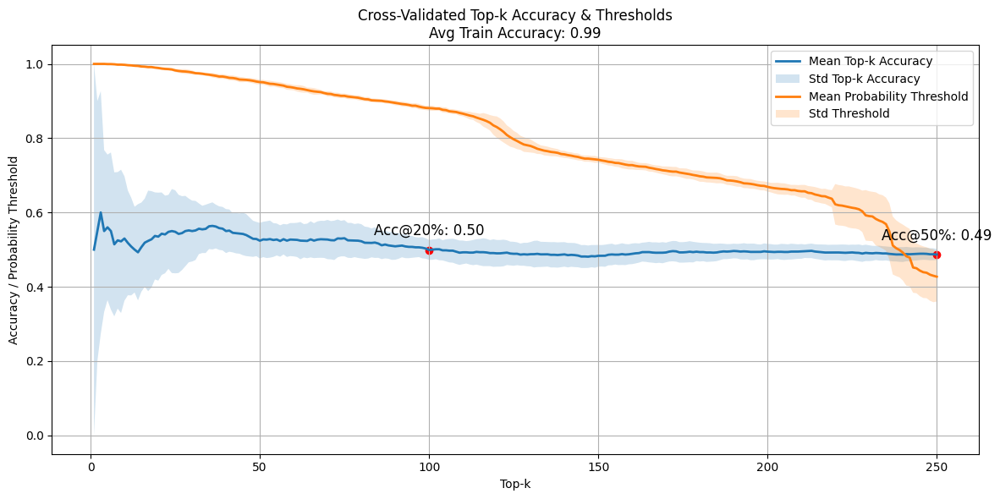

Test Accuracies (Overall): 0.50 ± 0.02
Sprawdzanie podzbioru: (238,)


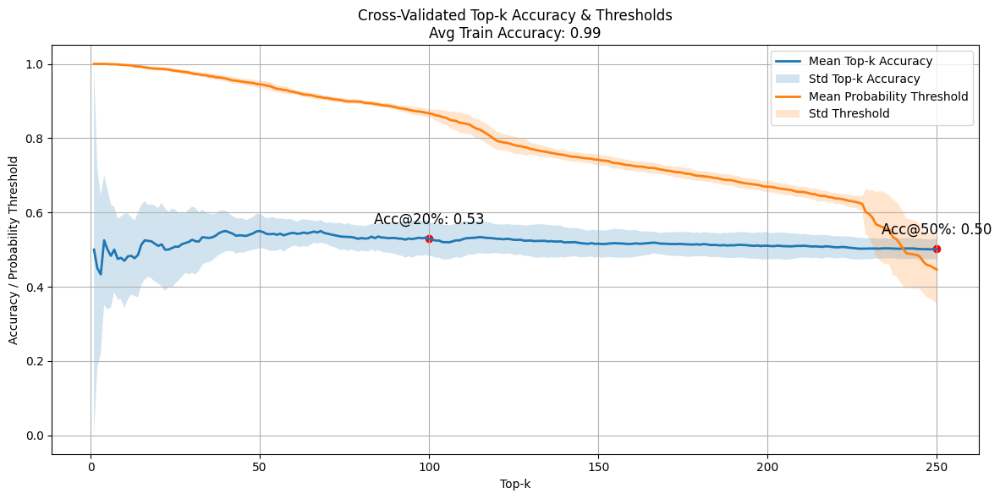

Test Accuracies (Overall): 0.51 ± 0.03
Sprawdzanie podzbioru: (351,)


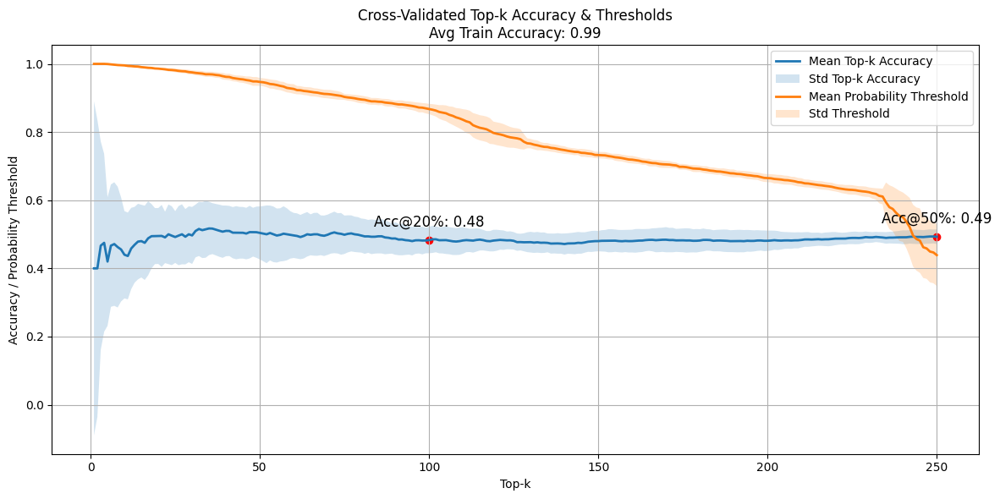

Test Accuracies (Overall): 0.50 ± 0.02
Sprawdzanie podzbioru: (424,)


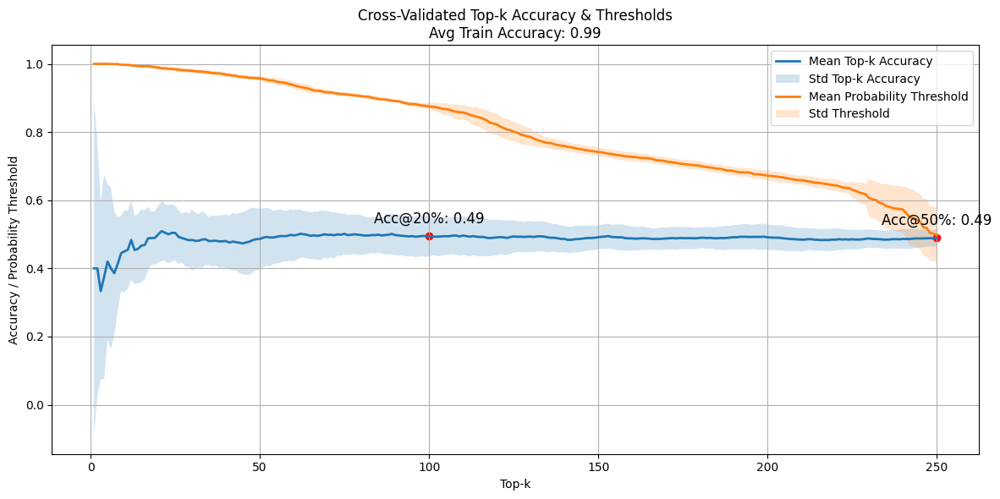

Test Accuracies (Overall): 0.50 ± 0.03
Sprawdzanie podzbioru: (7,)


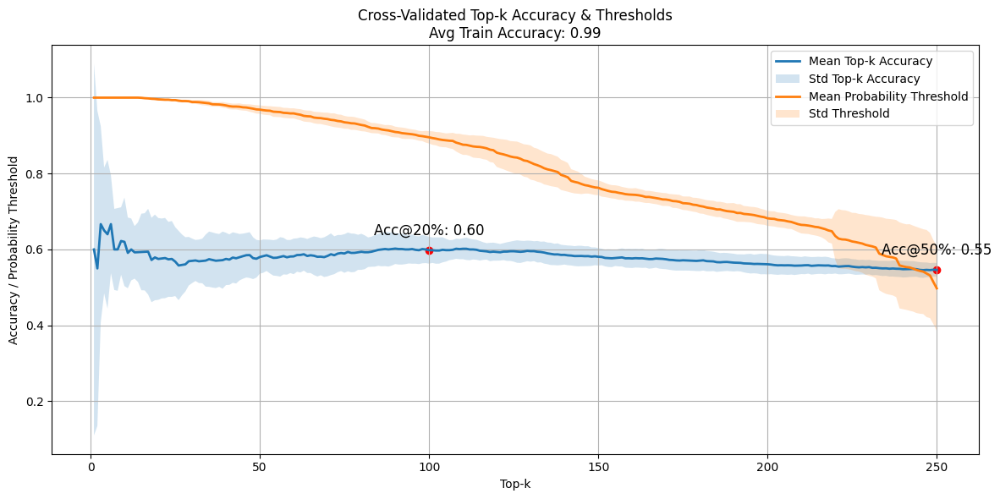

Test Accuracies (Overall): 0.55 ± 0.02
Sprawdzanie podzbioru: (298,)


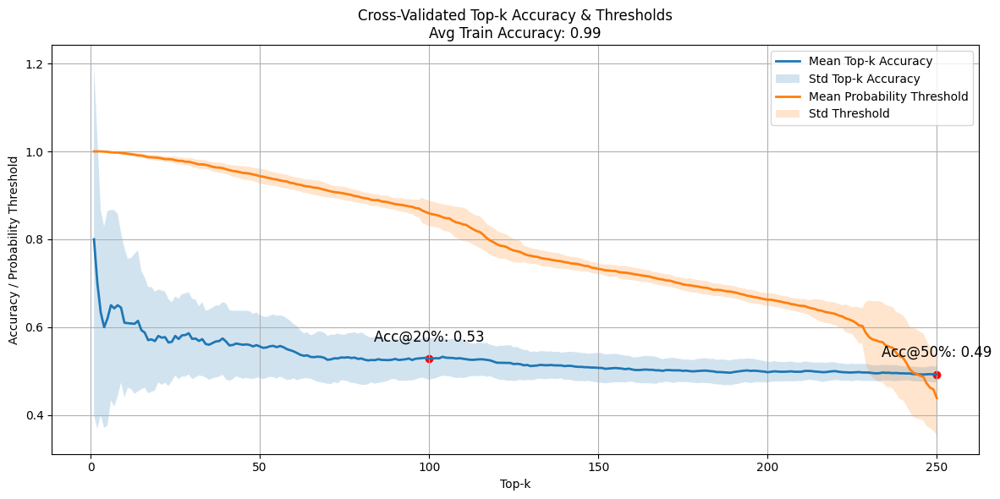

Test Accuracies (Overall): 0.50 ± 0.01
Sprawdzanie podzbioru: (2, 215)


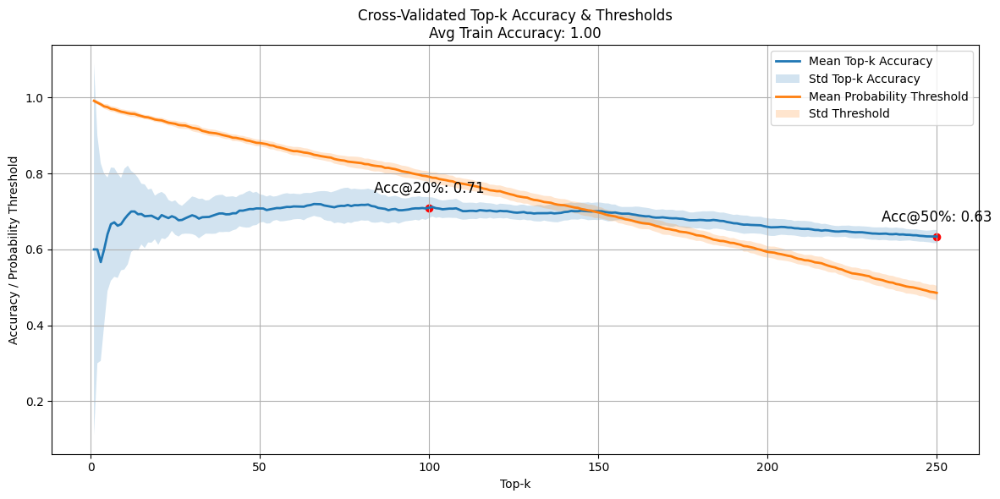

Test Accuracies (Overall): 0.64 ± 0.01
Sprawdzanie podzbioru: (2, 238)


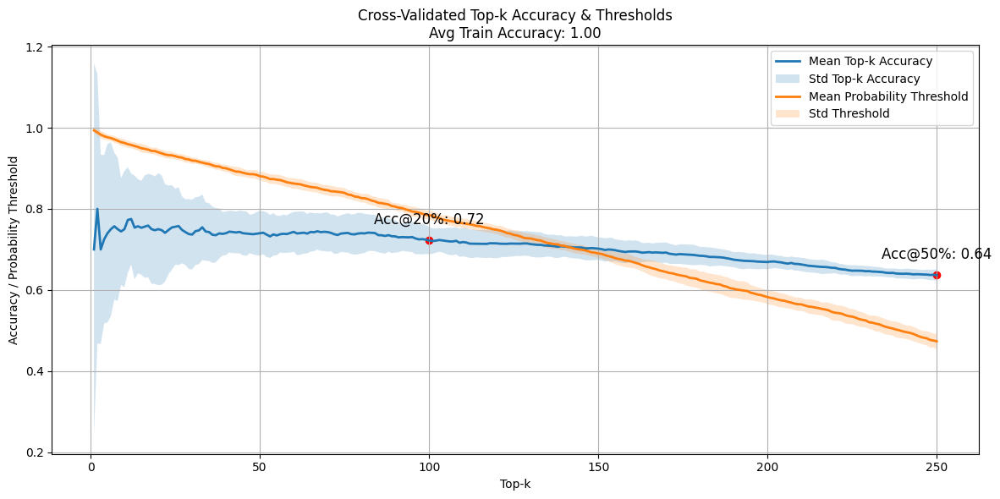

Test Accuracies (Overall): 0.65 ± 0.01
Sprawdzanie podzbioru: (2, 351)


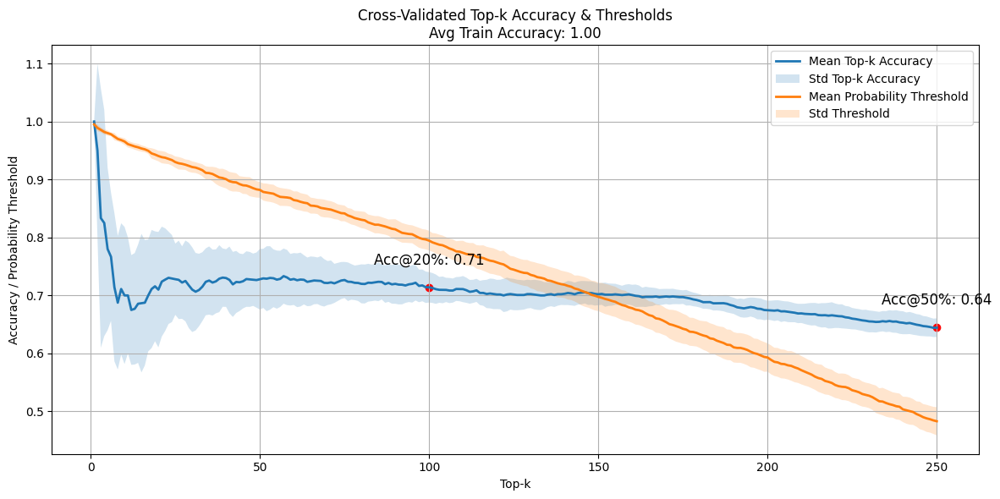

Test Accuracies (Overall): 0.66 ± 0.02
Sprawdzanie podzbioru: (2, 424)


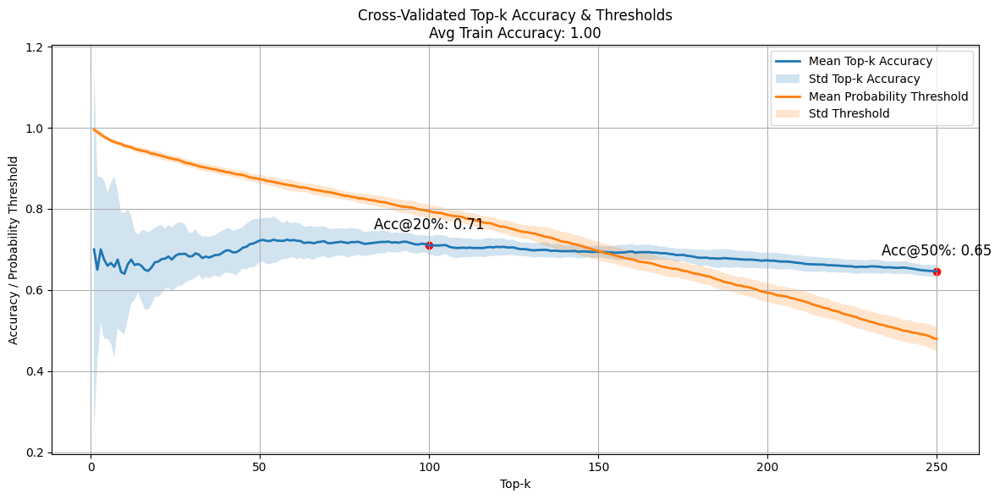

Test Accuracies (Overall): 0.66 ± 0.01
Sprawdzanie podzbioru: (2, 7)


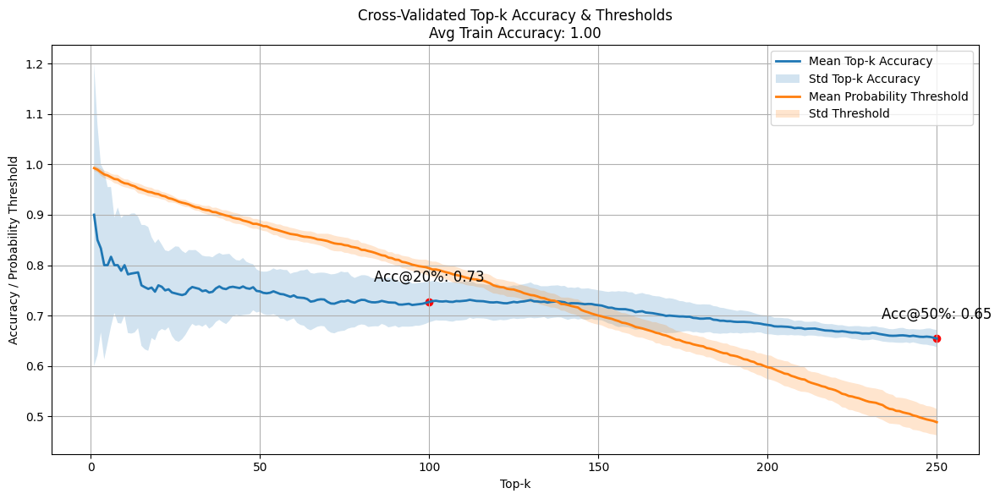

Test Accuracies (Overall): 0.67 ± 0.02
Sprawdzanie podzbioru: (2, 298)


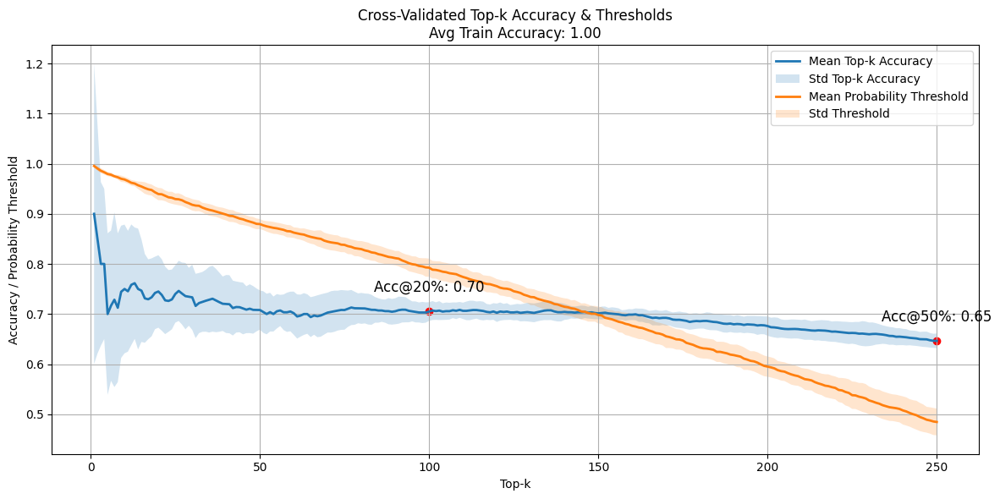

Test Accuracies (Overall): 0.66 ± 0.02
Sprawdzanie podzbioru: (215, 238)


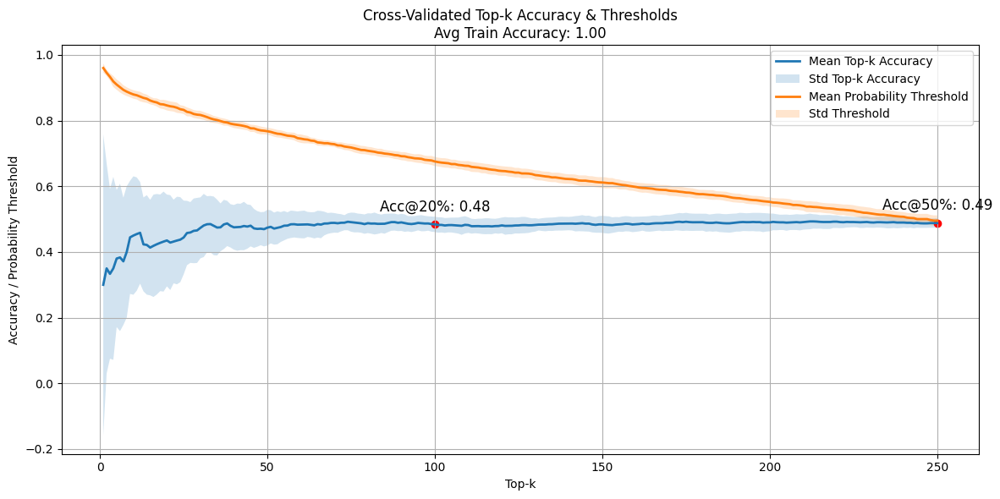

Test Accuracies (Overall): 0.50 ± 0.01
Sprawdzanie podzbioru: (215, 351)


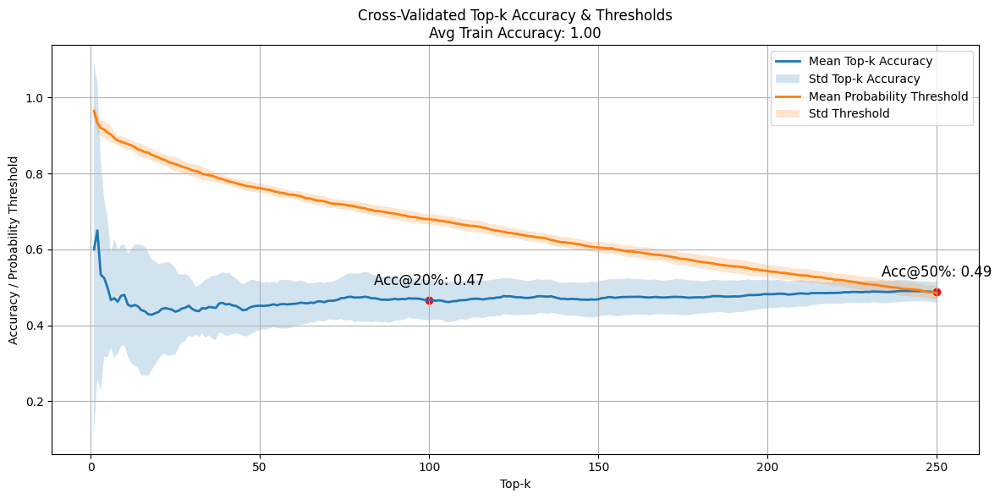

Test Accuracies (Overall): 0.50 ± 0.02
Sprawdzanie podzbioru: (215, 424)


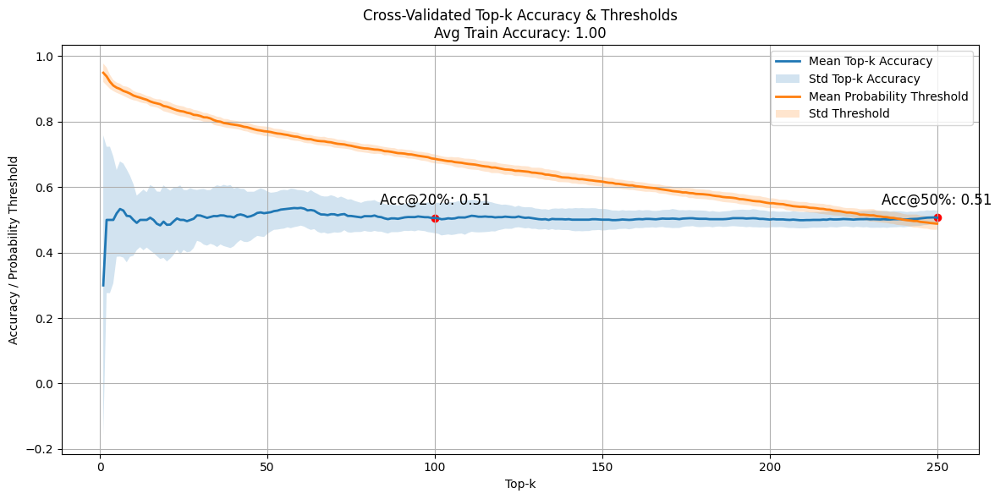

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (215, 7)


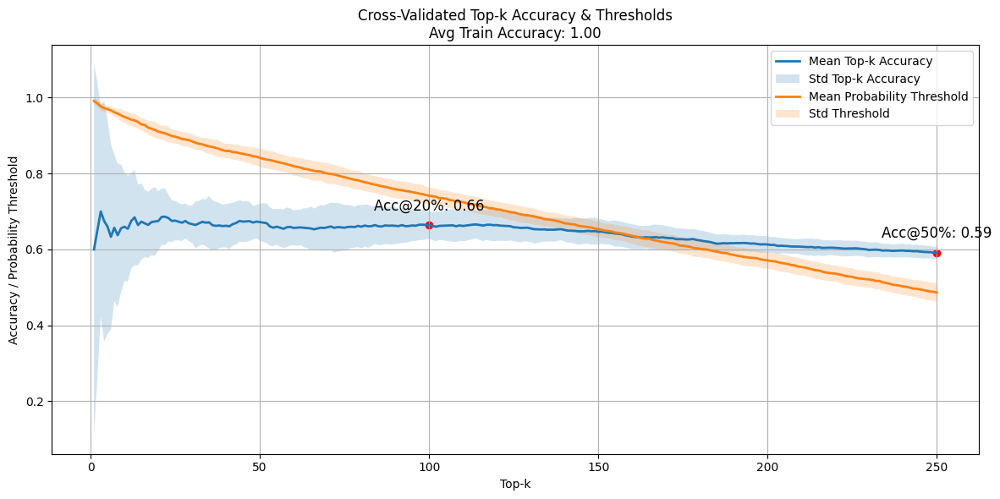

Test Accuracies (Overall): 0.60 ± 0.02
Sprawdzanie podzbioru: (215, 298)


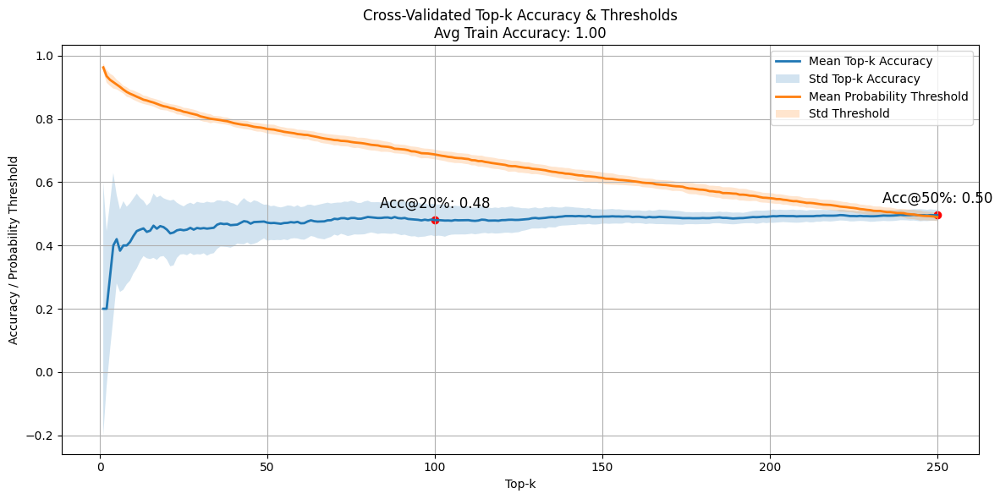

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (238, 351)


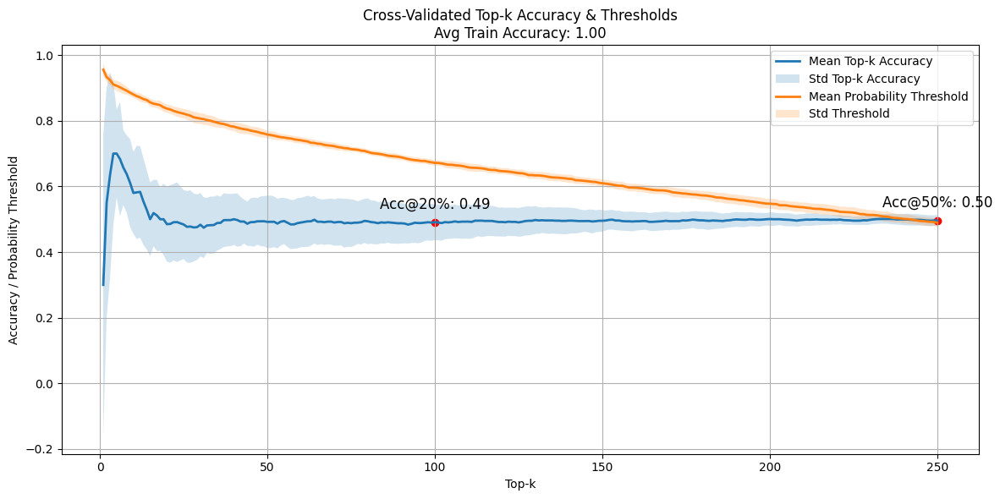

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (238, 424)


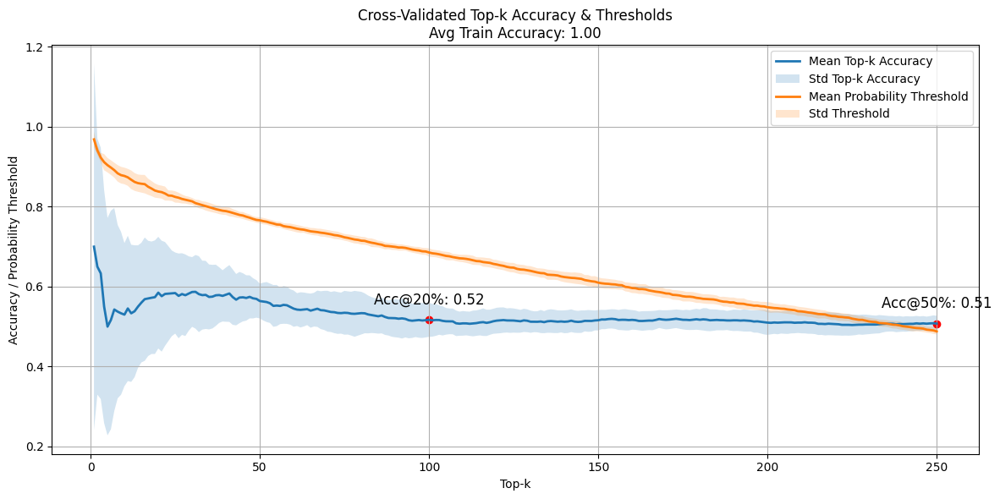

Test Accuracies (Overall): 0.52 ± 0.02
Sprawdzanie podzbioru: (238, 7)


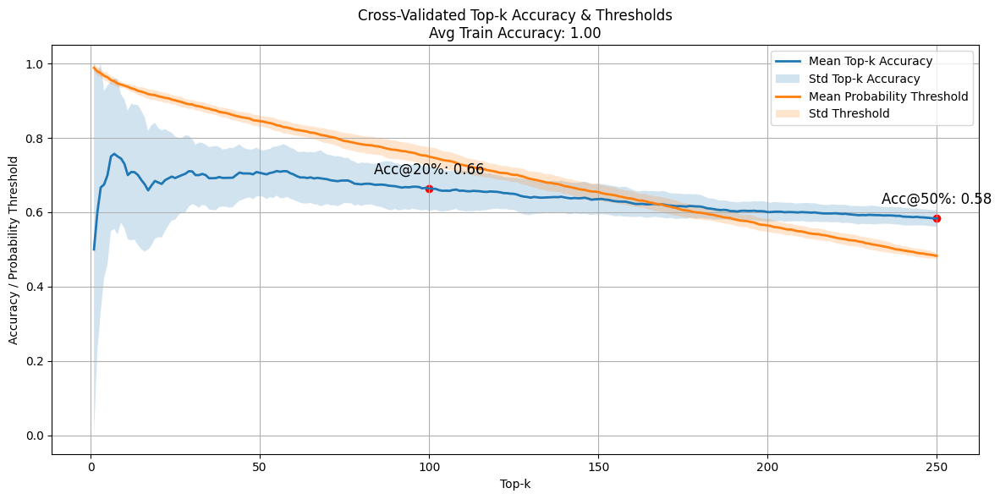

Test Accuracies (Overall): 0.60 ± 0.02
Sprawdzanie podzbioru: (238, 298)


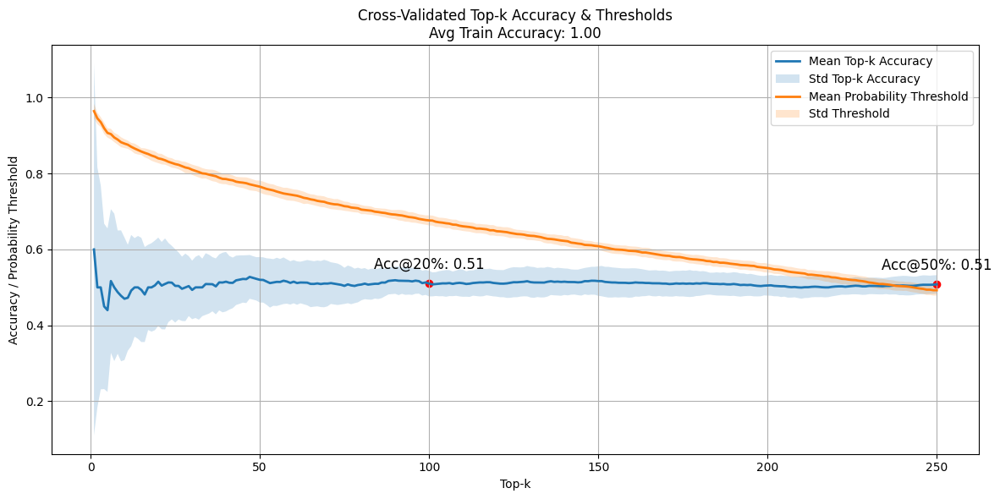

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (351, 424)


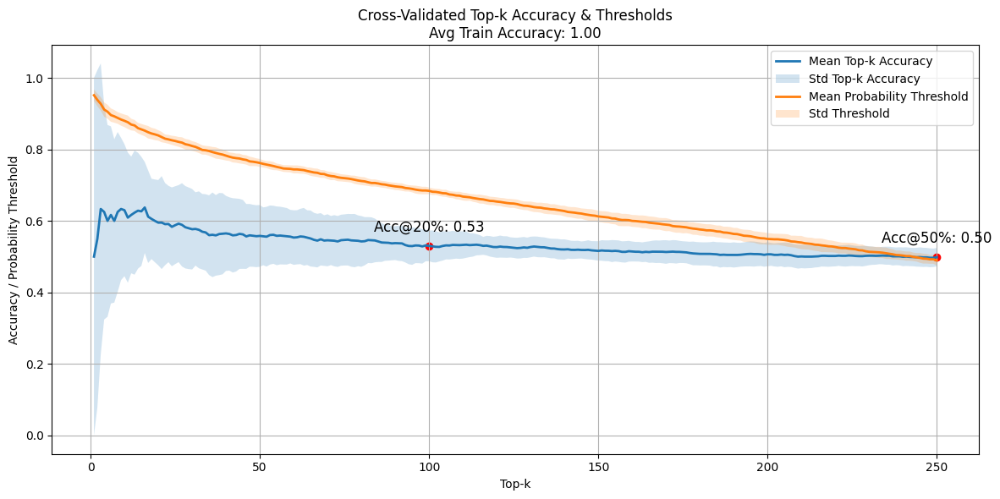

Test Accuracies (Overall): 0.51 ± 0.03
Sprawdzanie podzbioru: (351, 7)


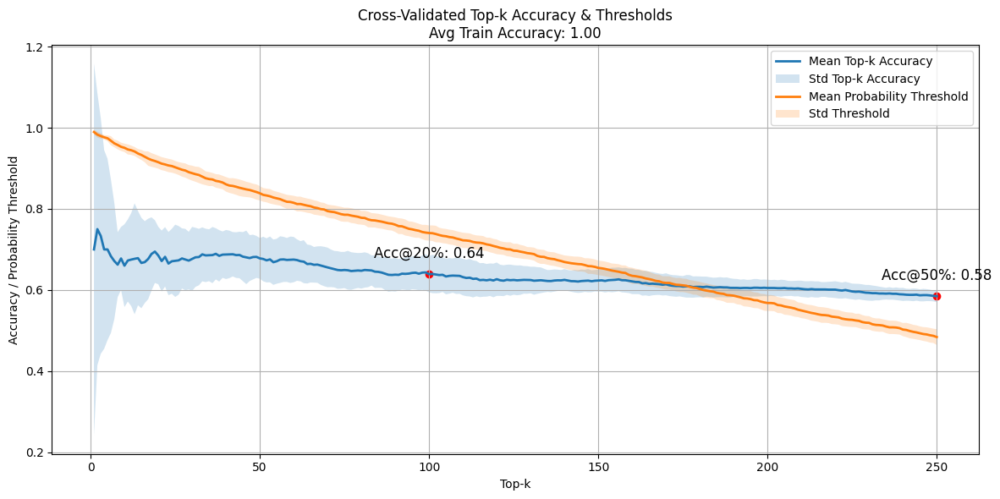

Test Accuracies (Overall): 0.60 ± 0.02
Sprawdzanie podzbioru: (351, 298)


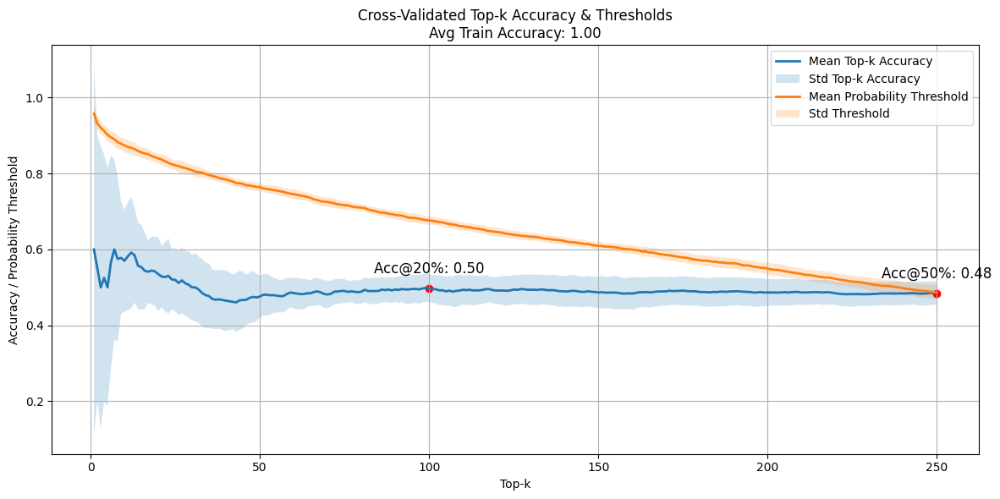

Test Accuracies (Overall): 0.50 ± 0.03
Sprawdzanie podzbioru: (424, 7)


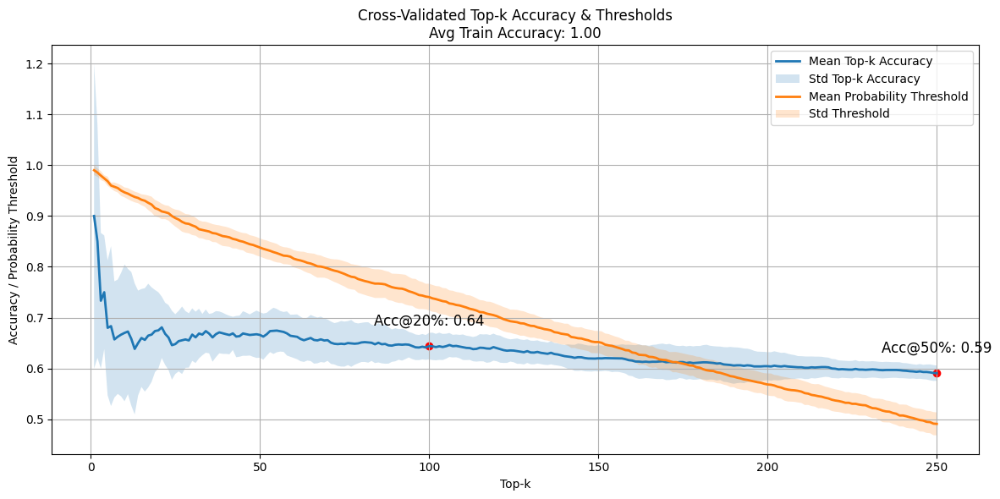

Test Accuracies (Overall): 0.60 ± 0.02
Sprawdzanie podzbioru: (424, 298)


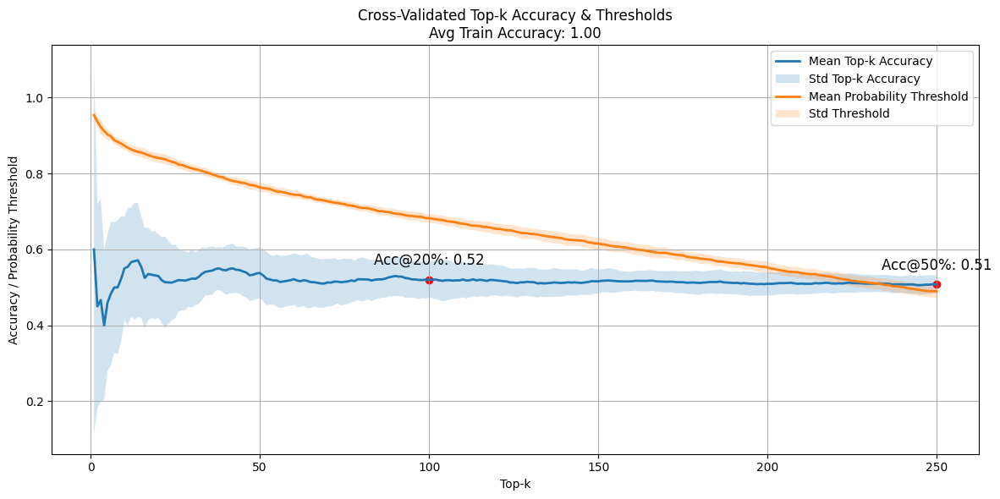

Test Accuracies (Overall): 0.52 ± 0.02
Sprawdzanie podzbioru: (7, 298)


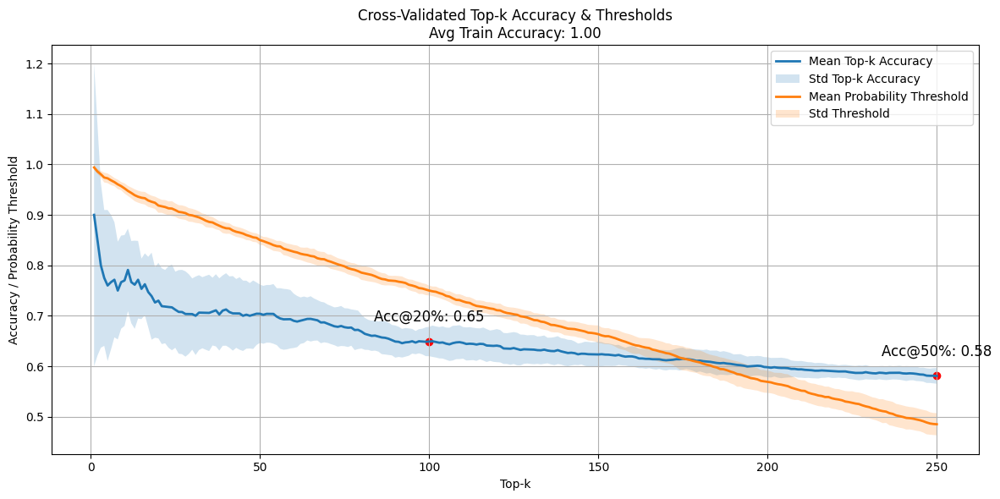

Test Accuracies (Overall): 0.59 ± 0.01
Sprawdzanie podzbioru: (2, 215, 238)


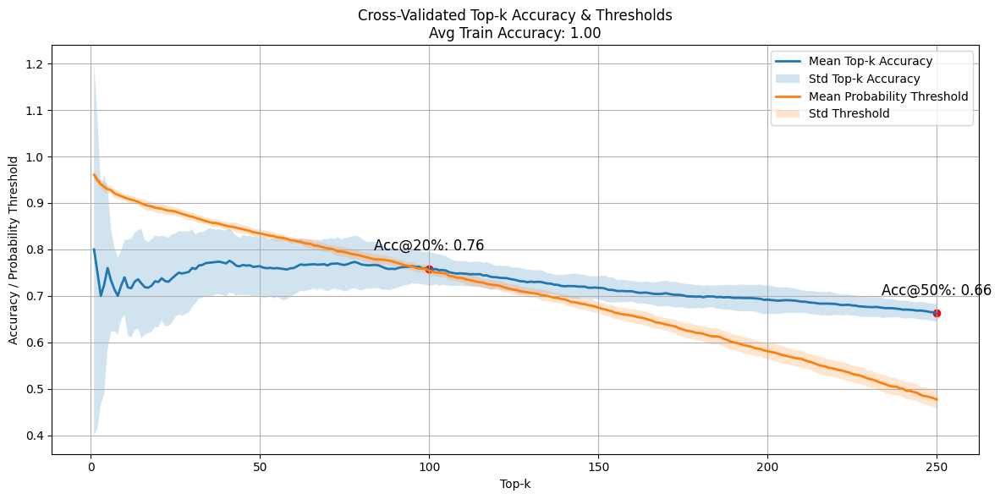

Test Accuracies (Overall): 0.67 ± 0.02
Sprawdzanie podzbioru: (2, 215, 351)


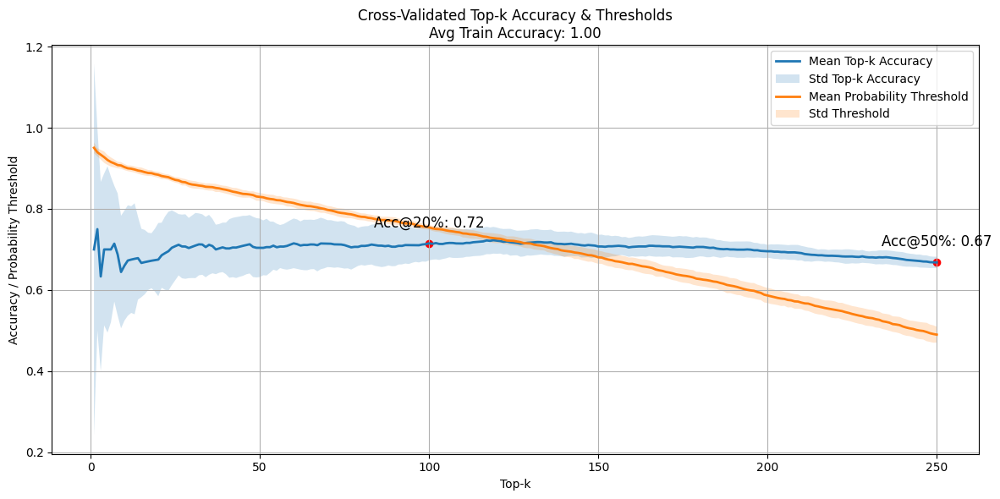

Test Accuracies (Overall): 0.68 ± 0.02
Sprawdzanie podzbioru: (2, 215, 424)


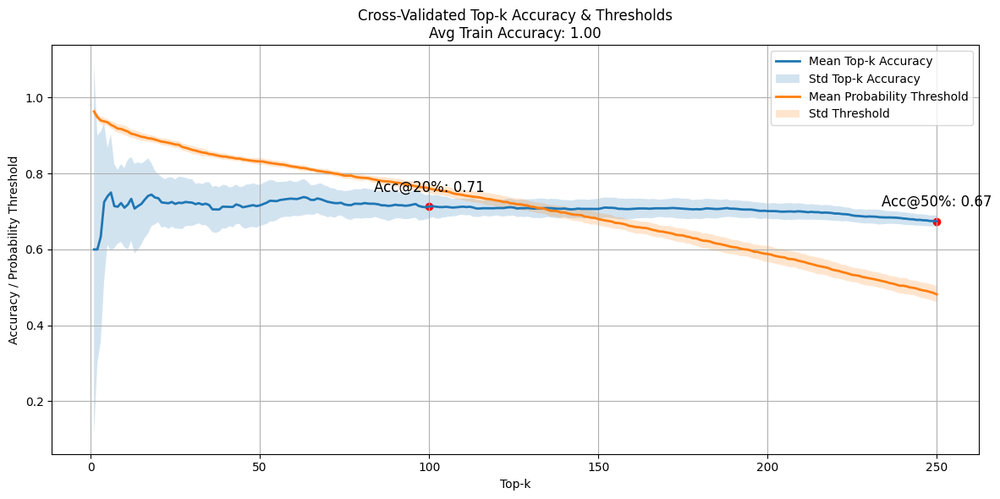

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 7)


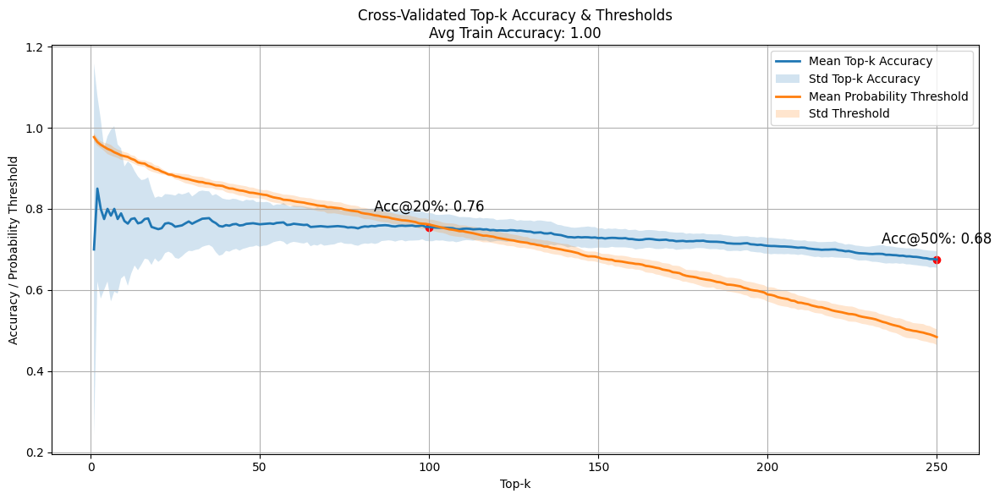

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 298)


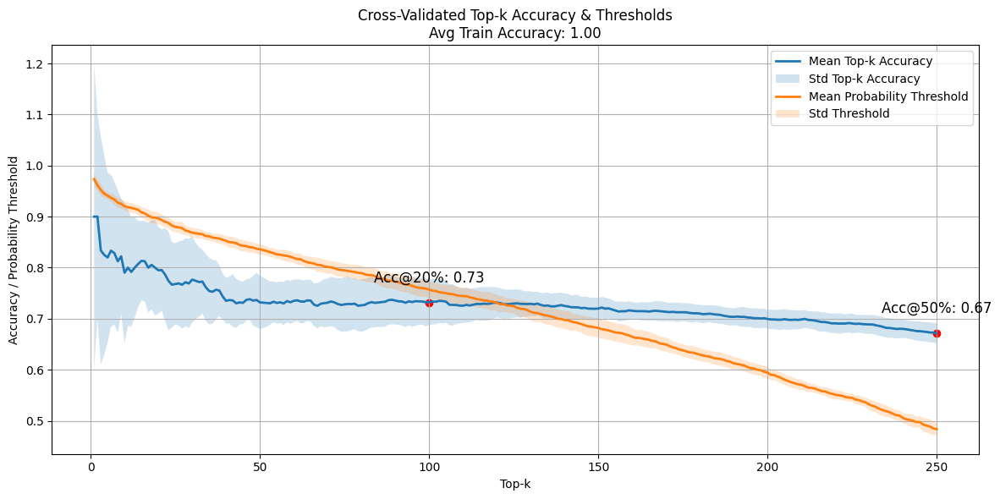

Test Accuracies (Overall): 0.68 ± 0.02
Sprawdzanie podzbioru: (2, 238, 351)


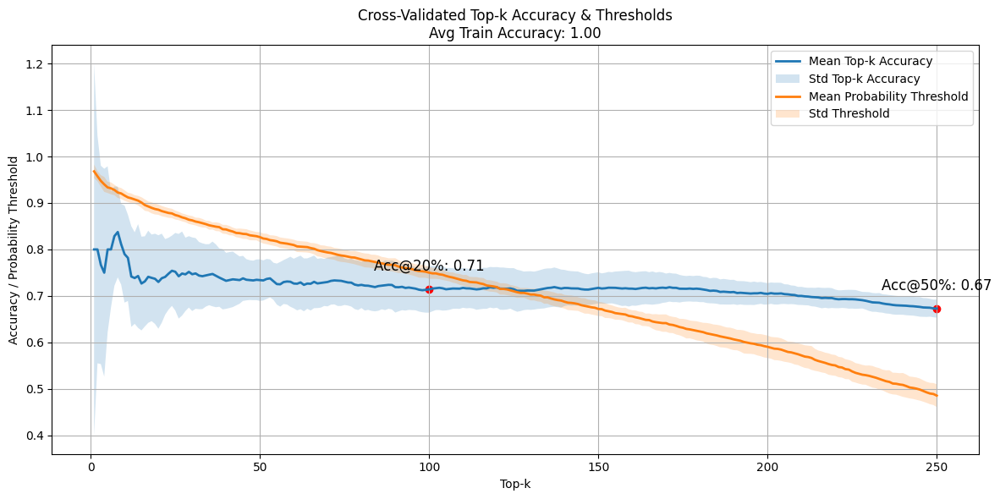

Test Accuracies (Overall): 0.68 ± 0.02
Sprawdzanie podzbioru: (2, 238, 424)


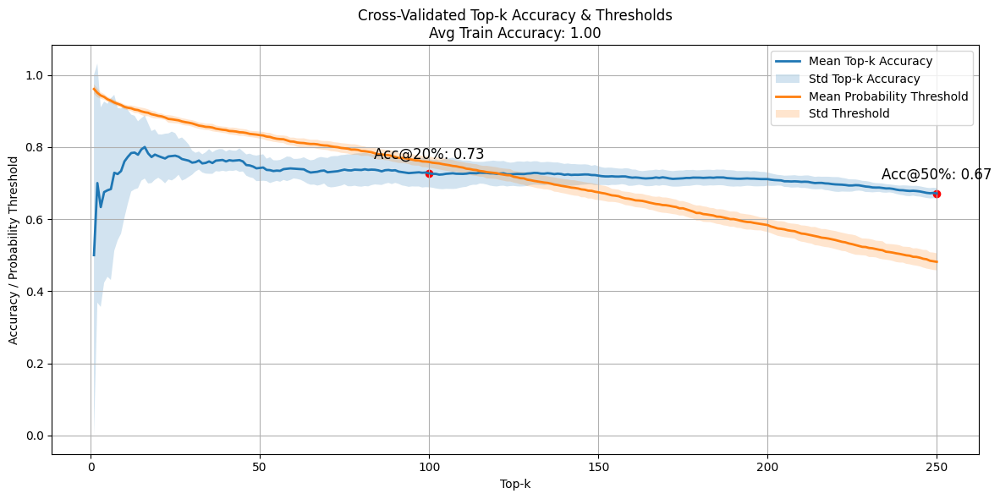

Test Accuracies (Overall): 0.69 ± 0.01
Sprawdzanie podzbioru: (2, 238, 7)


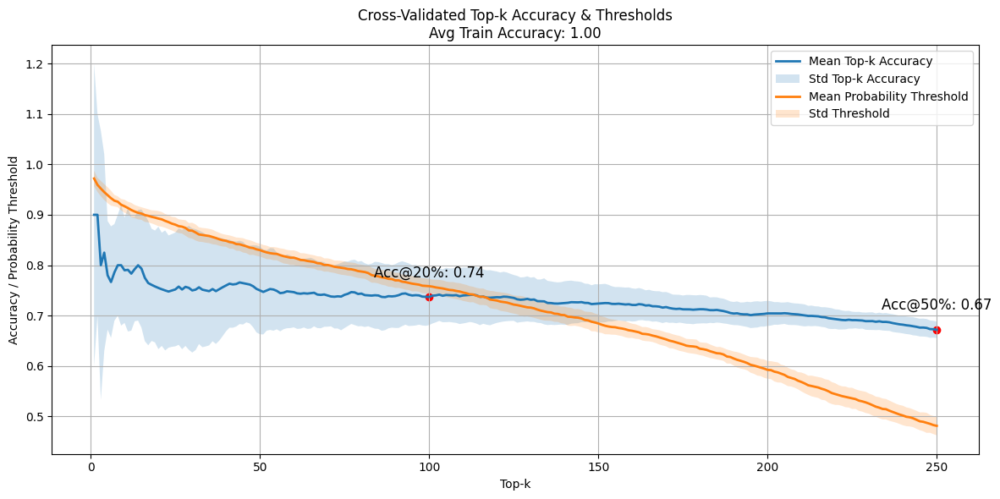

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 238, 298)


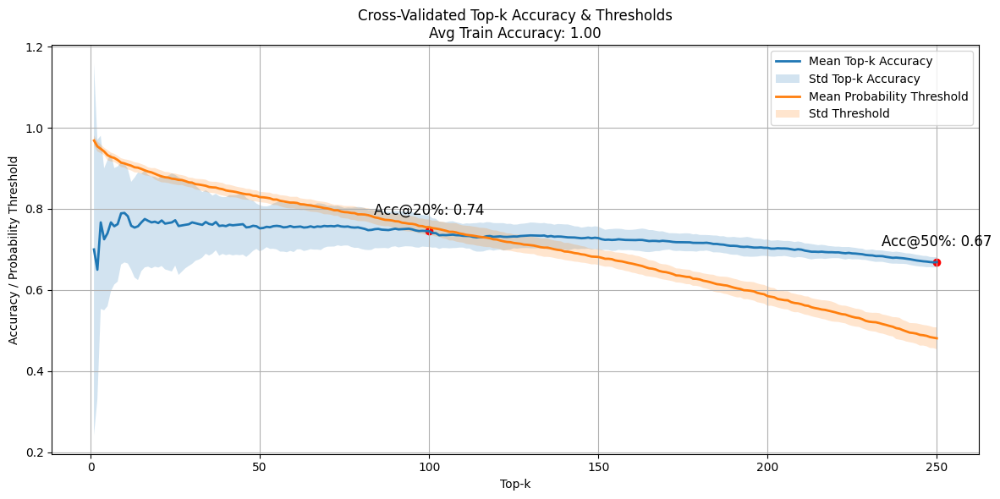

Test Accuracies (Overall): 0.68 ± 0.01
Sprawdzanie podzbioru: (2, 351, 424)


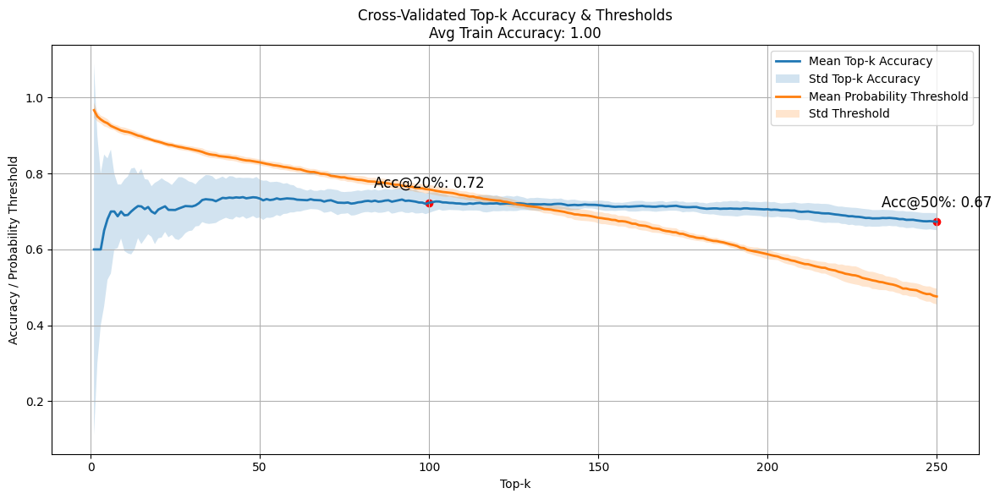

Test Accuracies (Overall): 0.68 ± 0.02
Sprawdzanie podzbioru: (2, 351, 7)


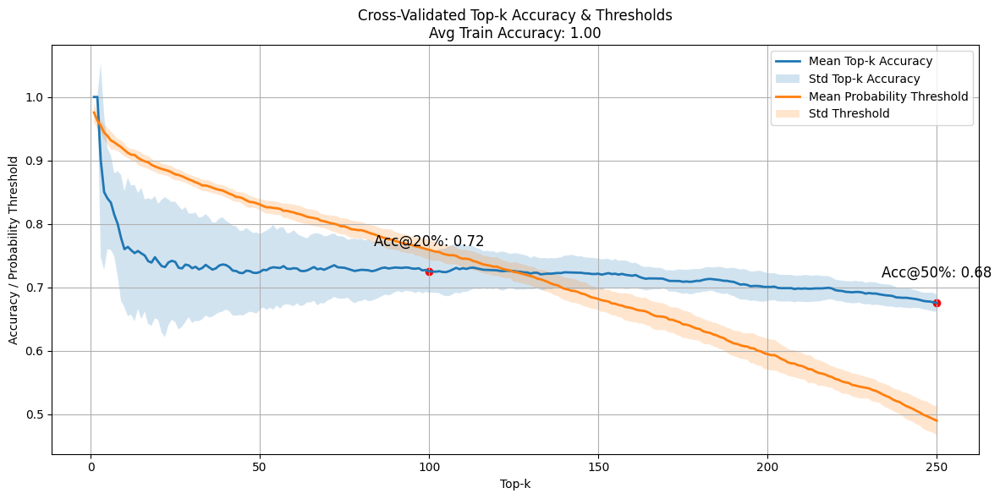

Test Accuracies (Overall): 0.69 ± 0.01
Sprawdzanie podzbioru: (2, 351, 298)


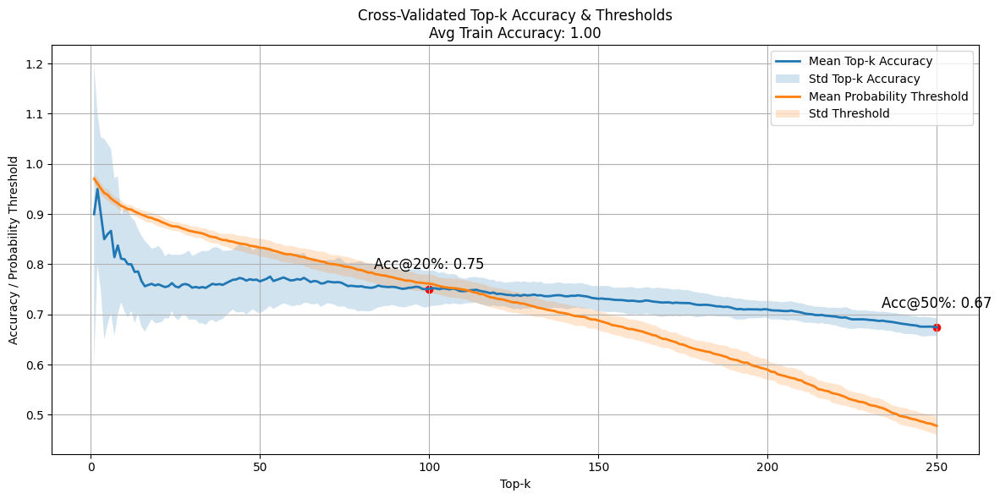

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 424, 7)


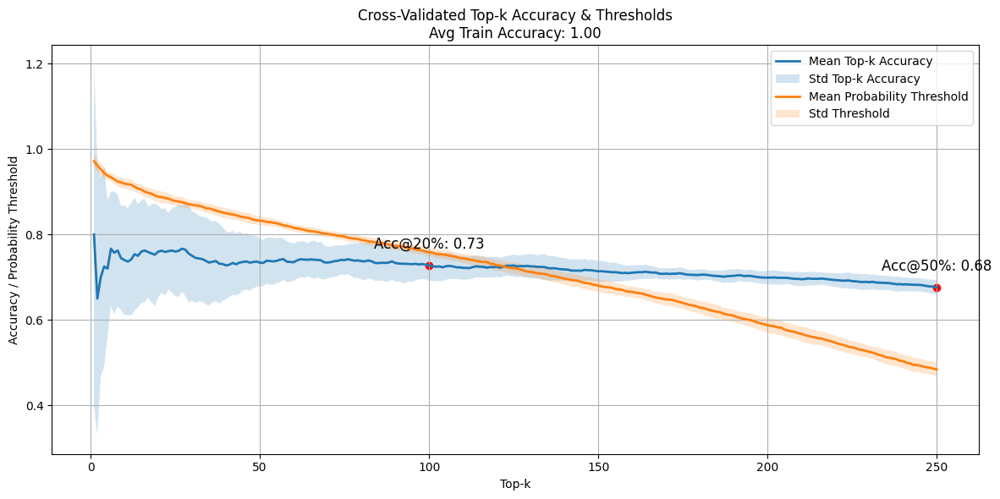

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 424, 298)


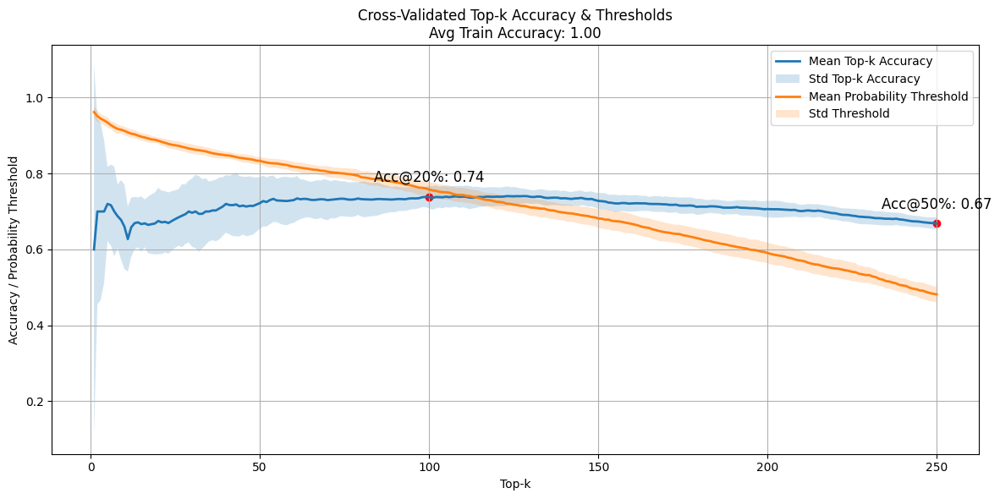

Test Accuracies (Overall): 0.68 ± 0.02
Sprawdzanie podzbioru: (2, 7, 298)


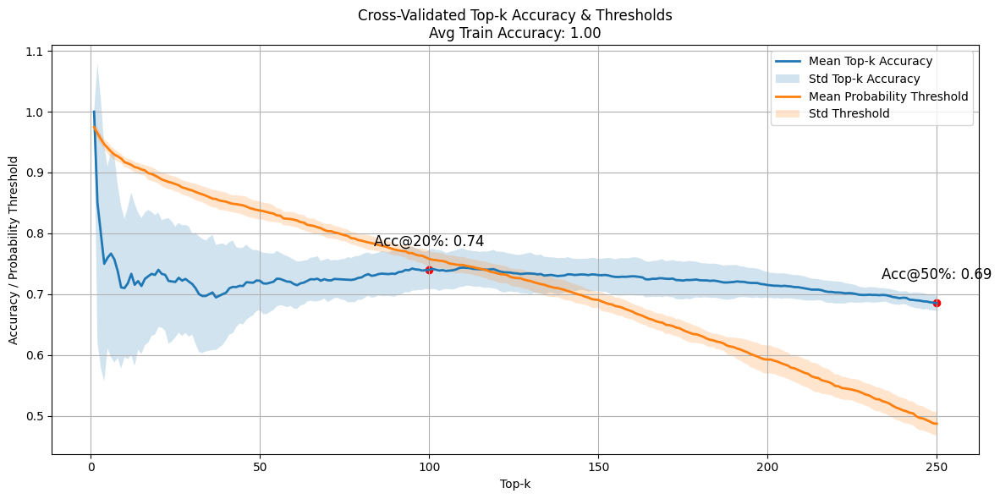

Test Accuracies (Overall): 0.70 ± 0.01
Sprawdzanie podzbioru: (215, 238, 351)


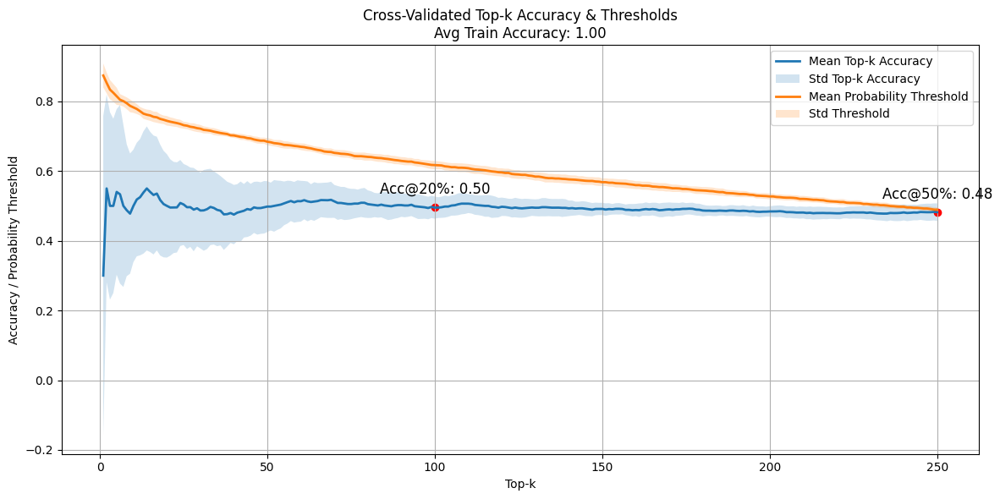

Test Accuracies (Overall): 0.49 ± 0.02
Sprawdzanie podzbioru: (215, 238, 424)


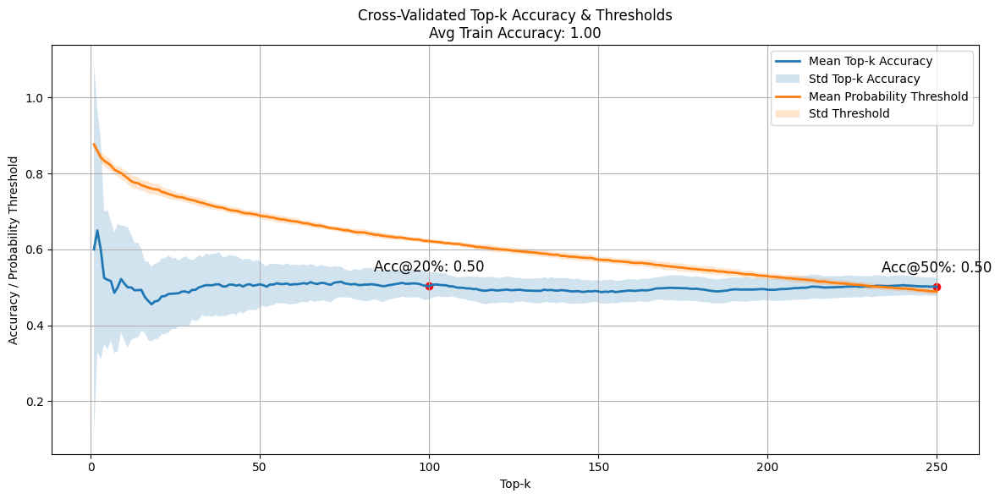

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (215, 238, 7)


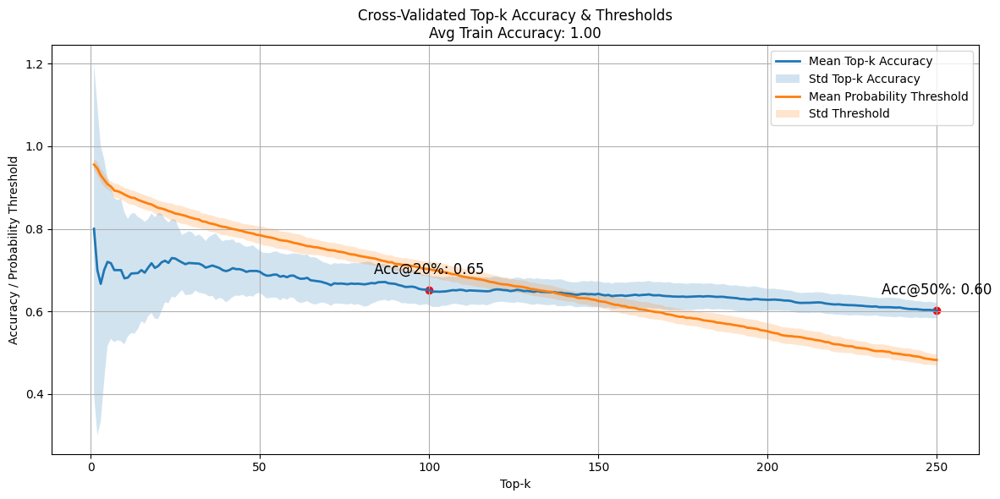

Test Accuracies (Overall): 0.61 ± 0.02
Sprawdzanie podzbioru: (215, 238, 298)


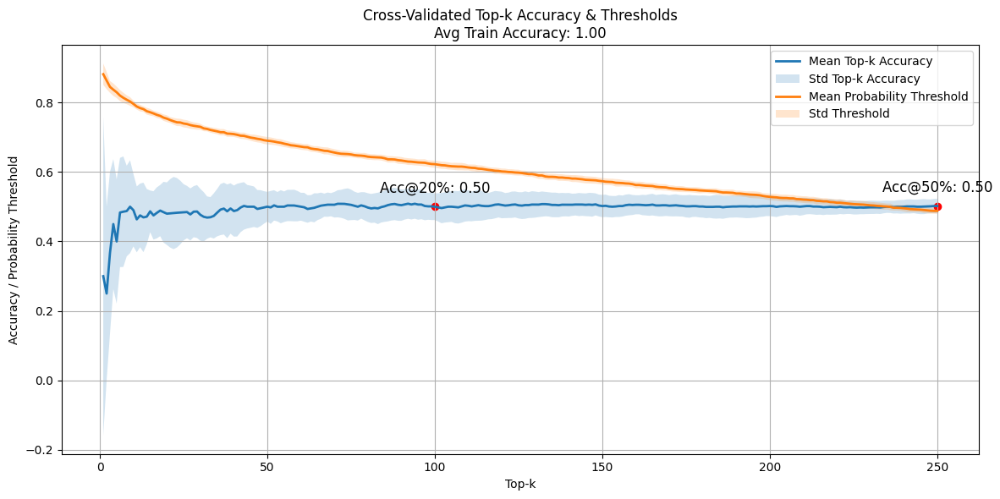

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (215, 351, 424)


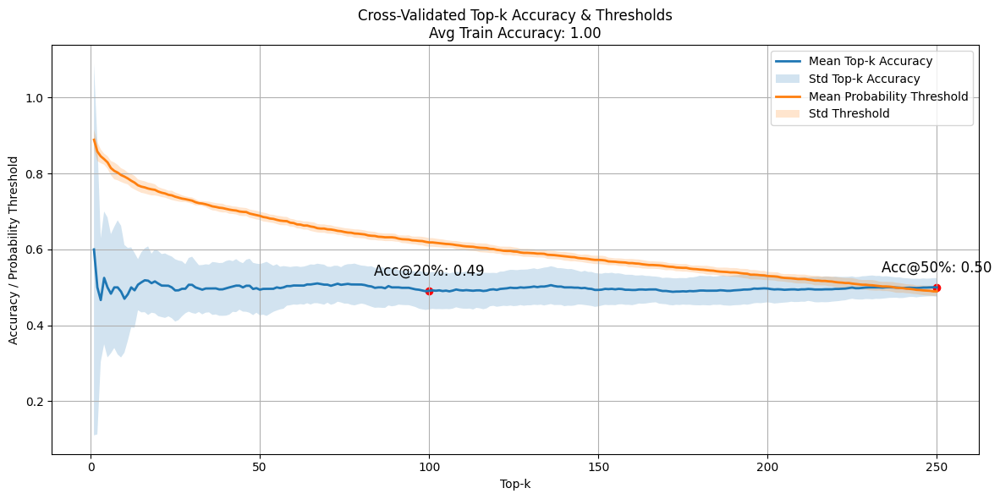

Test Accuracies (Overall): 0.51 ± 0.03
Sprawdzanie podzbioru: (215, 351, 7)


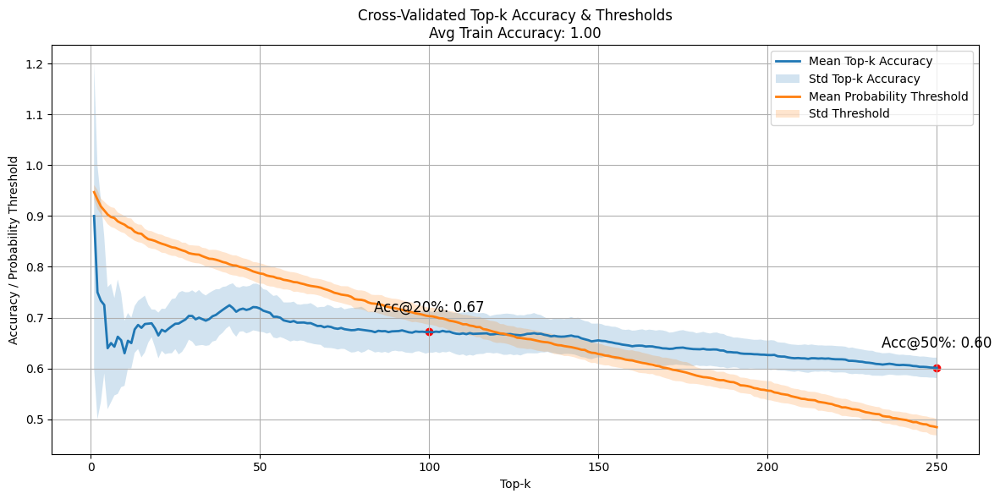

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (215, 351, 298)


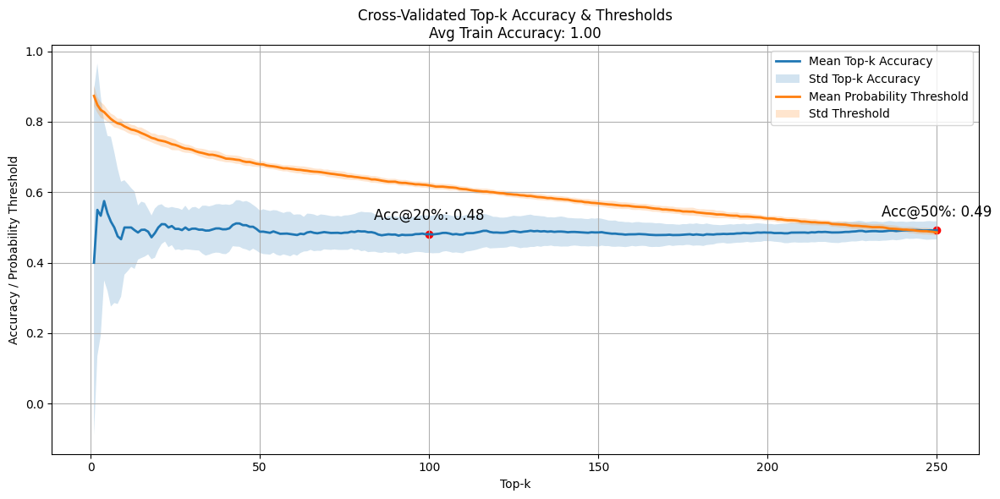

Test Accuracies (Overall): 0.50 ± 0.03
Sprawdzanie podzbioru: (215, 424, 7)


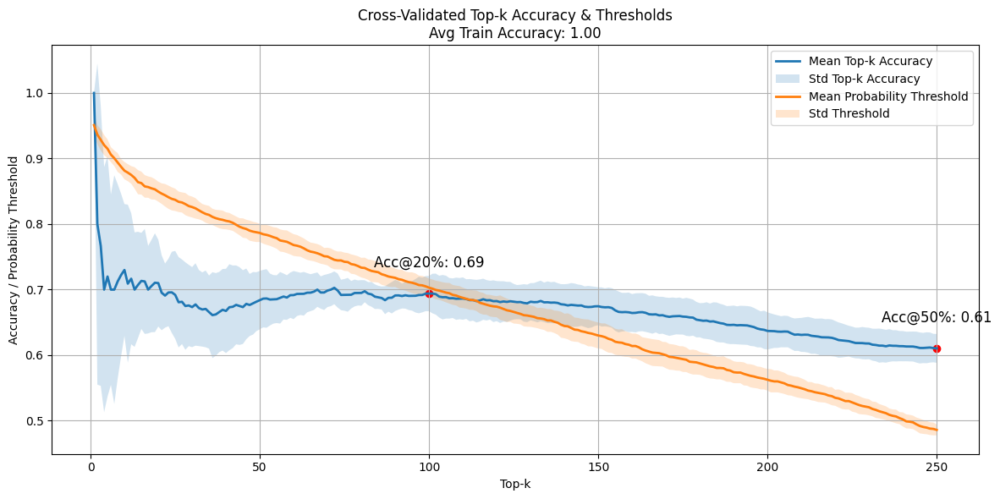

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (215, 424, 298)


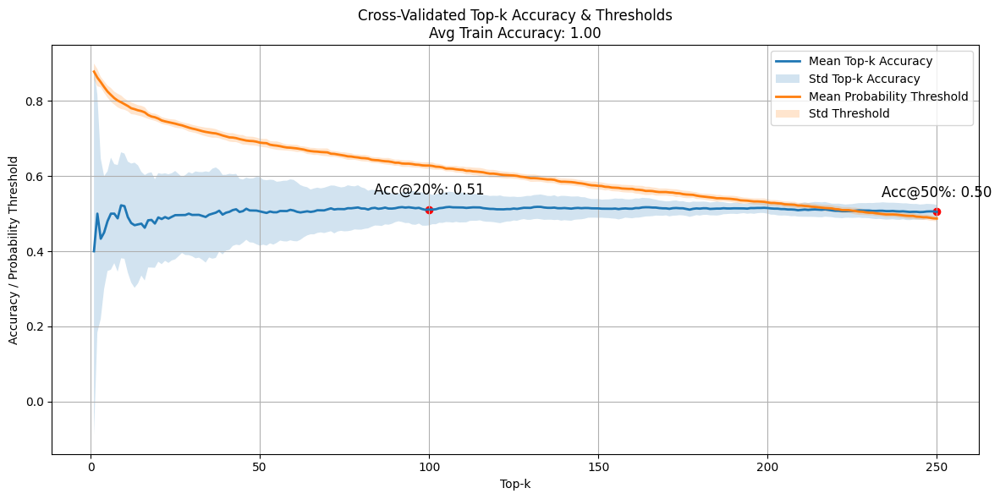

Test Accuracies (Overall): 0.52 ± 0.02
Sprawdzanie podzbioru: (215, 7, 298)


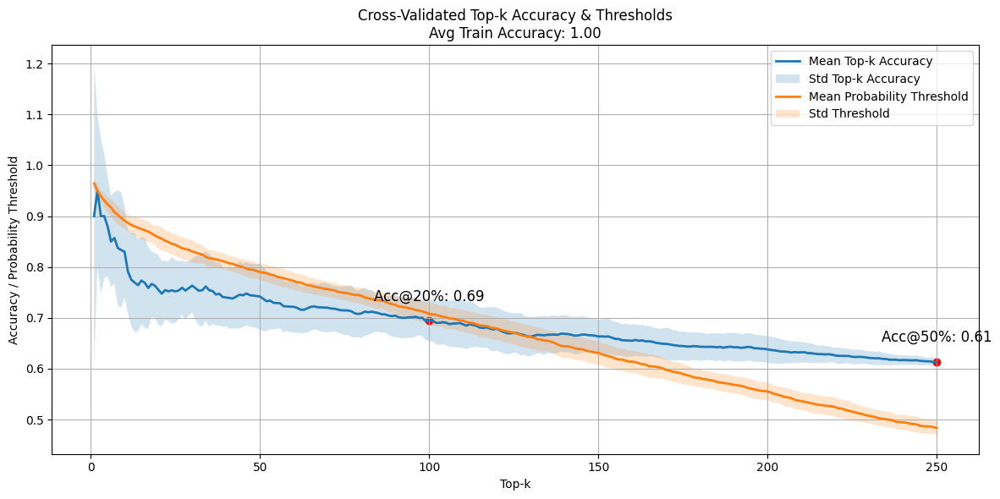

Test Accuracies (Overall): 0.62 ± 0.01
Sprawdzanie podzbioru: (238, 351, 424)


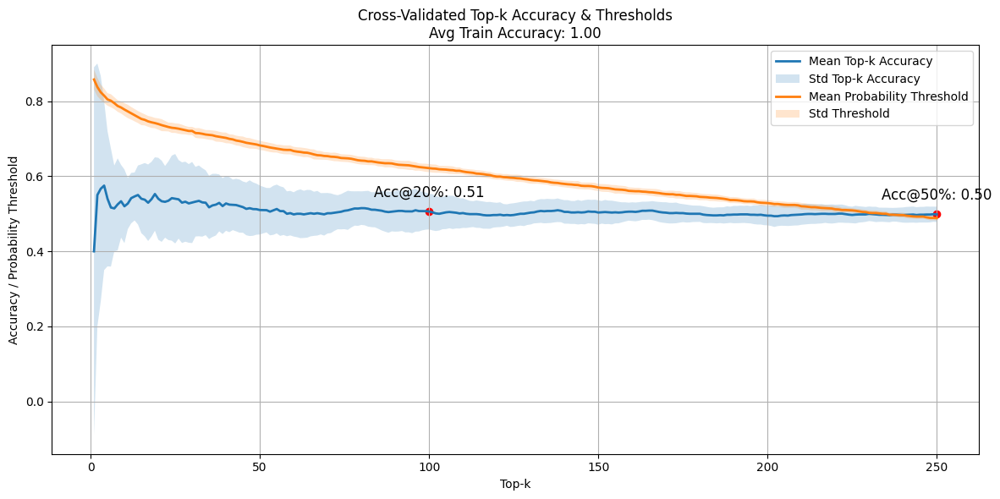

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (238, 351, 7)


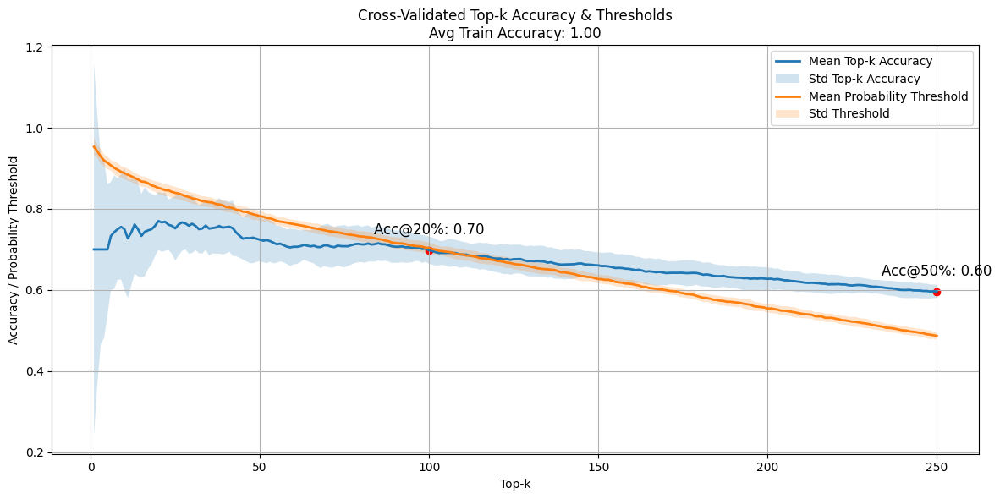

Test Accuracies (Overall): 0.61 ± 0.02
Sprawdzanie podzbioru: (238, 351, 298)


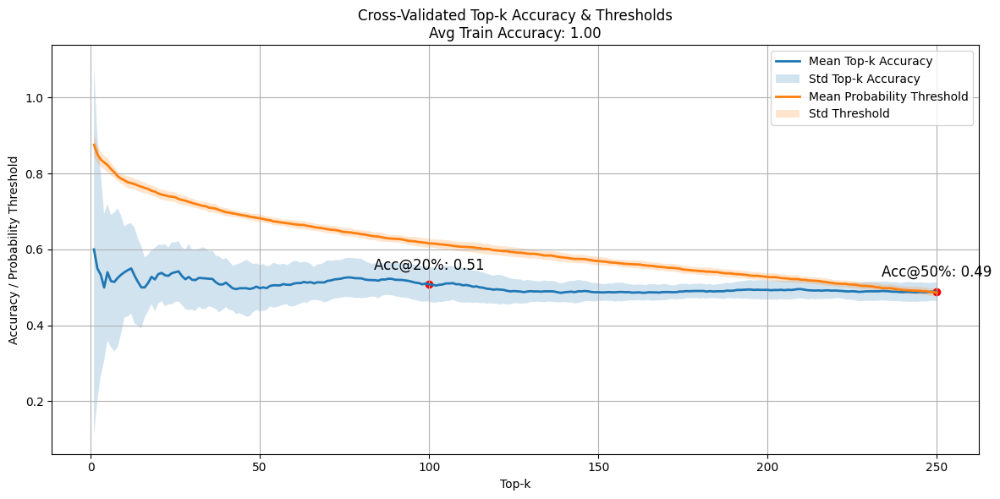

Test Accuracies (Overall): 0.50 ± 0.02
Sprawdzanie podzbioru: (238, 424, 7)


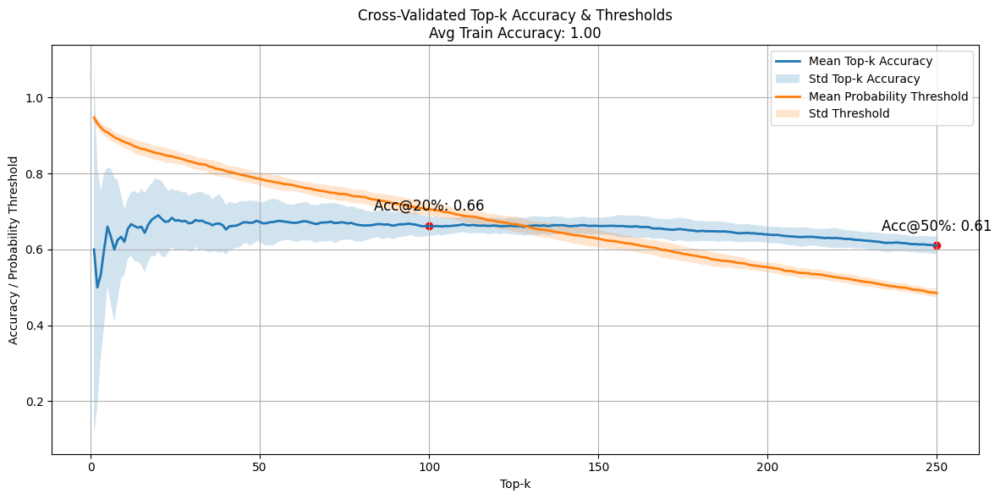

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (238, 424, 298)


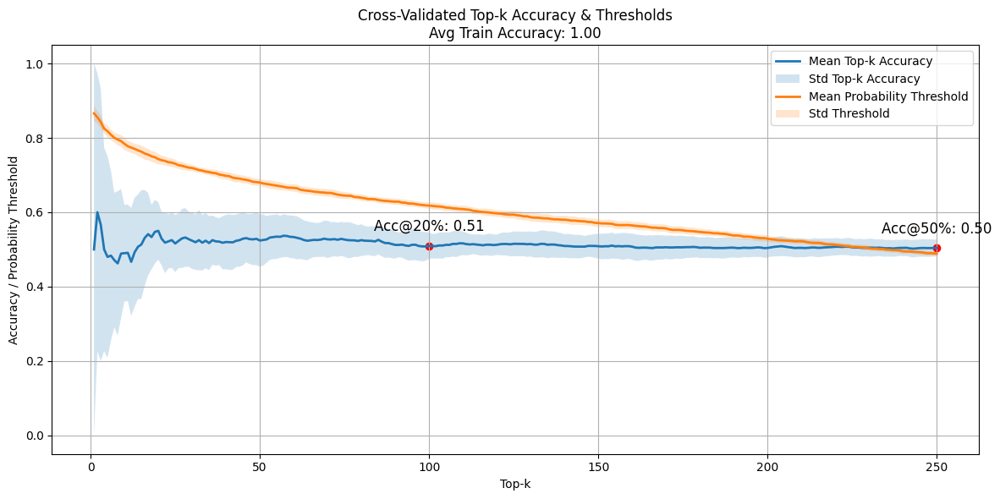

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (238, 7, 298)


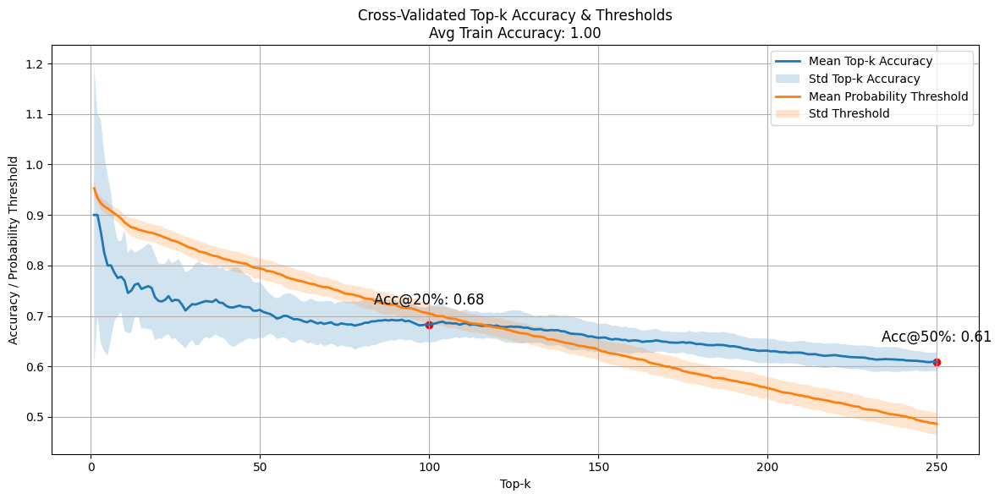

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (351, 424, 7)


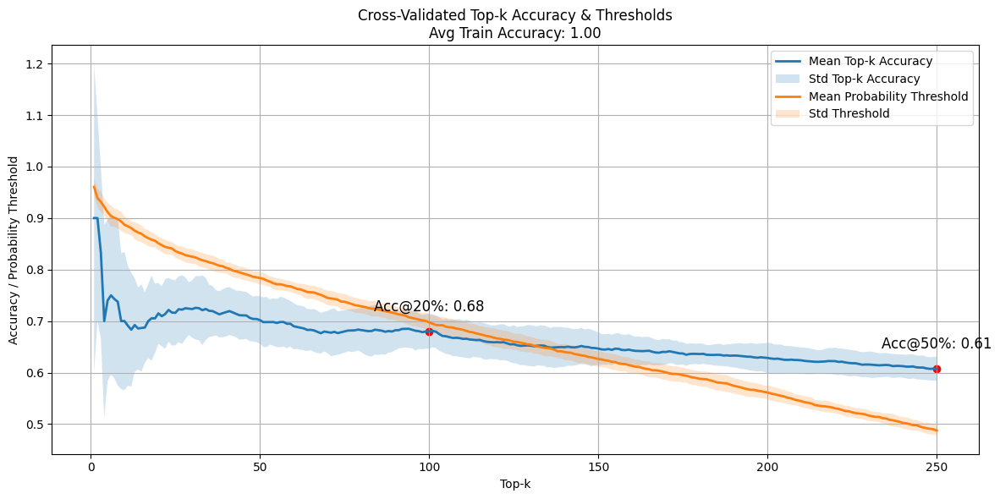

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (351, 424, 298)


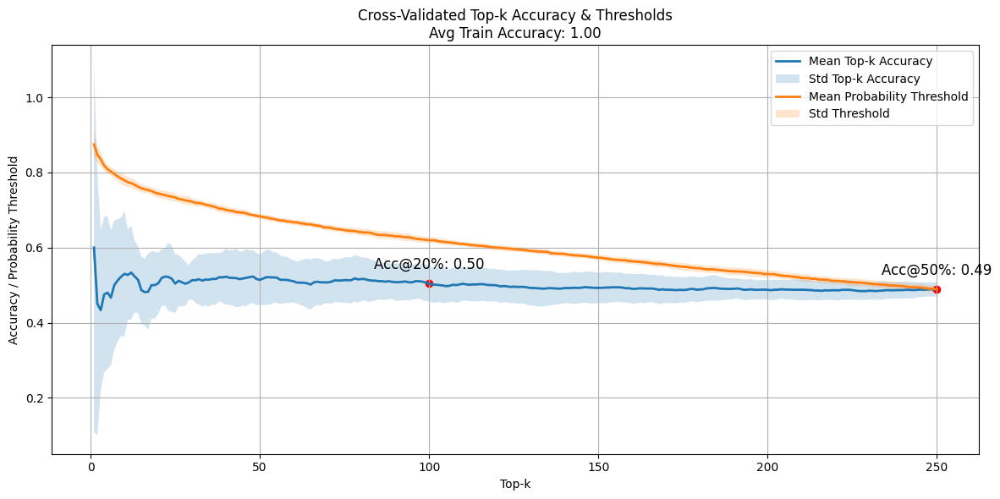

Test Accuracies (Overall): 0.50 ± 0.02
Sprawdzanie podzbioru: (351, 7, 298)


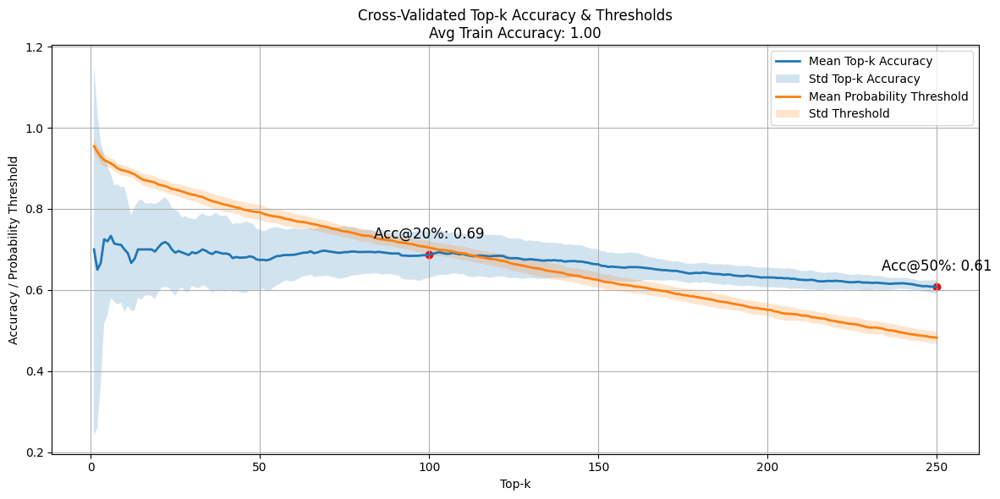

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (424, 7, 298)


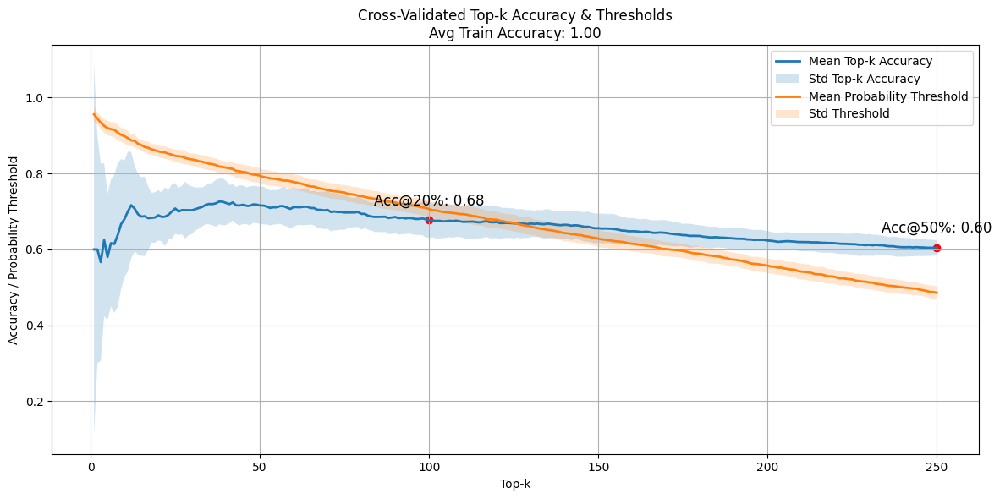

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351)


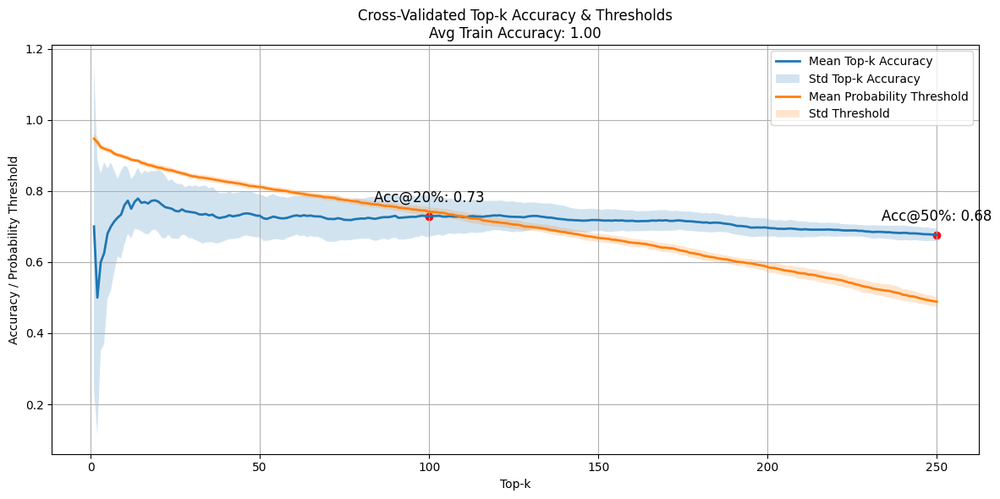

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 424)


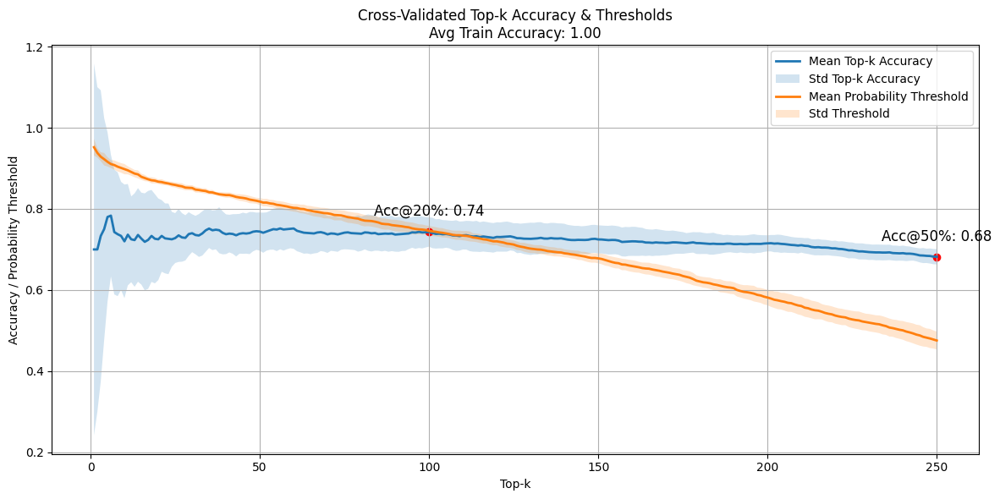

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 7)


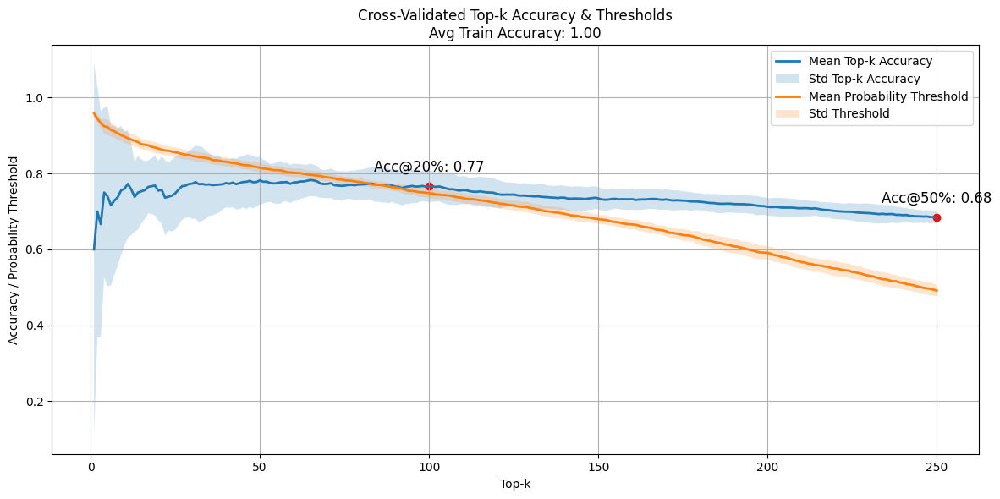

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 298)


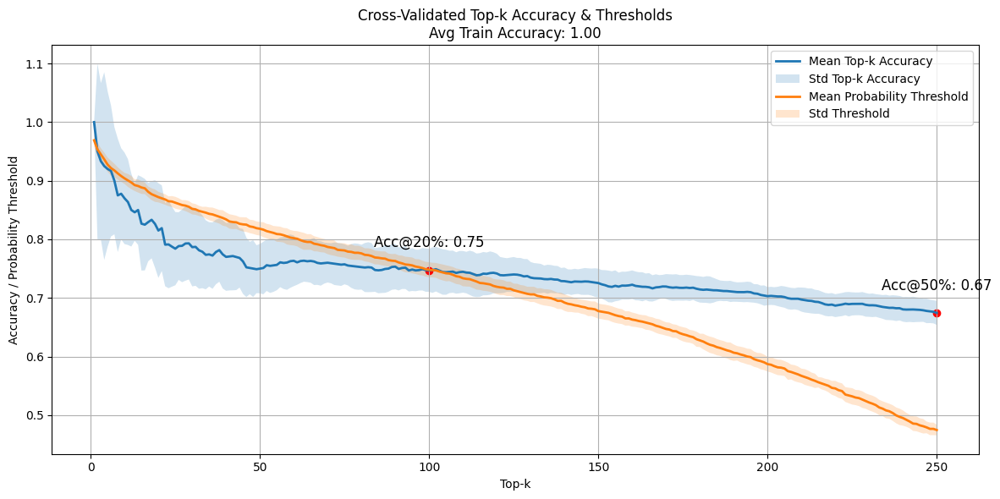

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 351, 424)


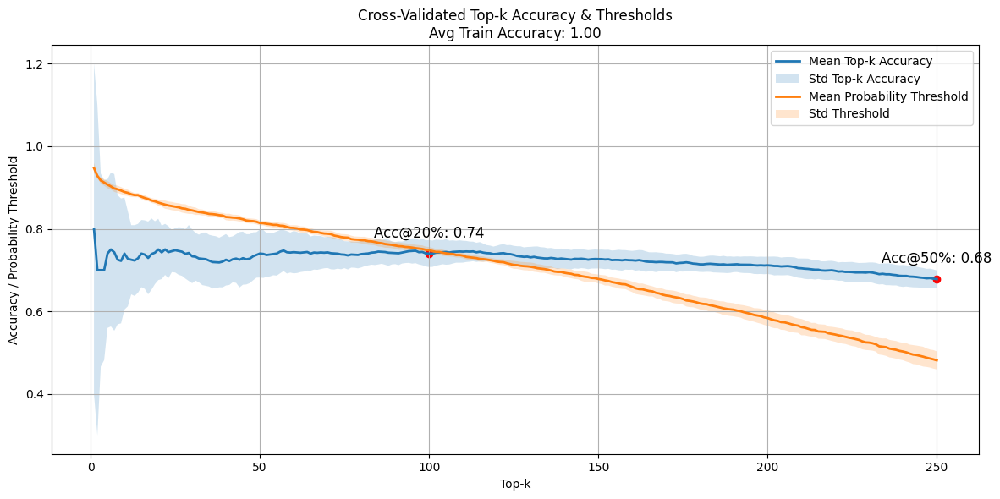

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 351, 7)


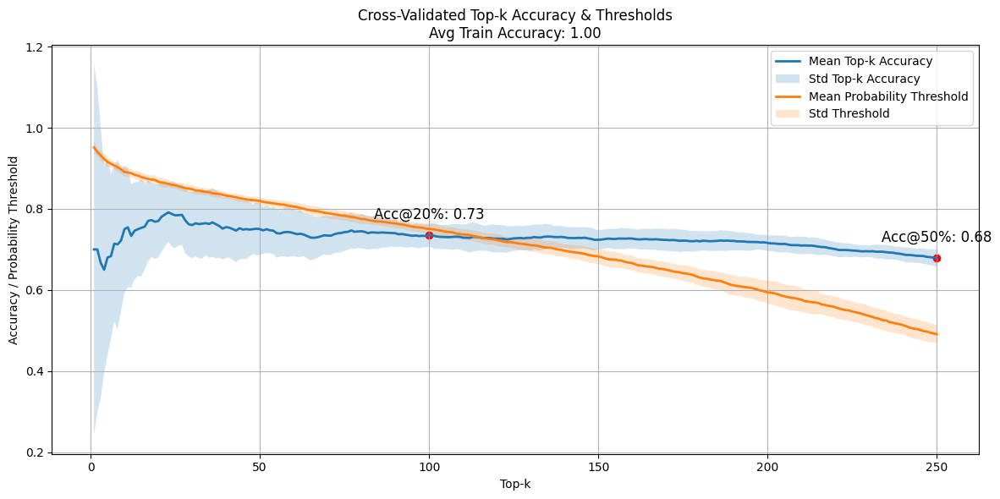

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 351, 298)


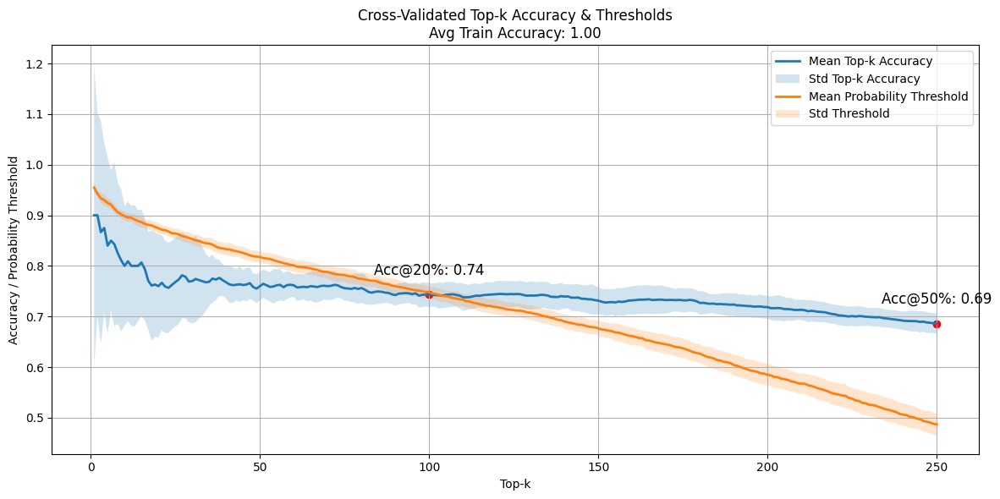

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 215, 424, 7)


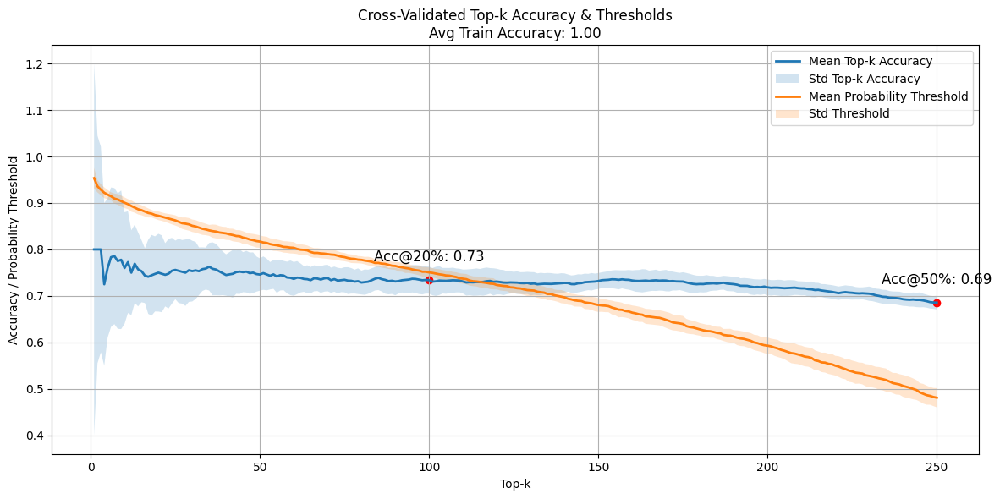

Test Accuracies (Overall): 0.70 ± 0.01
Sprawdzanie podzbioru: (2, 215, 424, 298)


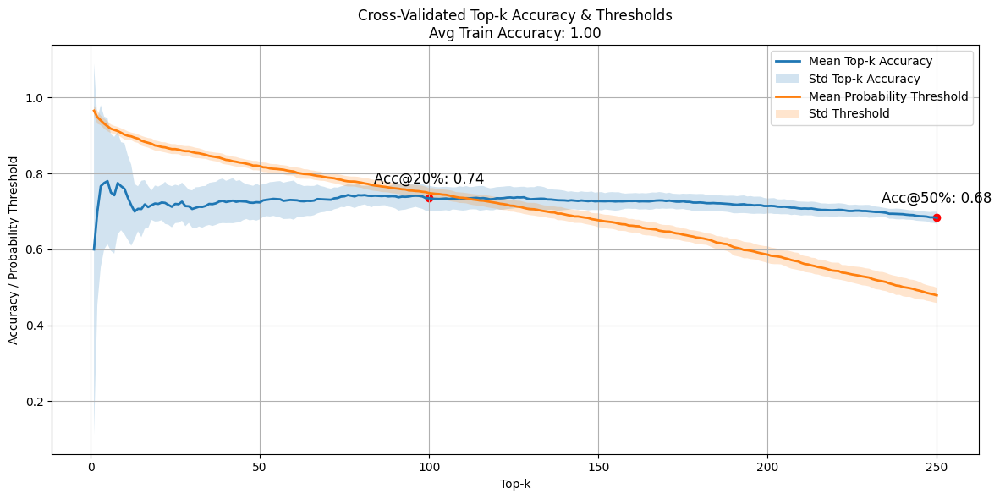

Test Accuracies (Overall): 0.70 ± 0.01
Sprawdzanie podzbioru: (2, 215, 7, 298)


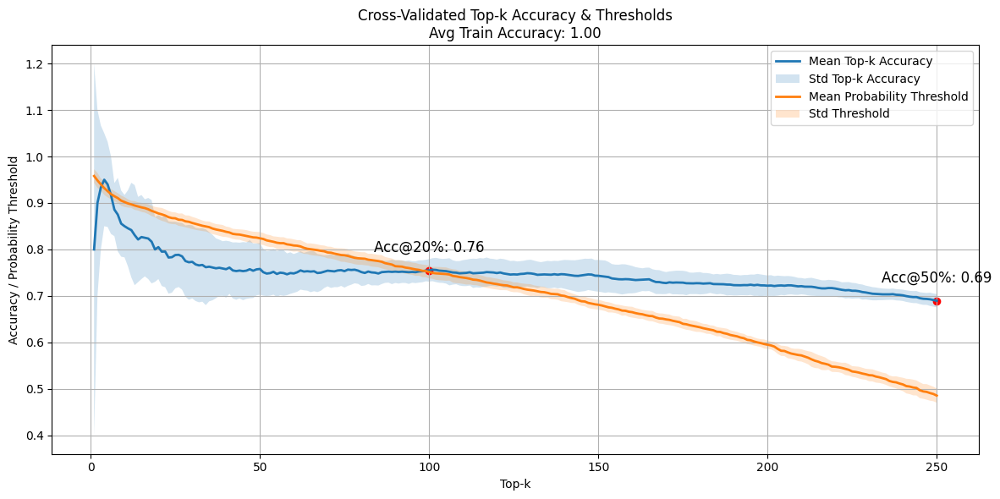

Test Accuracies (Overall): 0.70 ± 0.01
Sprawdzanie podzbioru: (2, 238, 351, 424)


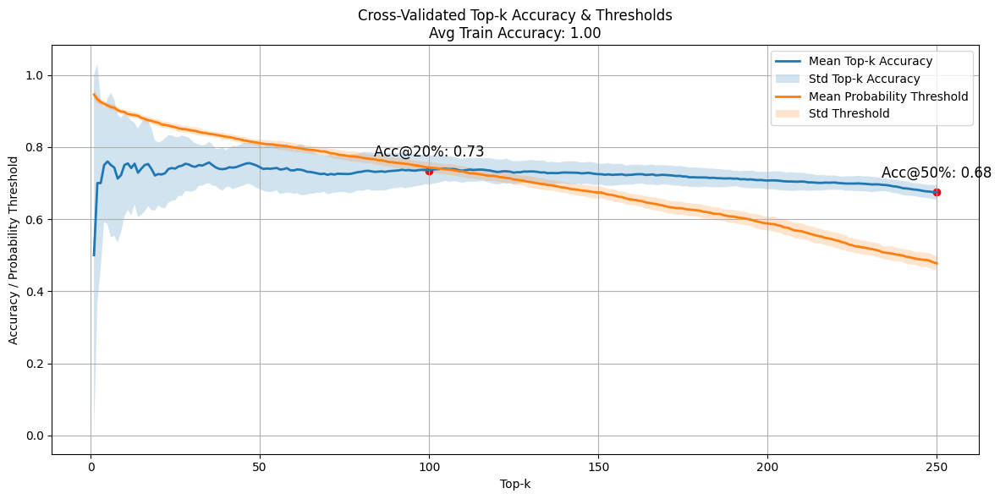

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 238, 351, 7)


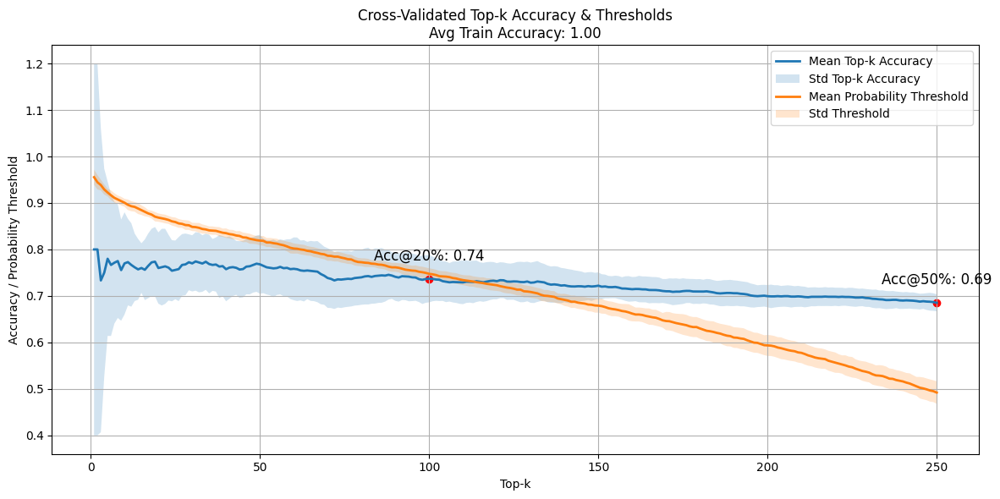

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 238, 351, 298)


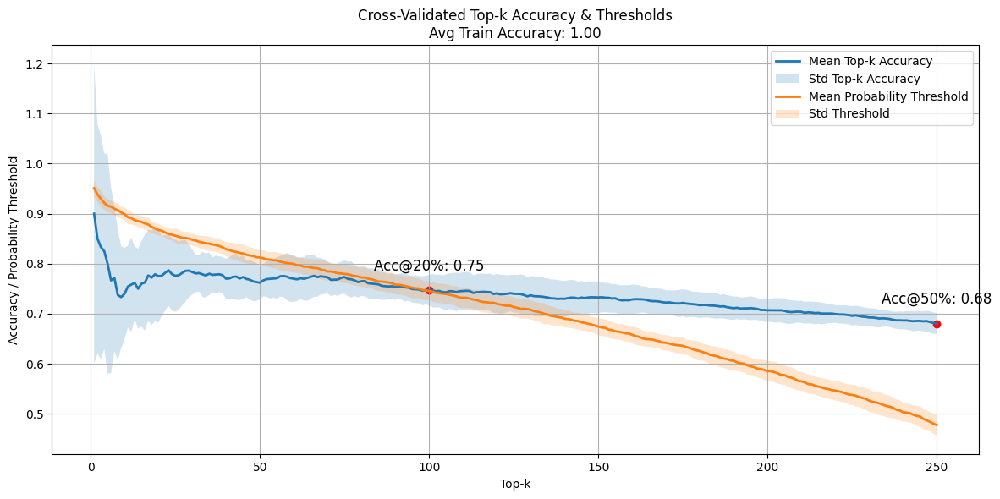

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 238, 424, 7)


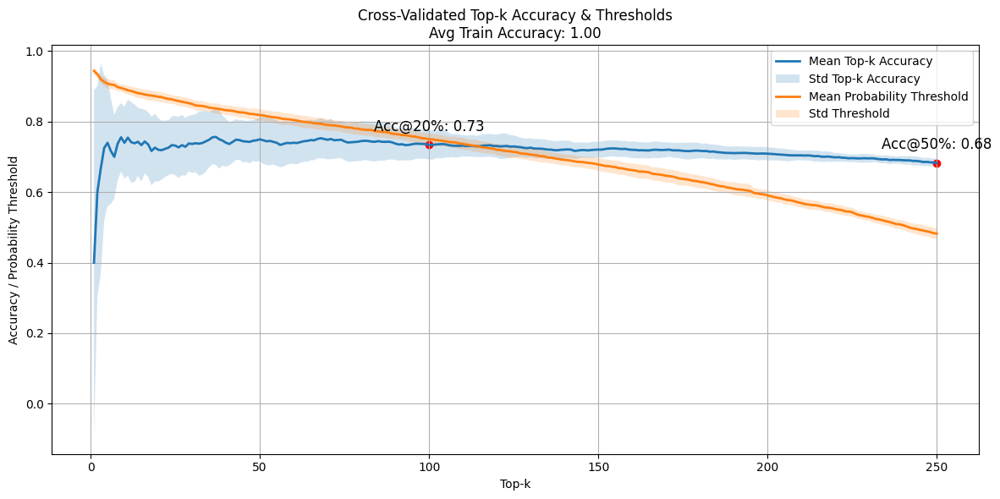

Test Accuracies (Overall): 0.69 ± 0.01
Sprawdzanie podzbioru: (2, 238, 424, 298)


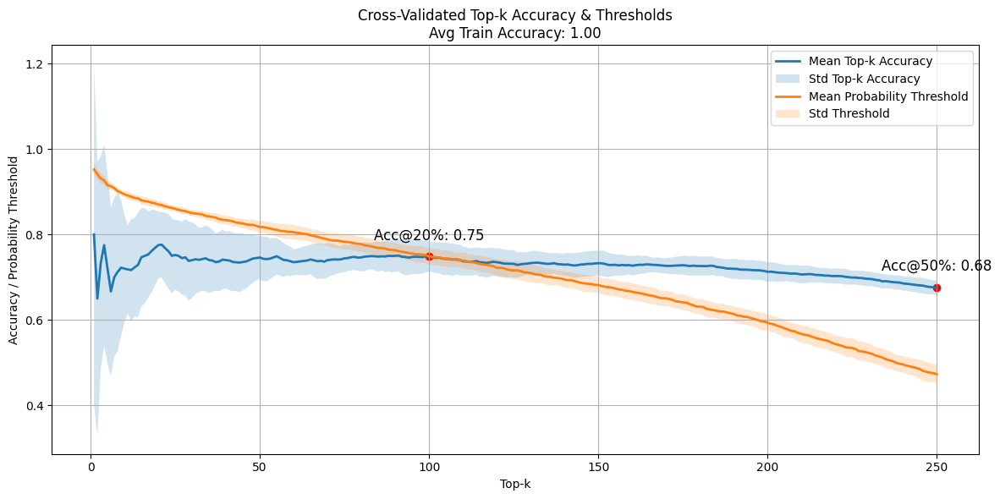

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 238, 7, 298)


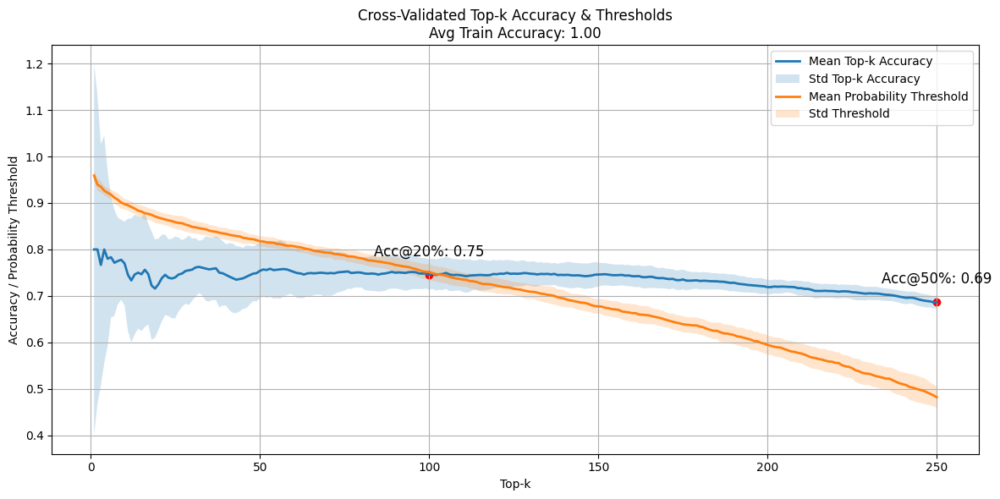

Test Accuracies (Overall): 0.70 ± 0.01
Sprawdzanie podzbioru: (2, 351, 424, 7)


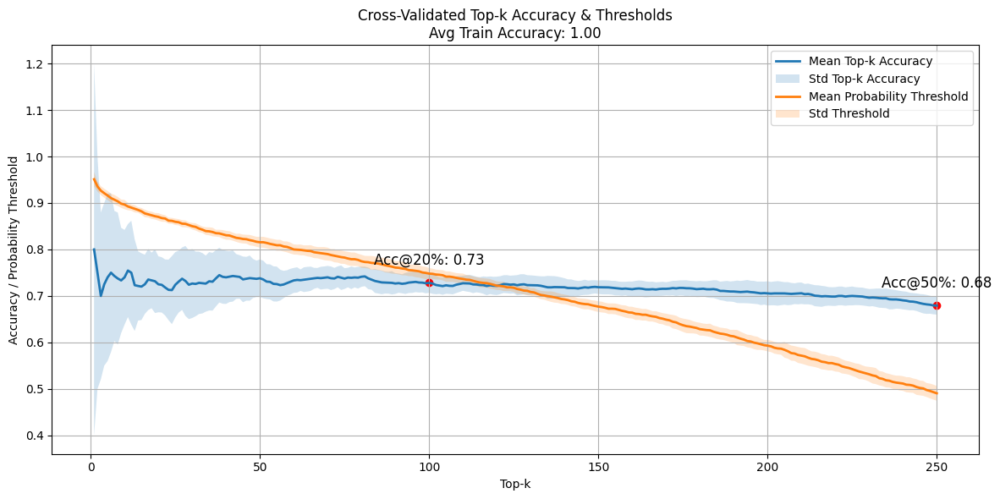

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 351, 424, 298)


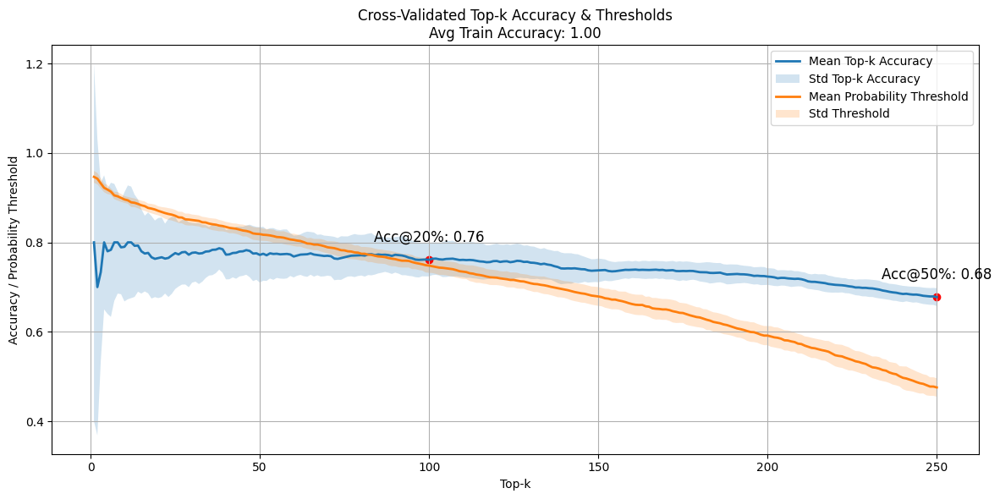

Test Accuracies (Overall): 0.69 ± 0.01
Sprawdzanie podzbioru: (2, 351, 7, 298)


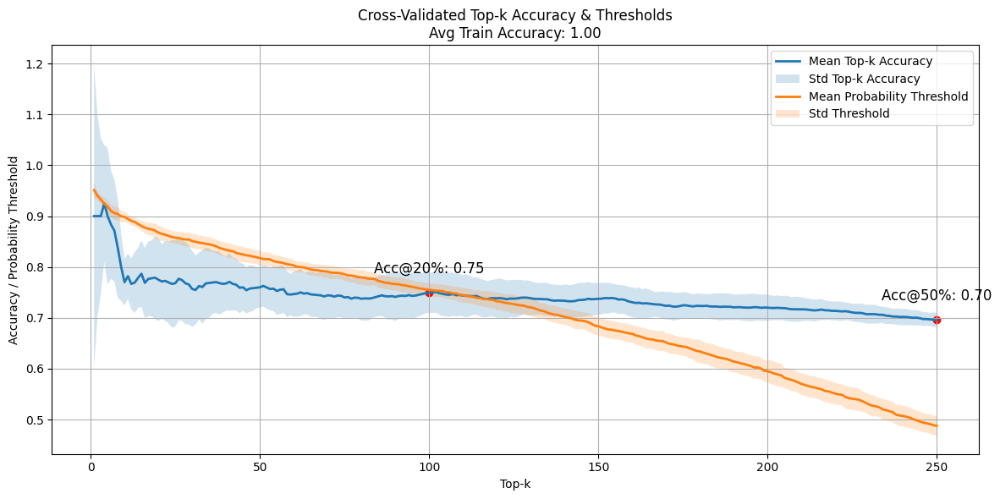

Test Accuracies (Overall): 0.71 ± 0.02
Sprawdzanie podzbioru: (2, 424, 7, 298)


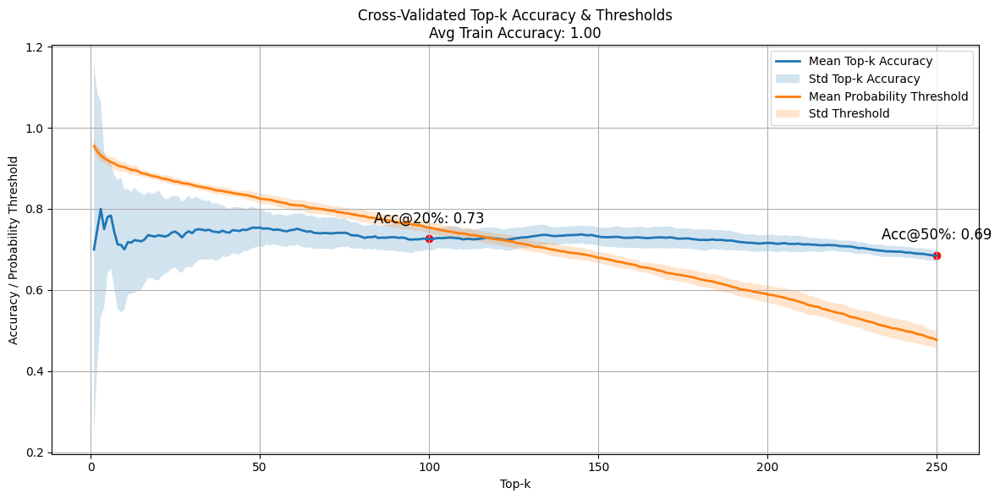

Test Accuracies (Overall): 0.70 ± 0.01
Sprawdzanie podzbioru: (215, 238, 351, 424)


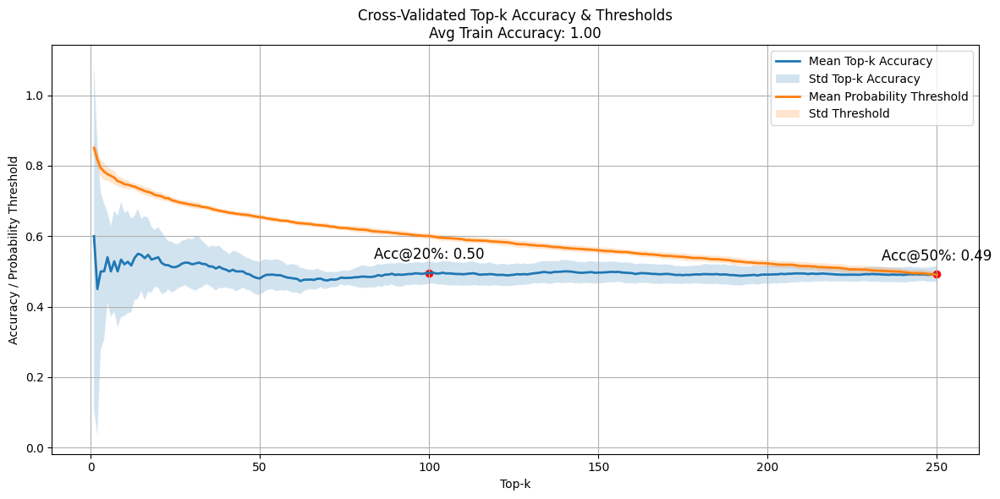

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (215, 238, 351, 7)


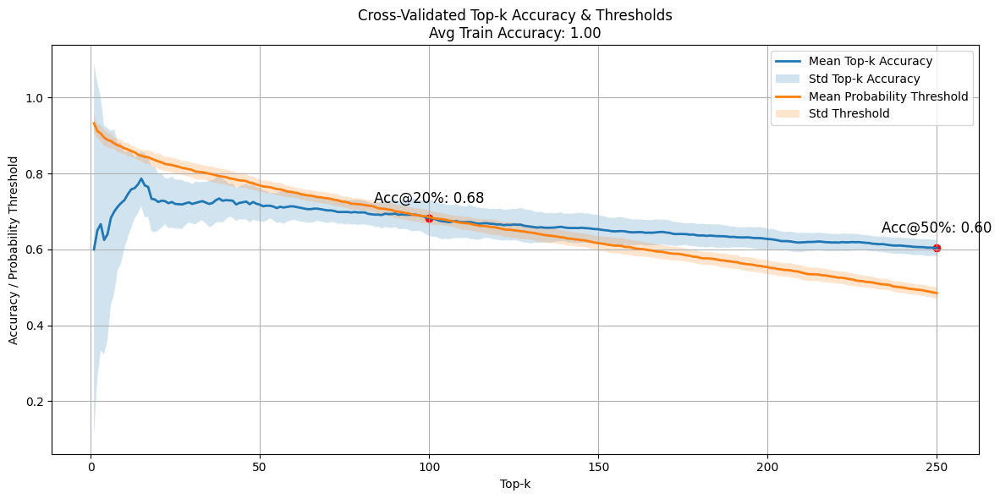

Test Accuracies (Overall): 0.61 ± 0.02
Sprawdzanie podzbioru: (215, 238, 351, 298)


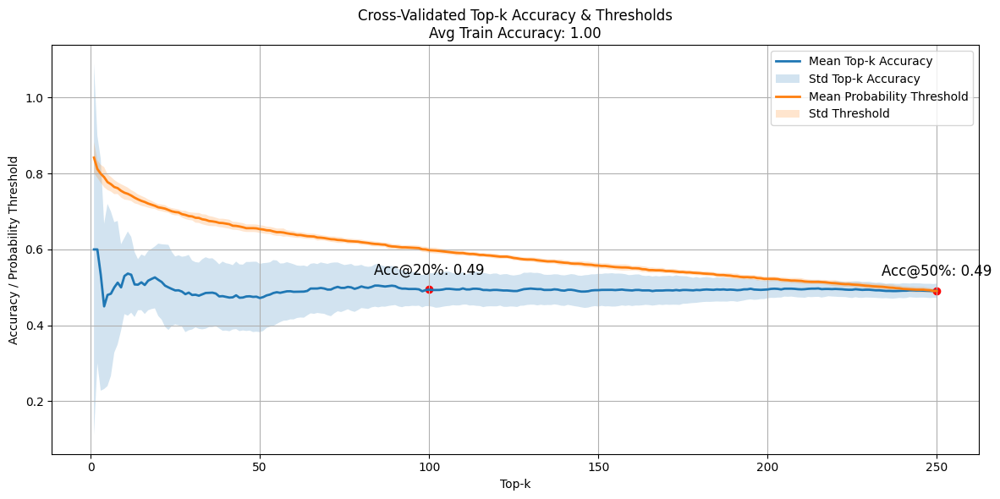

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (215, 238, 424, 7)


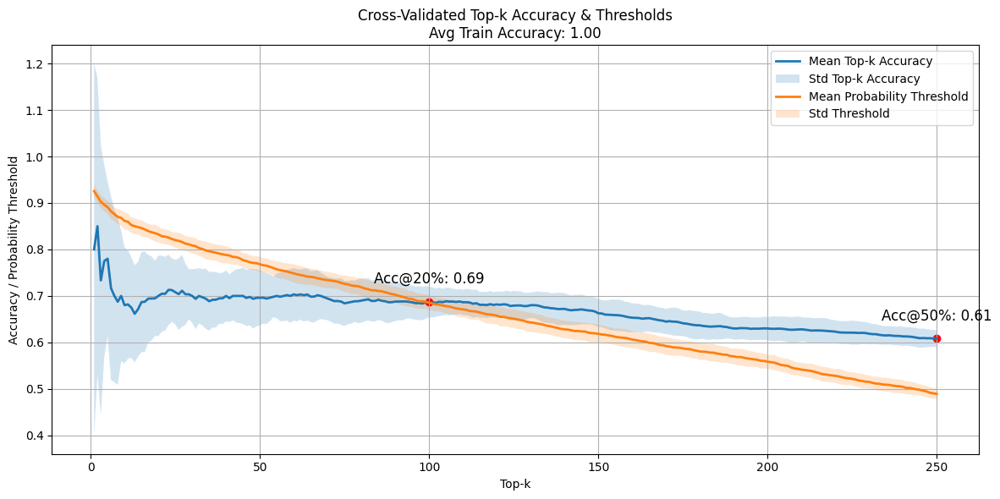

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (215, 238, 424, 298)


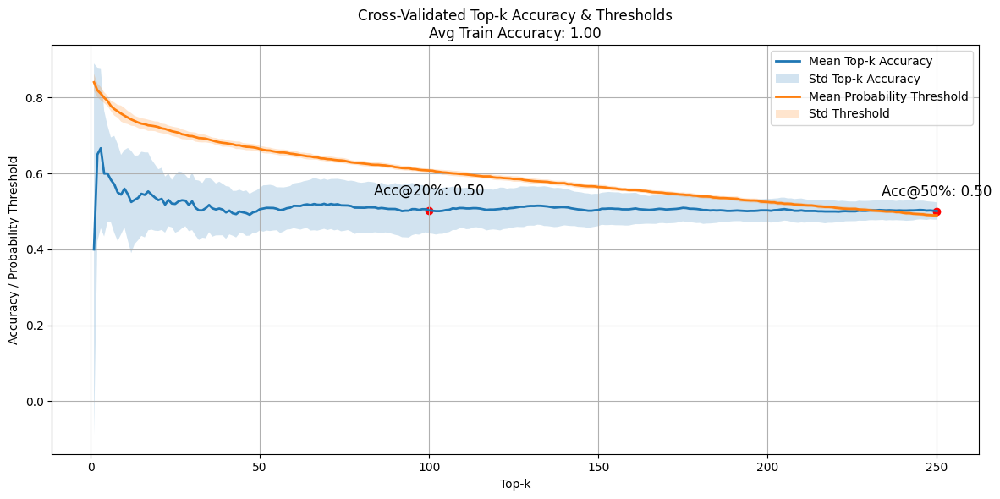

Test Accuracies (Overall): 0.51 ± 0.03
Sprawdzanie podzbioru: (215, 238, 7, 298)


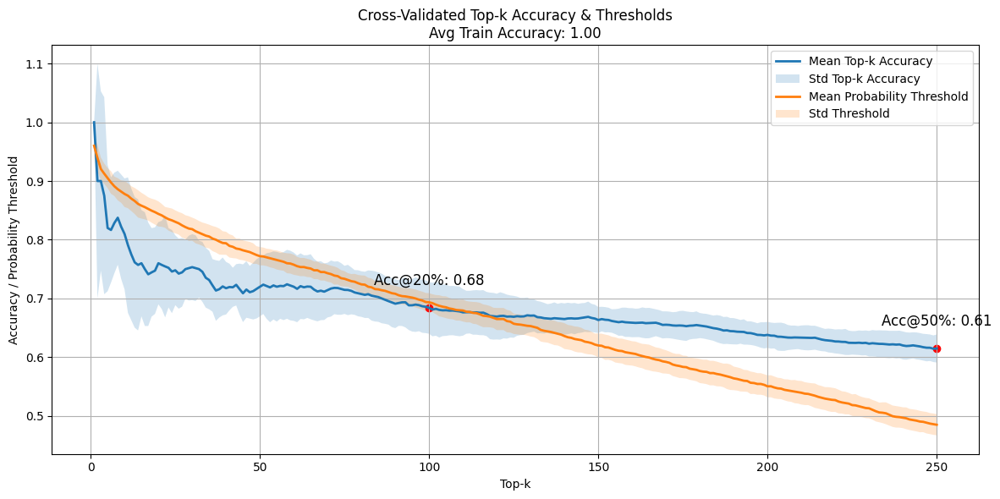

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (215, 351, 424, 7)


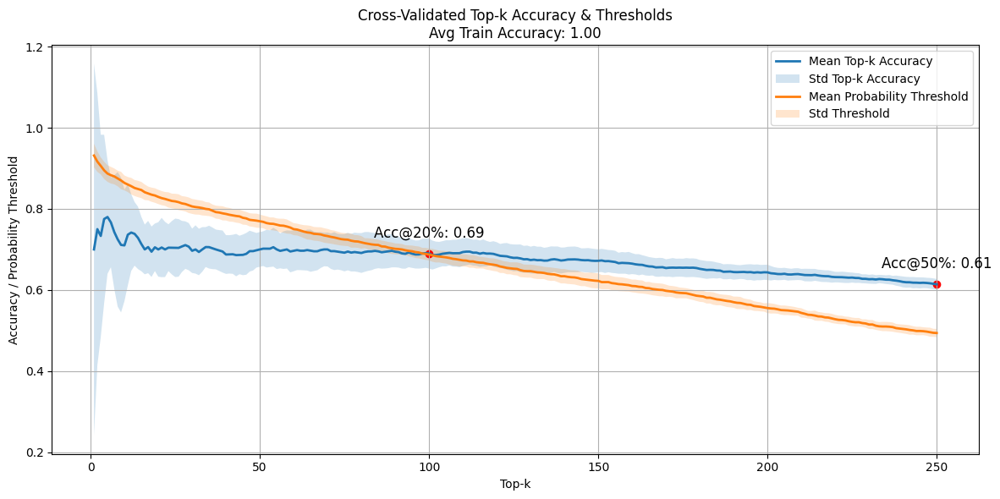

Test Accuracies (Overall): 0.63 ± 0.01
Sprawdzanie podzbioru: (215, 351, 424, 298)


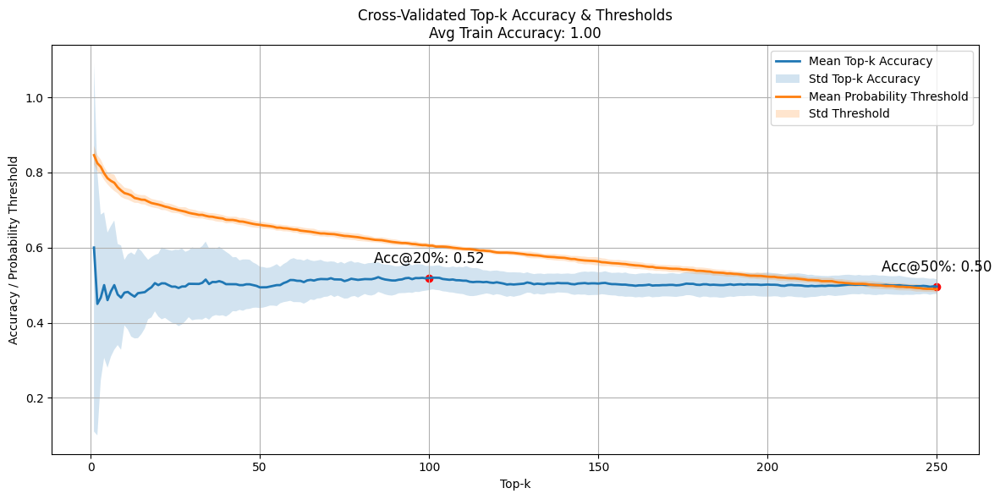

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (215, 351, 7, 298)


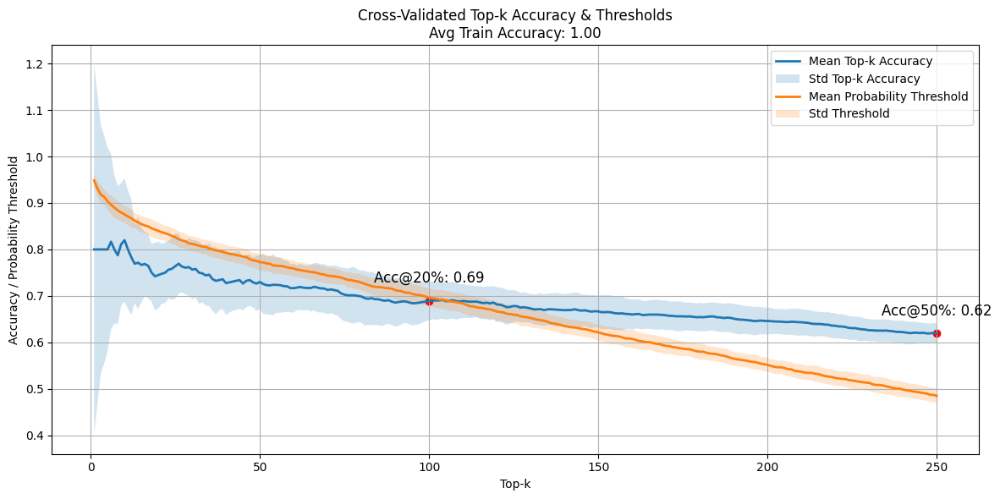

Test Accuracies (Overall): 0.63 ± 0.02
Sprawdzanie podzbioru: (215, 424, 7, 298)


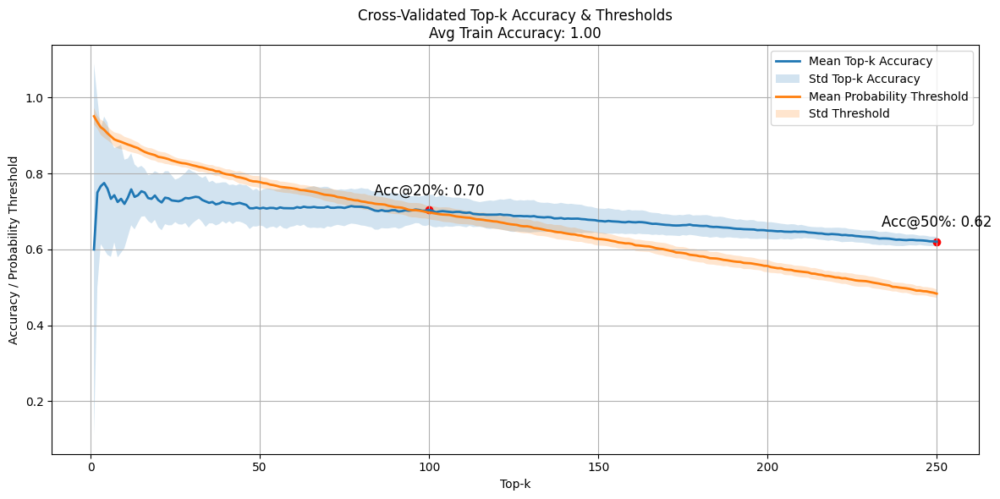

Test Accuracies (Overall): 0.63 ± 0.02
Sprawdzanie podzbioru: (238, 351, 424, 7)


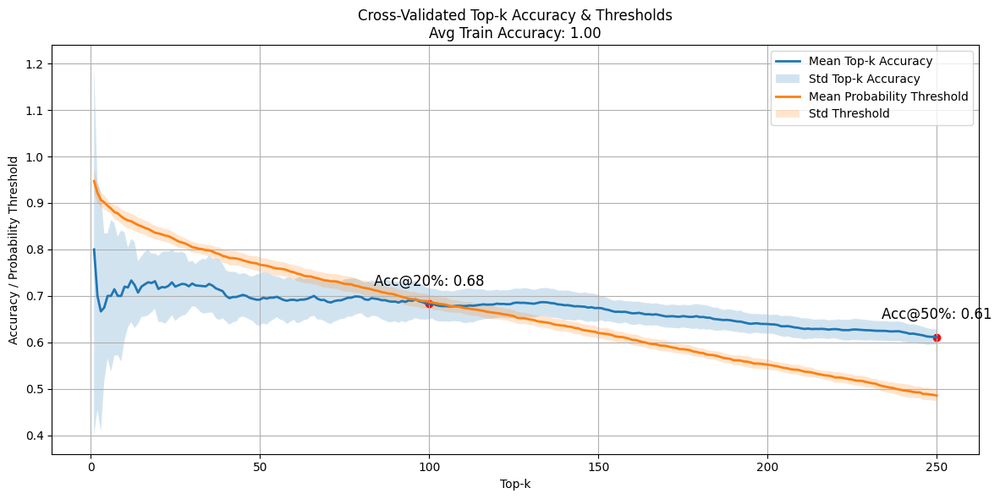

Test Accuracies (Overall): 0.63 ± 0.02
Sprawdzanie podzbioru: (238, 351, 424, 298)


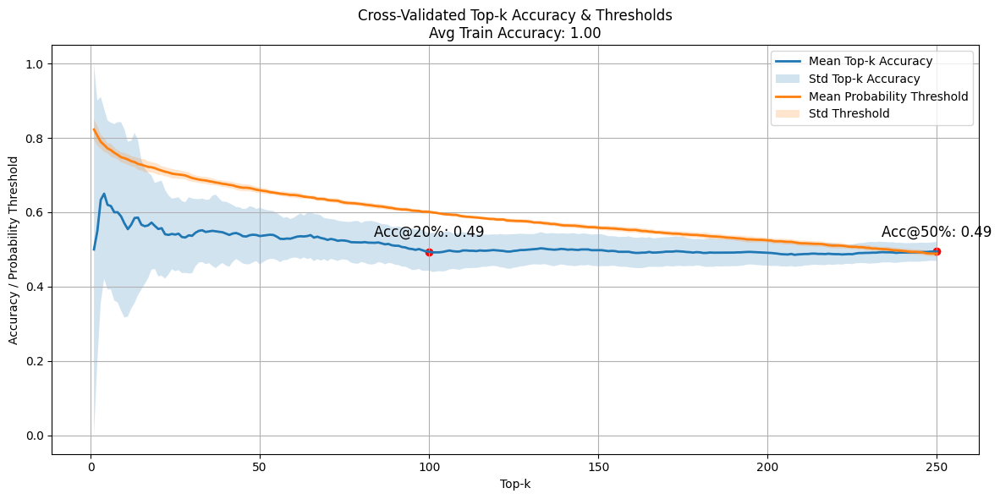

Test Accuracies (Overall): 0.50 ± 0.03
Sprawdzanie podzbioru: (238, 351, 7, 298)


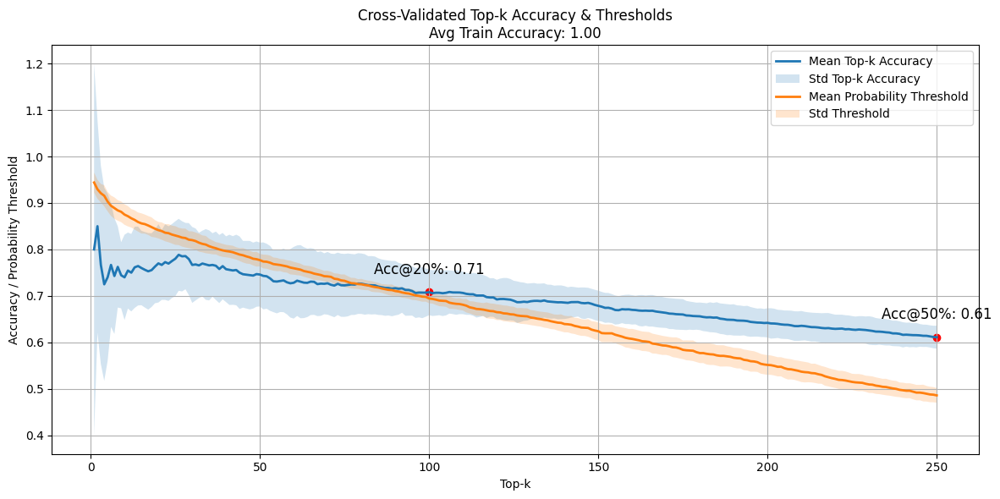

Test Accuracies (Overall): 0.63 ± 0.03
Sprawdzanie podzbioru: (238, 424, 7, 298)


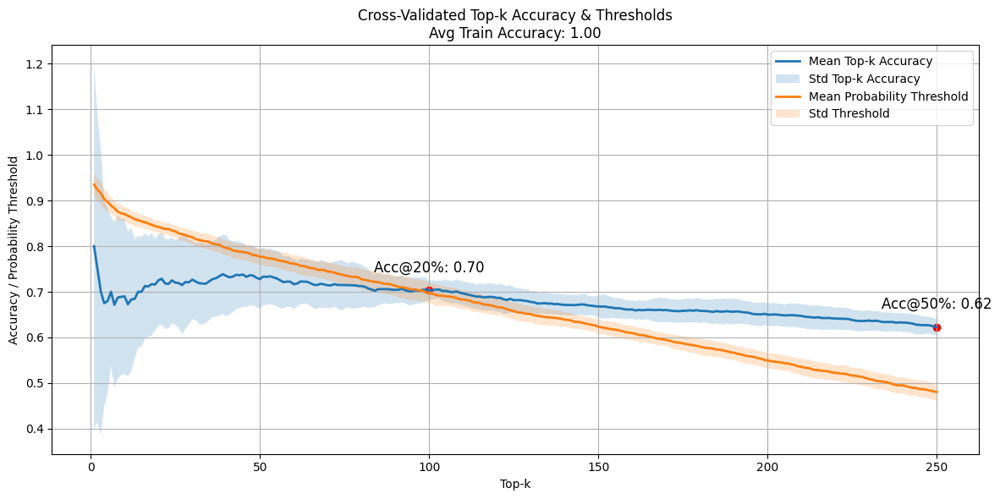

Test Accuracies (Overall): 0.64 ± 0.02
Sprawdzanie podzbioru: (351, 424, 7, 298)


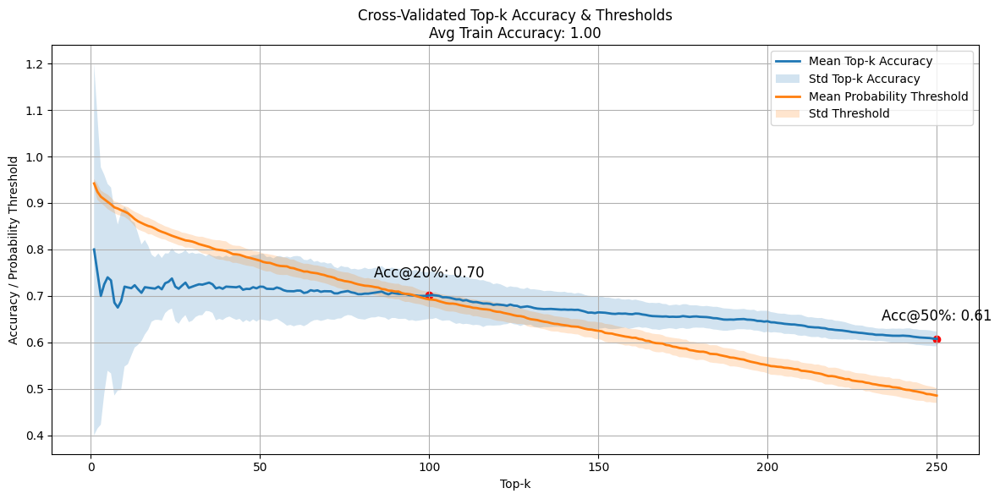

Test Accuracies (Overall): 0.62 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351, 424)


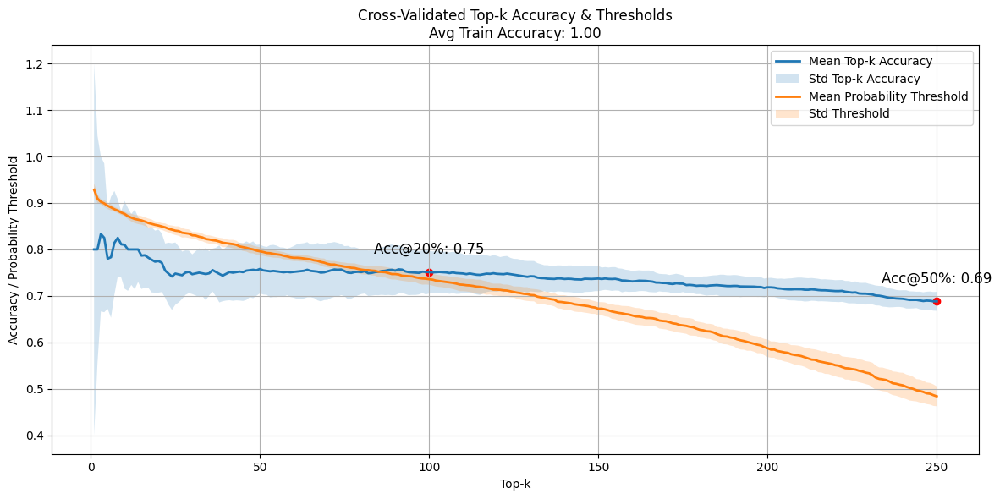

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351, 7)


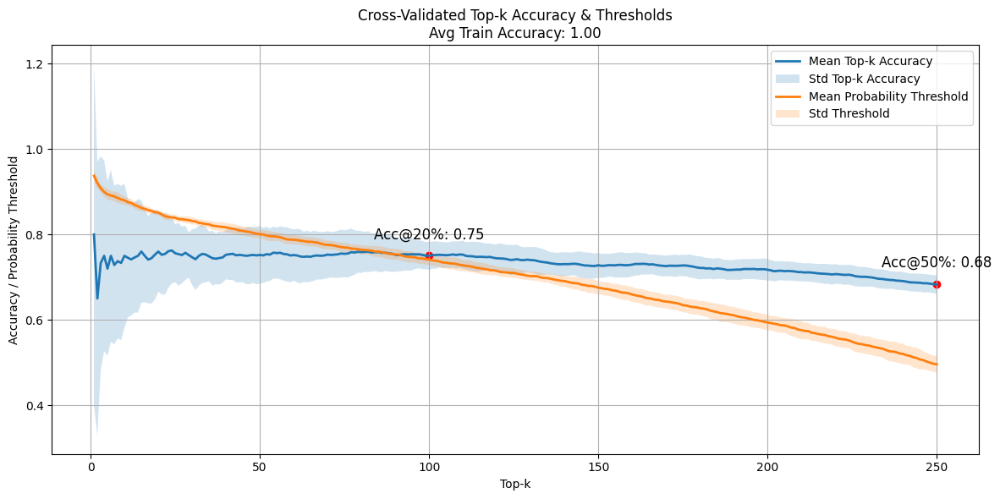

Test Accuracies (Overall): 0.69 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351, 298)


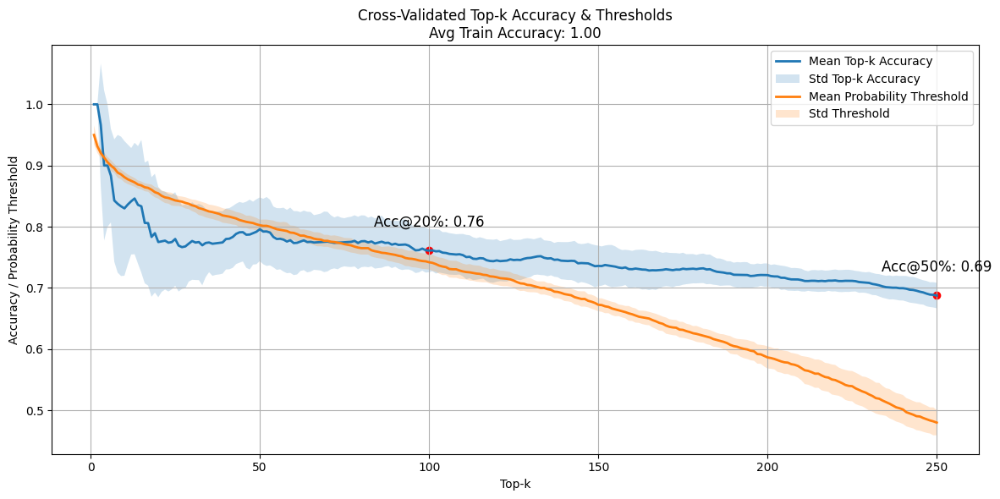

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 424, 7)


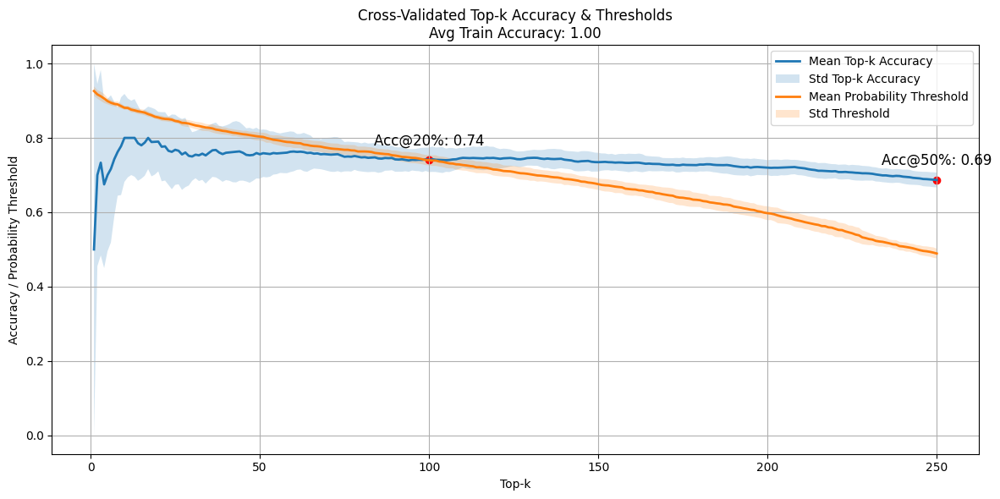

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 424, 298)


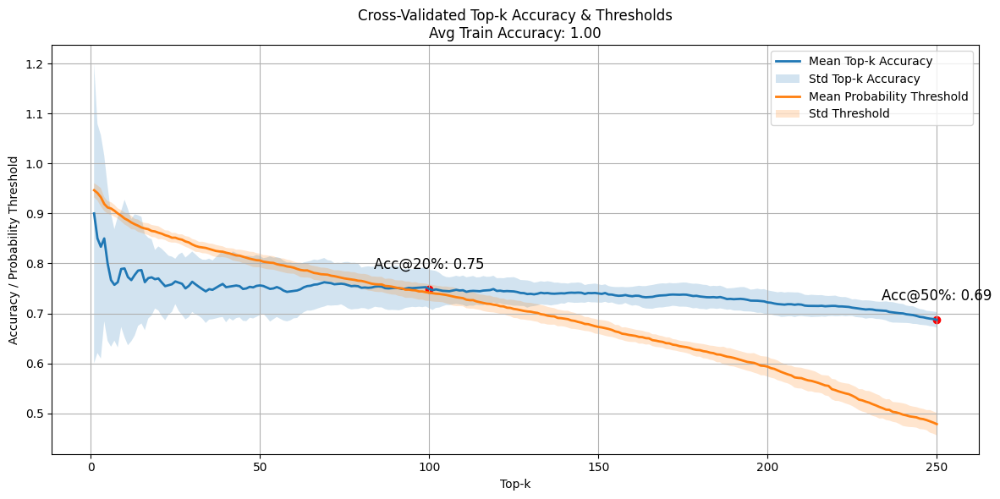

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 7, 298)


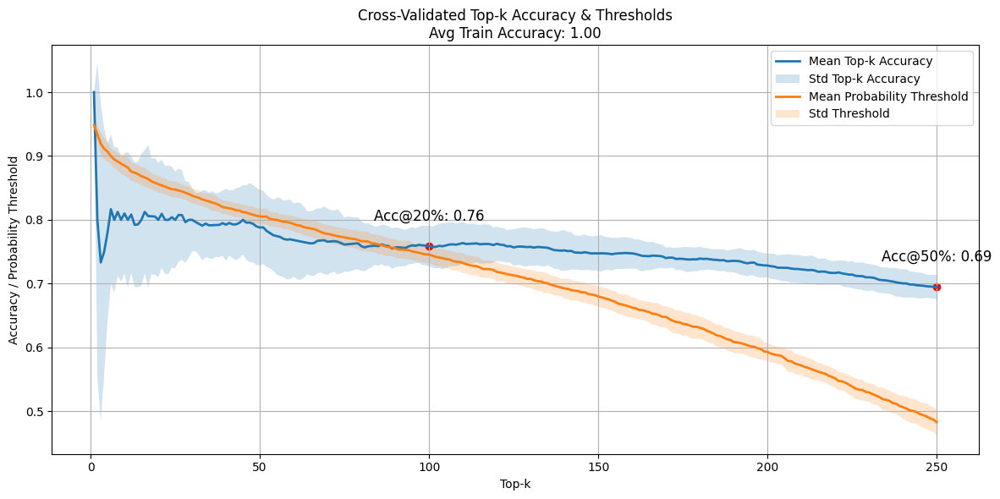

Test Accuracies (Overall): 0.71 ± 0.02
Sprawdzanie podzbioru: (2, 215, 351, 424, 7)


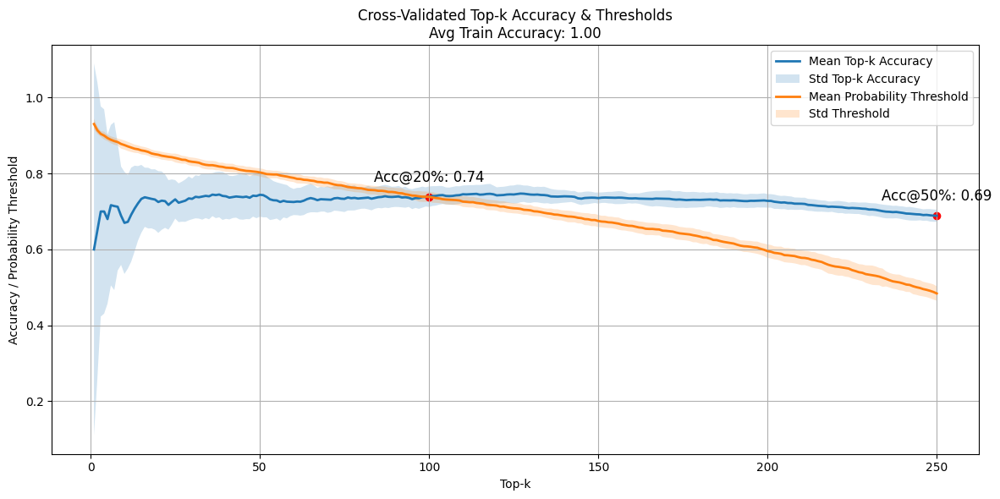

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 215, 351, 424, 298)


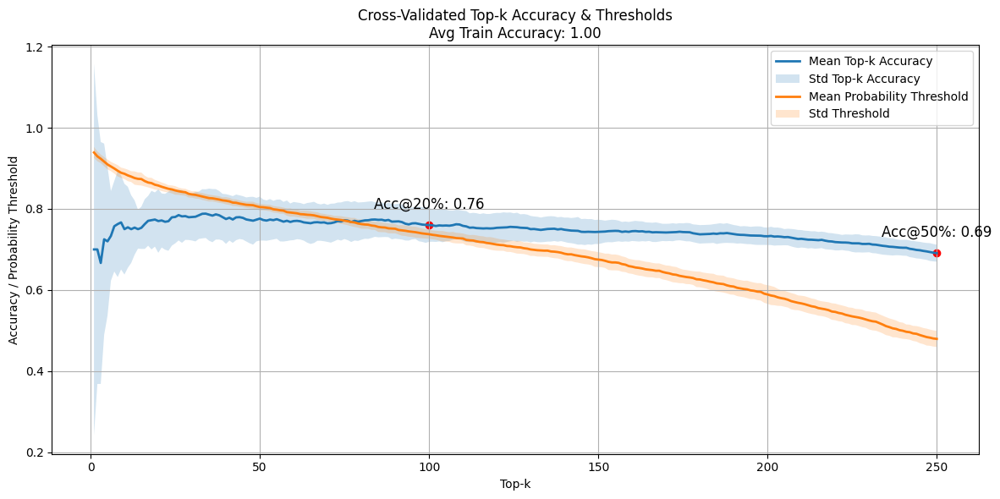

Test Accuracies (Overall): 0.71 ± 0.02
Sprawdzanie podzbioru: (2, 215, 351, 7, 298)


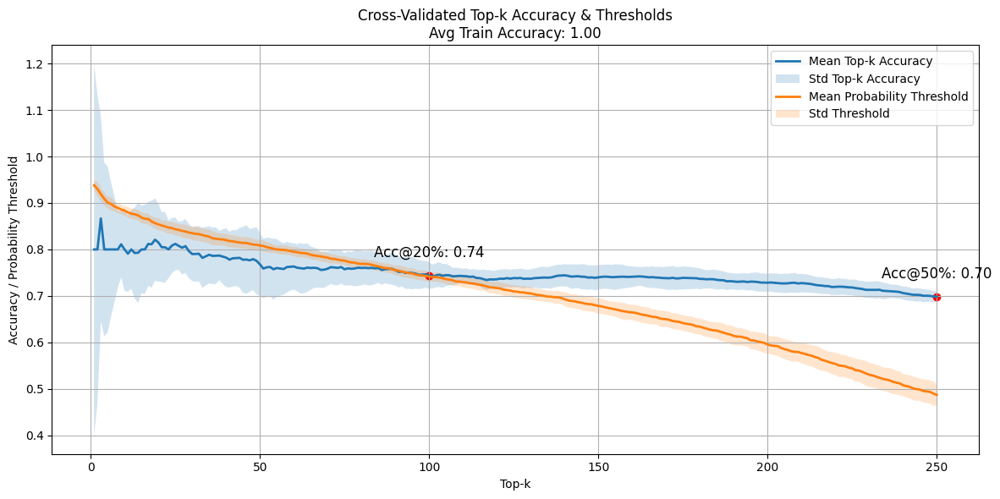

Test Accuracies (Overall): 0.71 ± 0.01
Sprawdzanie podzbioru: (2, 215, 424, 7, 298)


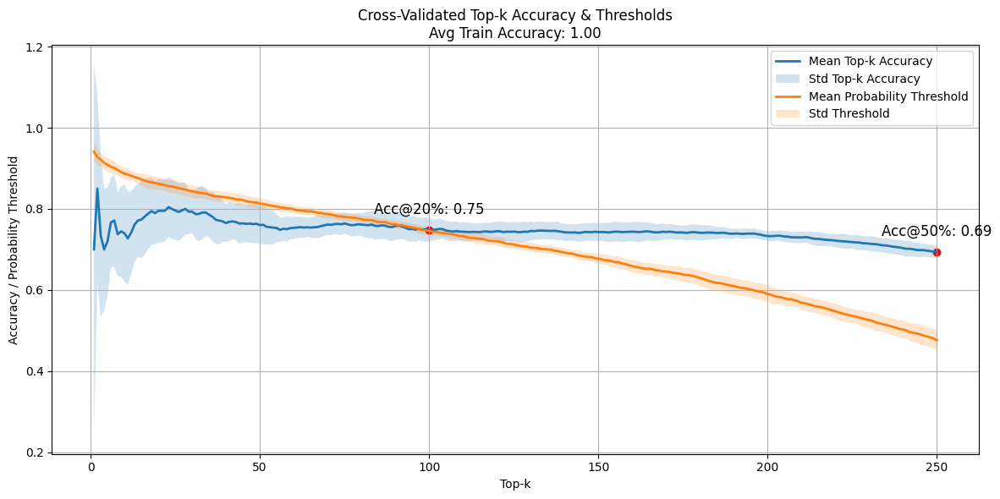

Test Accuracies (Overall): 0.71 ± 0.02
Sprawdzanie podzbioru: (2, 238, 351, 424, 7)


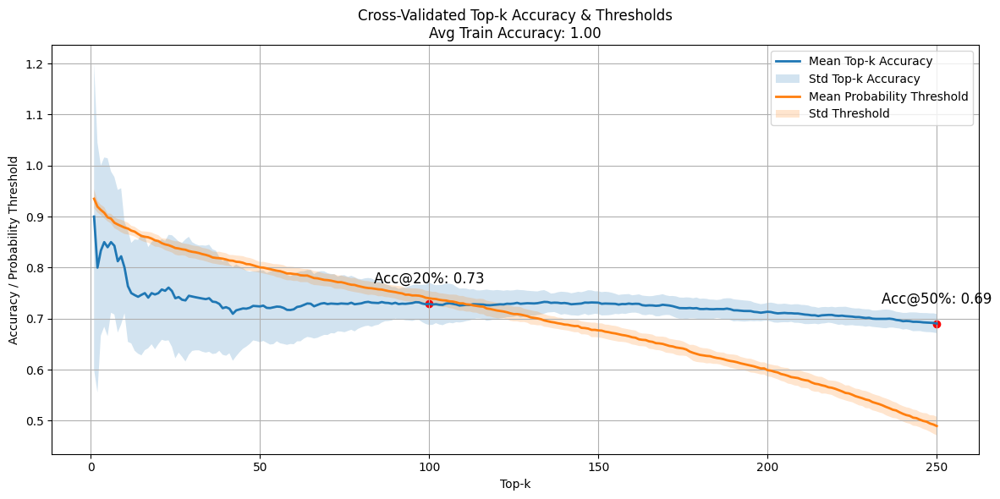

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 238, 351, 424, 298)


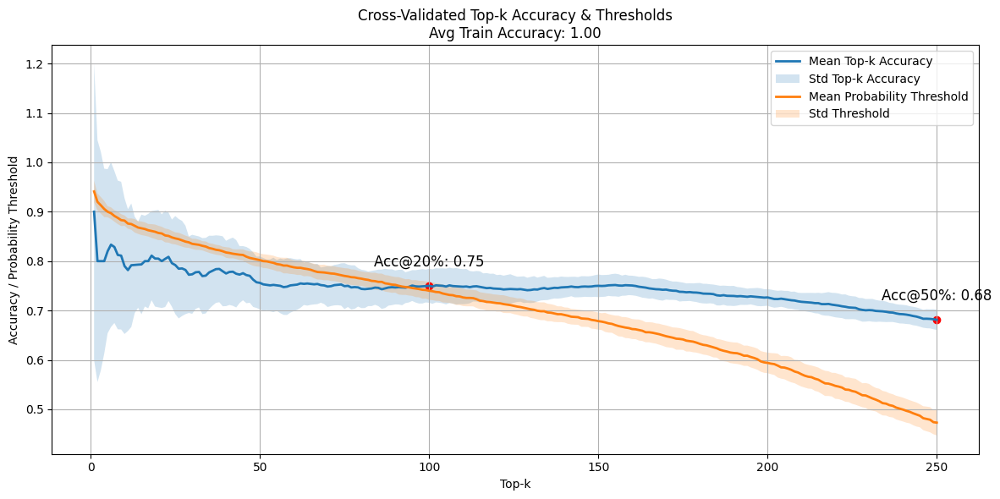

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (2, 238, 351, 7, 298)


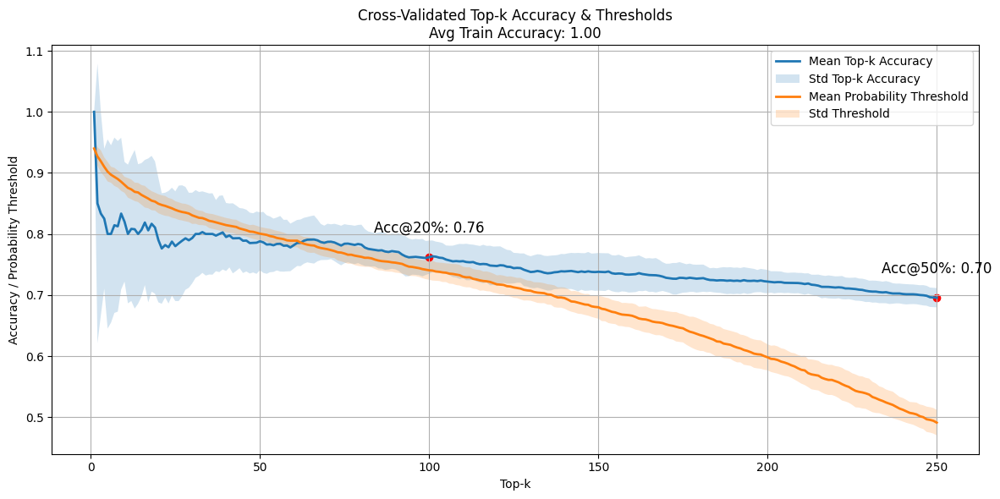

Test Accuracies (Overall): 0.71 ± 0.01
Sprawdzanie podzbioru: (2, 238, 424, 7, 298)


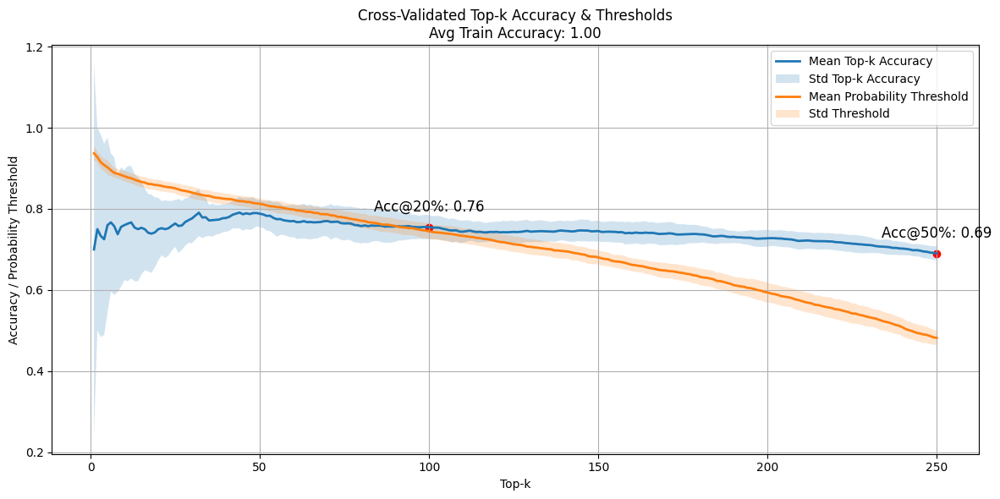

Test Accuracies (Overall): 0.71 ± 0.02
Sprawdzanie podzbioru: (2, 351, 424, 7, 298)


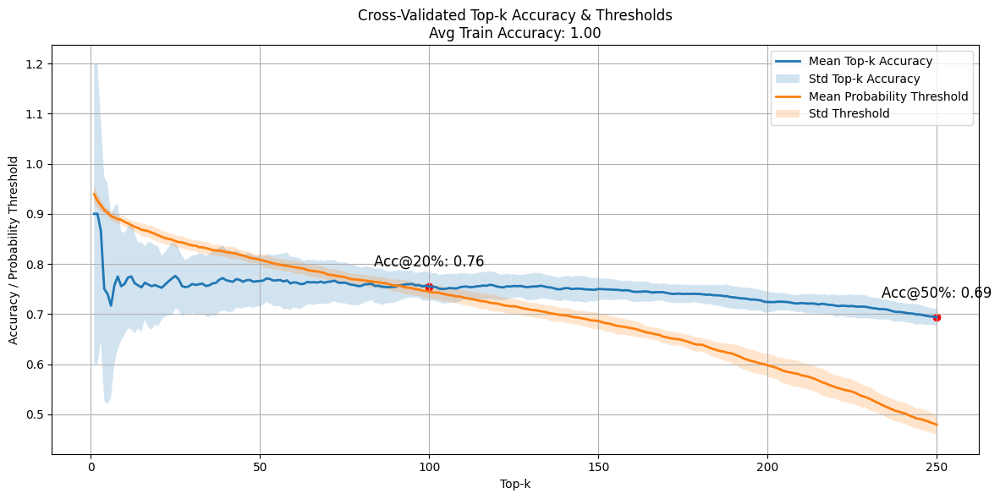

Test Accuracies (Overall): 0.70 ± 0.02
Sprawdzanie podzbioru: (215, 238, 351, 424, 7)


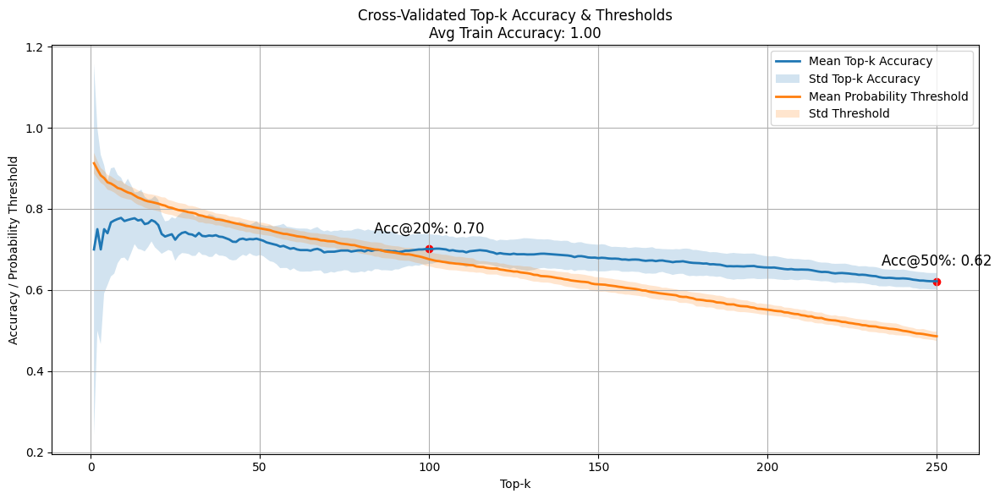

Test Accuracies (Overall): 0.64 ± 0.02
Sprawdzanie podzbioru: (215, 238, 351, 424, 298)


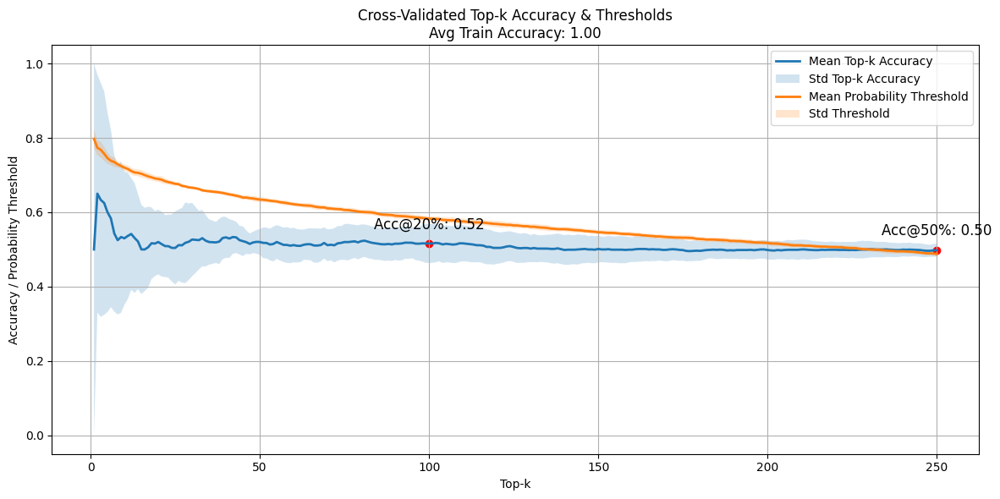

Test Accuracies (Overall): 0.51 ± 0.02
Sprawdzanie podzbioru: (215, 238, 351, 7, 298)


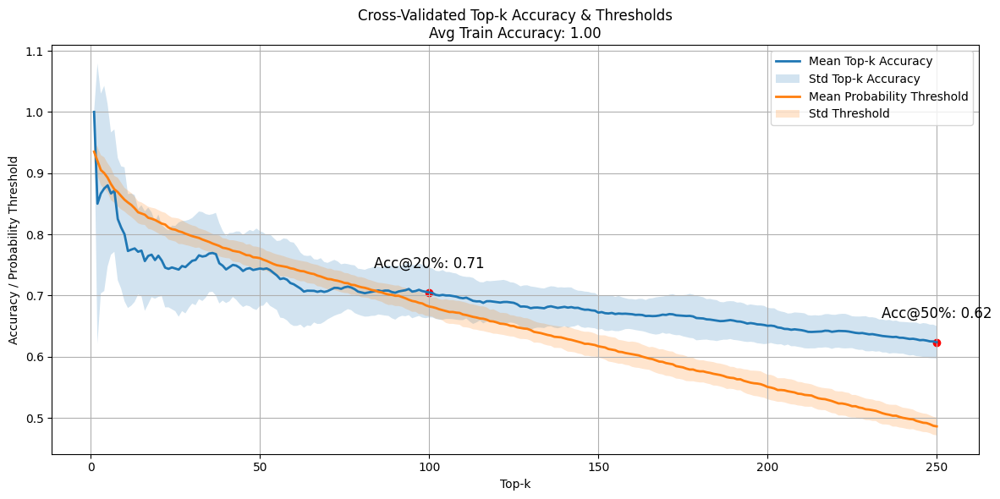

Test Accuracies (Overall): 0.64 ± 0.02
Sprawdzanie podzbioru: (215, 238, 424, 7, 298)


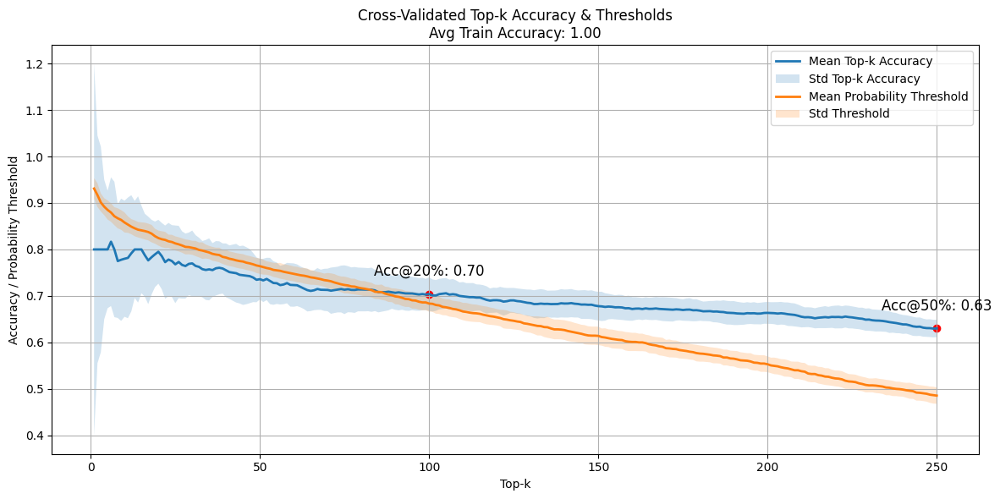

Test Accuracies (Overall): 0.64 ± 0.02
Sprawdzanie podzbioru: (215, 351, 424, 7, 298)


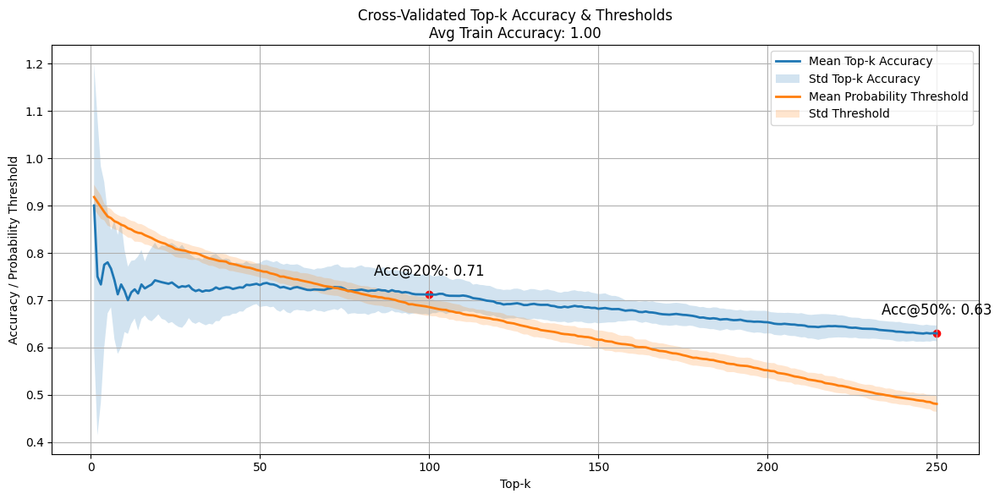

Test Accuracies (Overall): 0.64 ± 0.02
Sprawdzanie podzbioru: (238, 351, 424, 7, 298)


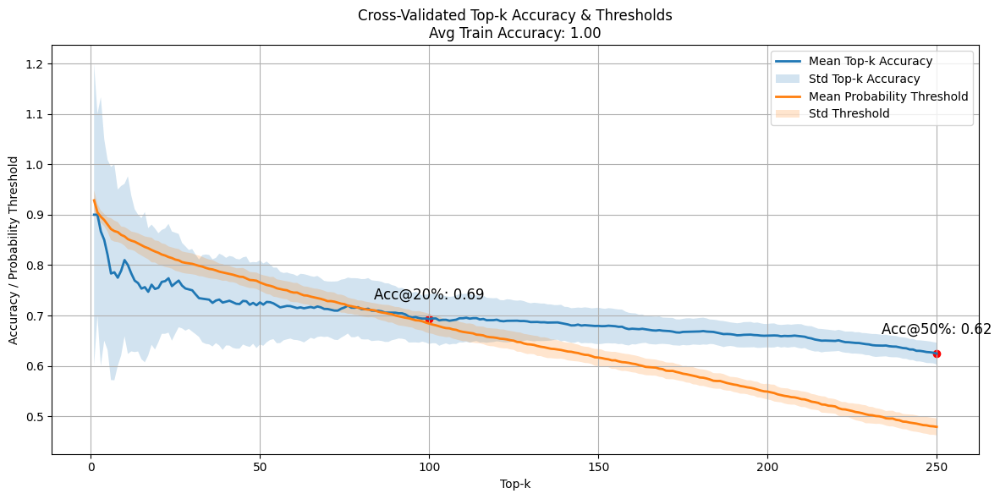

Test Accuracies (Overall): 0.64 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351, 424, 7)


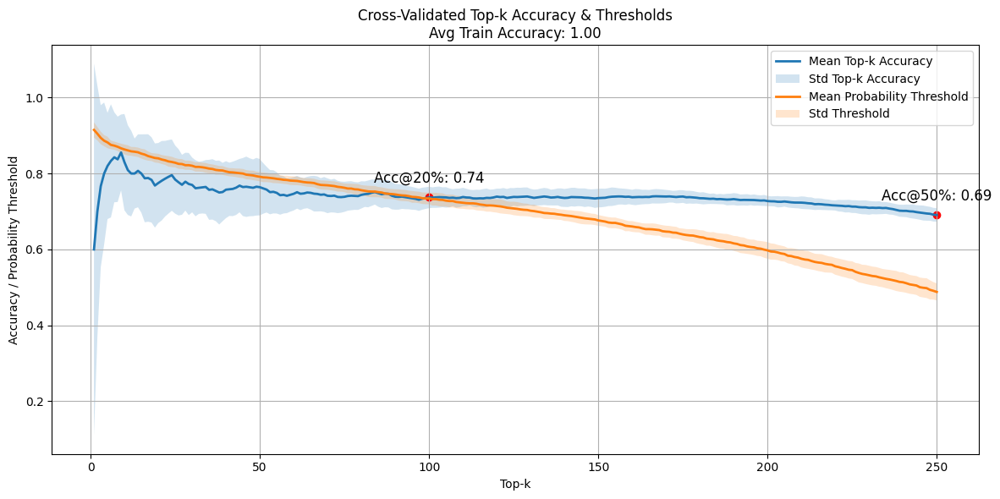

Test Accuracies (Overall): 0.71 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351, 424, 298)


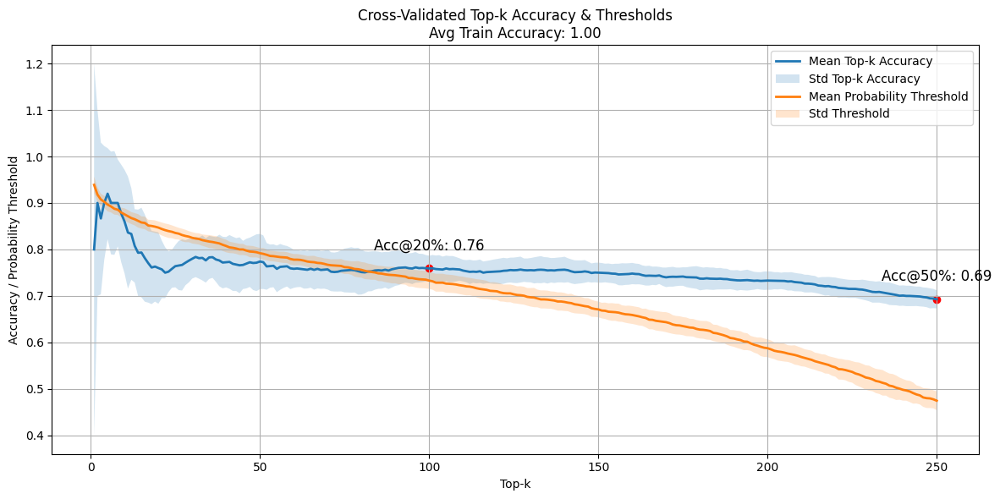

Test Accuracies (Overall): 0.71 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351, 7, 298)


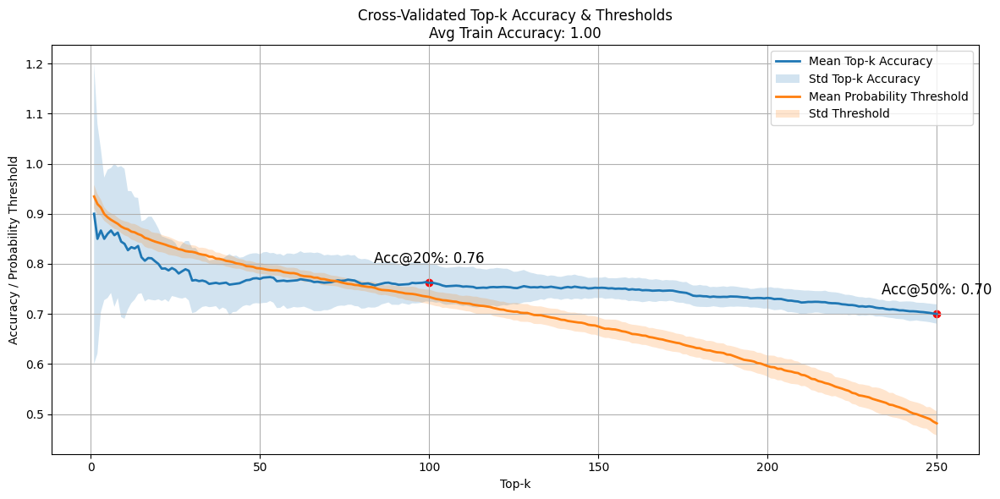

Test Accuracies (Overall): 0.71 ± 0.01
Sprawdzanie podzbioru: (2, 215, 238, 424, 7, 298)


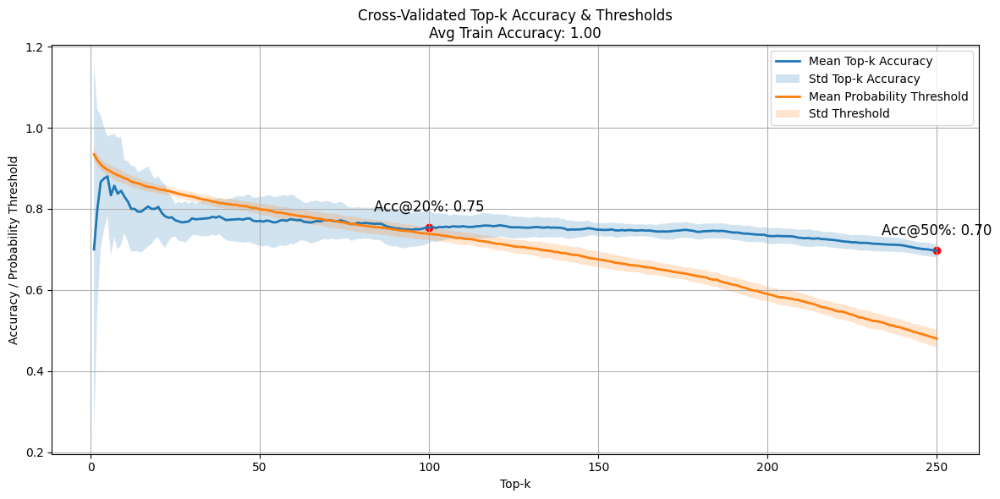

Test Accuracies (Overall): 0.71 ± 0.01
Sprawdzanie podzbioru: (2, 215, 351, 424, 7, 298)


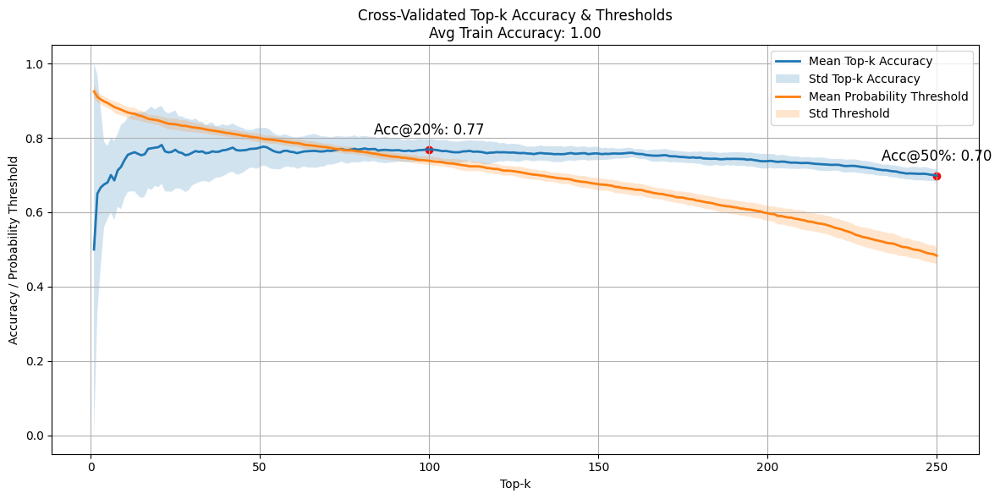

Test Accuracies (Overall): 0.71 ± 0.01
Sprawdzanie podzbioru: (2, 238, 351, 424, 7, 298)


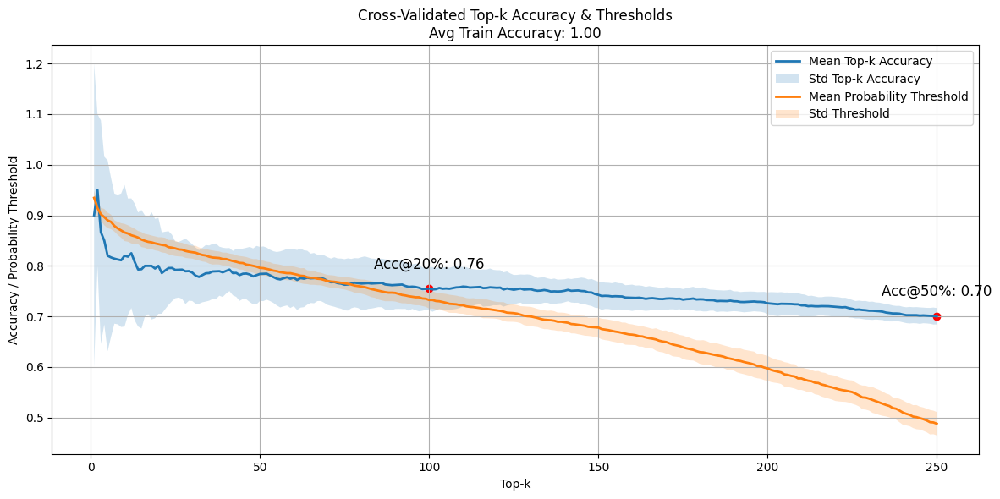

Test Accuracies (Overall): 0.71 ± 0.01
Sprawdzanie podzbioru: (215, 238, 351, 424, 7, 298)


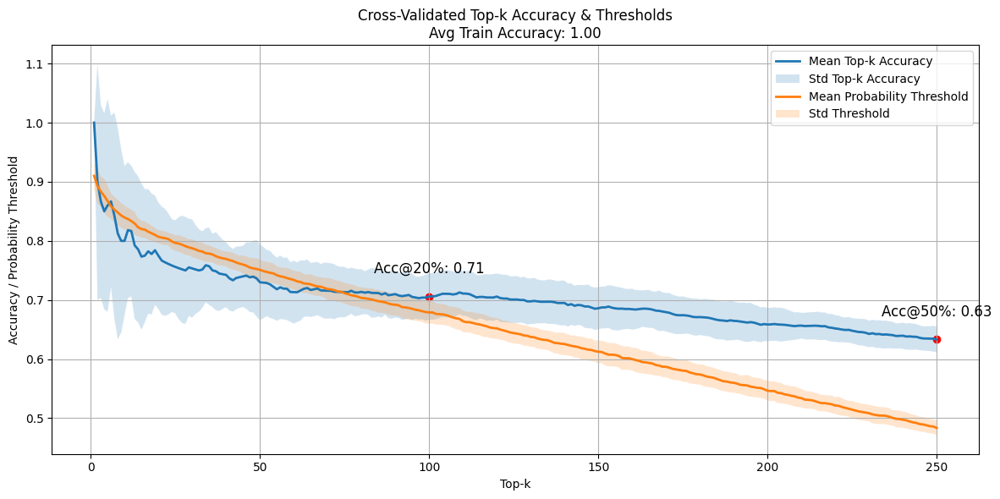

Test Accuracies (Overall): 0.64 ± 0.02
Sprawdzanie podzbioru: (2, 215, 238, 351, 424, 7, 298)


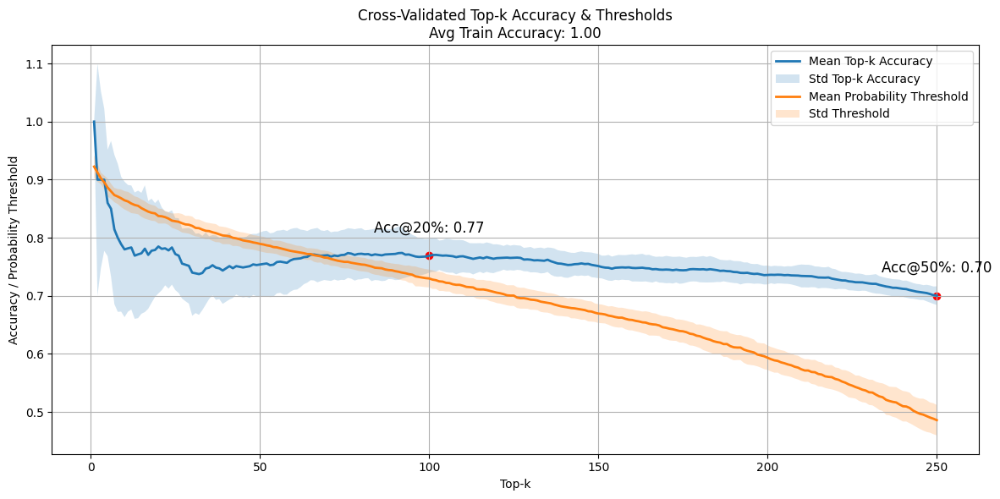

Test Accuracies (Overall): 0.71 ± 0.01
Najlepszy podzbiór: (2, 215, 238, 351, 424, 7, 298)
Najlepszy wynik: 0.7702970297029702


In [212]:
from itertools import combinations
# TESTUJE WSZYSTKIE PODZBIORY CECH
best_score = -np.inf
best_subset = None
comparator = ModelComparator(X, y, n_splits=10)
selected =[2,215,238,351,424,7,298]

for r in range(1, len(selected)+1):
    for subset in combinations(selected, r):
        print("Sprawdzanie podzbioru:", subset)
        score = comparator.evaluate_model(final_clf, variables=list(subset))
        if score > best_score:
            best_score = score
            best_subset = subset

print("Najlepszy podzbiór:", best_subset)
print("Najlepszy wynik:", best_score)

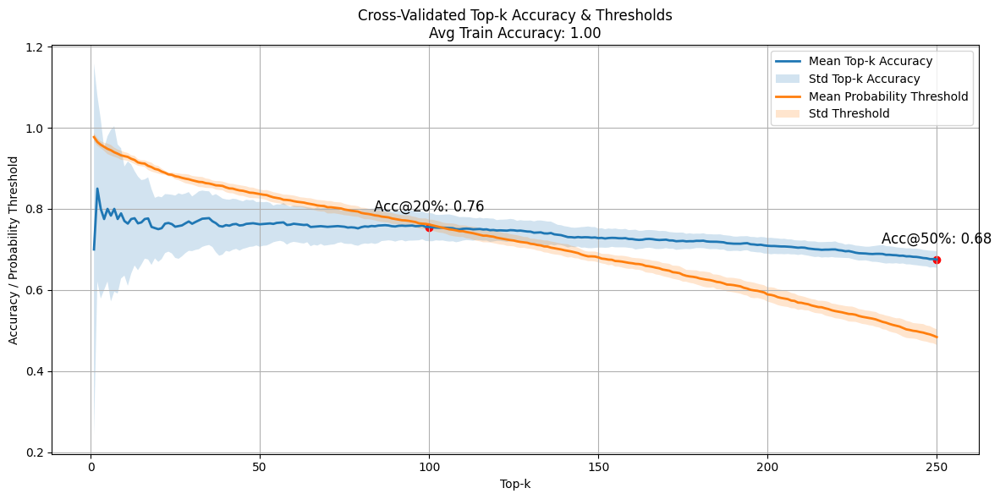

Test Accuracies (Overall): 0.69 ± 0.02


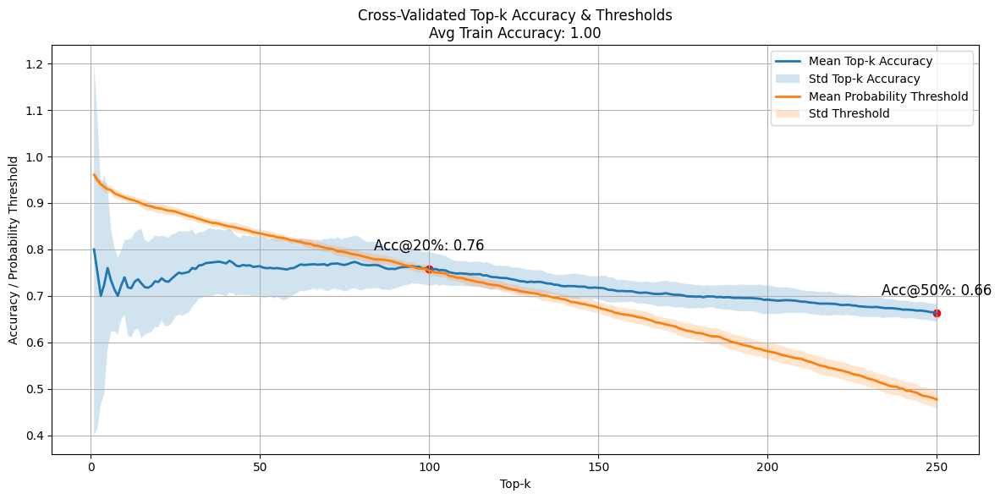

Test Accuracies (Overall): 0.67 ± 0.02


In [221]:
#^ z tego wyłoniły się zestawy [2, 215, 7] i [2, 215, 238] ale wykresy mniej ciekawie wyglądają:
selected_three_features=['2', '215', '7']
clf_three_vars = RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE)
clf_three_vars.fit(X[selected_three_features], y)
criterion = comparator.evaluate_model(clf_three_vars,
                          variables=[2, 215, 7])
criterion = comparator.evaluate_model(clf_three_vars,
                          variables=[2, 215, 238])

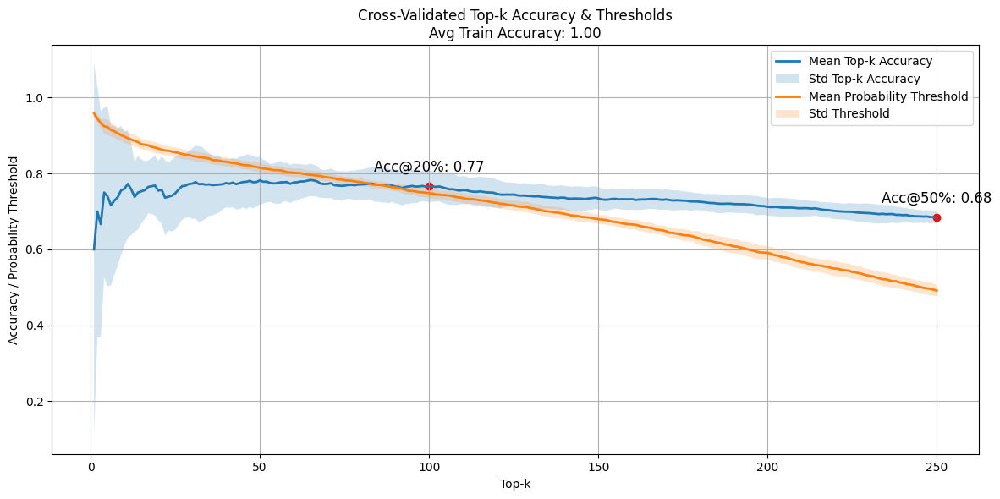

Test Accuracies (Overall): 0.70 ± 0.02


In [217]:
comparator = ModelComparator(X, y, n_splits=10)
selected_features = ['2', '215', '238', '7']
clf = RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE)
clf.fit(X[selected_features], y)
criterion = comparator.evaluate_model(clf,
                          variables=[2, 215, 238, 7]) 

In [222]:
# saving the results
X_test = pd.read_table('x_test.txt', sep=" ", header=None)
selected_features=[2, 215, 7]
y_proba = clf_three_vars.predict_proba(X_test[selected_features])[:, 1]

top_1000_idx = np.argsort(y_proba)[::-1][:1000]


np.savetxt('predictions_evolution_three_vars.txt', top_1000_idx, fmt='%d')